# Crisp DM Workflow

# Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Loading Data set

In [2]:
df = pd.read_csv("pollutant-standards-index-southtangerang-2020-2022.csv")
df

,Date,PM2.5,PM10,SO2,CO,O3,NO2,Max,Critical Component,Category
0,1/1/2020,45,30,2,69,19.0,0,69,CO,Moderate
1,1/2/2020,44,16,2,58,33.0,0,58,CO,Moderate
2,1/3/2020,43,12,2,46,18.0,0,46,CO,Good
3,1/4/2020,40,8,2,84,29.0,0,84,CO,Moderate
4,1/5/2020,38,8,3,50,0.0,0,50,CO,Good
...,...,...,...,...,...,...,...,...,...,...
1091,12/27/2022,50,19,16,12,NaN,4,19,PM2.5,Moderate
1092,12/28/2022,51,20,16,12,NaN,4,20,PM2.5,Moderate
1093,12/29/2022,52,21,16,13,NaN,4,21,PM2.5,Moderate
1094,12/30/2022,53,22,17,13,NaN,4,22,PM2.5,Moderate


In [3]:
df[df["Category"]=="Unhealthy"]

,Date,PM2.5,PM10,SO2,CO,O3,NO2,Max,Critical Component,Category
8,1/9/2020,31,10,4,118,5.0,0,118,CO,Unhealthy
23,1/24/2020,32,35,2,139,27.0,0,139,CO,Unhealthy
27,1/28/2020,29,28,2,107,27.0,0,107,CO,Unhealthy
39,2/9/2020,20,26,3,164,36.0,0,164,CO,Unhealthy
71,3/12/2020,53,33,4,101,30.0,0,101,CO,Unhealthy
...,...,...,...,...,...,...,...,...,...,...
144,5/24/2020,54,28,1,22,0.0,0,28,PM10,Unhealthy
145,5/25/2020,53,20,1,23,0.0,0,23,CO,Unhealthy
146,5/26/2020,53,10,1,14,0.0,0,14,CO,Unhealthy
147,5/27/2020,52,7,1,14,0.0,0,14,CO,Unhealthy


# Data Understanding

## Penjelasan Feature dataset

In [4]:
feature_dataset = pd.Series(["Date","PM10","SO2","CO","O3","NO2","Max","Critical Component","Categoy"],index=[1,2,3,4,5,6,7,8,9])
penjelasan_feature = pd.Series(["Tanggal pengukuran","Pengukuran Materi Partikulat","Pengukuran Sulfur Dioksida","Pengukuran Karbon Monoksida","Pengukuran ozon","Pengukuran Natrium DIoksida","Nilai pengukuran tertinggi","Komponen nilai pengukuran tertinggi","Kategori pencemaran udara baik atau tidak"],index=[1,2,3,4,5,6,7,8,9])

deskripsi_variabel = pd.DataFrame({"Nama Feature":feature_dataset,
                                  "Penjelasan":penjelasan_feature})
deskripsi_variabel

,Nama Feature,Penjelasan
1,Date,Tanggal pengukuran
2,PM10,Pengukuran Materi Partikulat
3,SO2,Pengukuran Sulfur Dioksida
4,CO,Pengukuran Karbon Monoksida
5,O3,Pengukuran ozon
6,NO2,Pengukuran Natrium DIoksida
7,Max,Nilai pengukuran tertinggi
8,Critical Component,Komponen nilai pengukuran tertinggi
9,Categoy,Kategori pencemaran udara baik atau tidak


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1096 entries, 0 to 1095
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                1096 non-null   object 
 1   PM2.5               1096 non-null   int64  
 2   PM10                1096 non-null   int64  
 3   SO2                 1096 non-null   int64  
 4   CO                  1096 non-null   int64  
 5   O3                  1036 non-null   float64
 6   NO2                 1096 non-null   int64  
 7   Max                 1096 non-null   int64  
 8   Critical Component  1096 non-null   object 
 9   Category            1096 non-null   object 
dtypes: float64(1), int64(6), object(3)
memory usage: 85.8+ KB


## Statistik Deskriptif

In [6]:
df.describe()

,PM2.5,PM10,SO2,CO,O3,NO2,Max
count,1096.000000,1096.000000,1096.000000,1096.000000,1036.000000,1096.000000,1096.000000
mean,44.193431,18.738139,10.580292,18.820255,20.960425,2.374088,29.235401
std,10.826190,7.290818,8.068708,17.066338,12.467208,2.227808,15.907933
min,19.000000,3.000000,0.000000,0.000000,0.000000,0.000000,11.000000
25%,35.000000,13.000000,1.000000,10.000000,15.000000,0.000000,20.000000
50%,45.000000,17.000000,14.000000,12.000000,20.000000,3.000000,24.000000
75%,53.000000,23.000000,16.000000,21.000000,26.000000,4.000000,31.000000
max,66.000000,60.000000,28.000000,164.000000,81.000000,8.000000,164.000000


In [7]:
df["Critical Component"].value_counts()

PM2.5       615
CO          222
O3          181
PM10         70
PM10,O3       4
CO, PM10      2
PM10, CO      1
PM10,CO       1
Name: Critical Component, dtype: int64

In [8]:
df["Category"].value_counts()

Moderate     639
Good         393
Unhealthy     64
Name: Category, dtype: int64

# Data Prepatration

## Data Cleansing

### Mengecek nilai hilang

In [9]:
df.isna().sum()

Date                   0
PM2.5                  0
PM10                   0
SO2                    0
CO                     0
O3                    60
NO2                    0
Max                    0
Critical Component     0
Category               0
dtype: int64

### Mengisi Missing value dengan nilai Mean pada O3

In [10]:
df["O3"] = df["O3"].fillna(df["O3"].mean())

In [11]:
df.isna().sum()

Date                  0
PM2.5                 0
PM10                  0
SO2                   0
CO                    0
O3                    0
NO2                   0
Max                   0
Critical Component    0
Category              0
dtype: int64

In [12]:
df.describe()

,PM2.5,PM10,SO2,CO,O3,NO2,Max
count,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000,1096.000000
mean,44.193431,18.738139,10.580292,18.820255,20.960425,2.374088,29.235401
std,10.826190,7.290818,8.068708,17.066338,12.120829,2.227808,15.907933
min,19.000000,3.000000,0.000000,0.000000,0.000000,0.000000,11.000000
25%,35.000000,13.000000,1.000000,10.000000,15.000000,0.000000,20.000000
50%,45.000000,17.000000,14.000000,12.000000,20.000000,3.000000,24.000000
75%,53.000000,23.000000,16.000000,21.000000,25.000000,4.000000,31.000000
max,66.000000,60.000000,28.000000,164.000000,81.000000,8.000000,164.000000


##  MengatasiOutlier

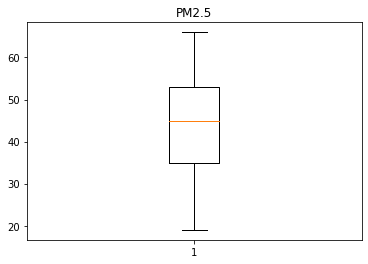

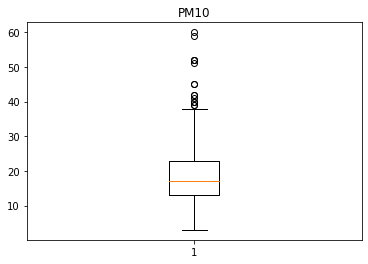

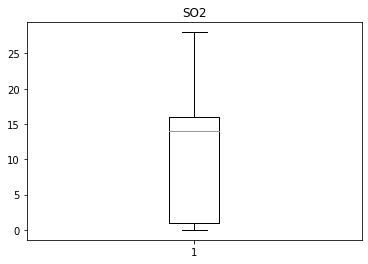

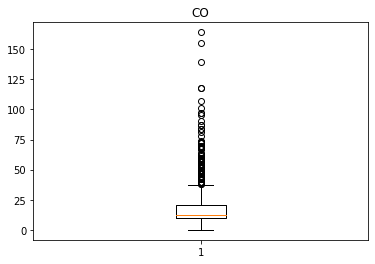

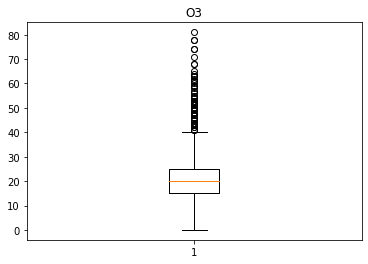

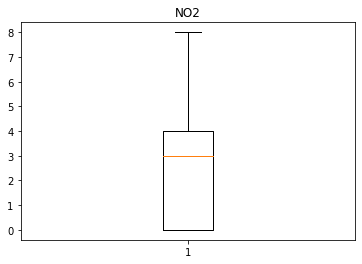

In [13]:
numerical= ['PM2.5', 'PM10', 'SO2', 'CO', 'O3', 'NO2'] #numerical_features

#creating boxplot for every numerical feature

for col in df[numerical]:
    plt.boxplot(df[col], vert= True)
    plt.title(col)
    plt.show()

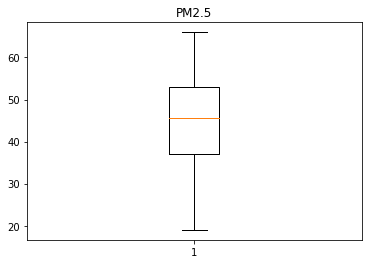

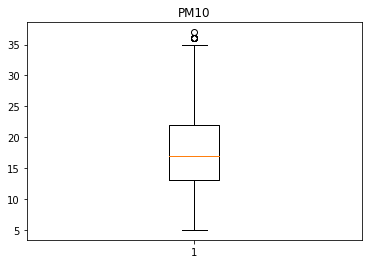

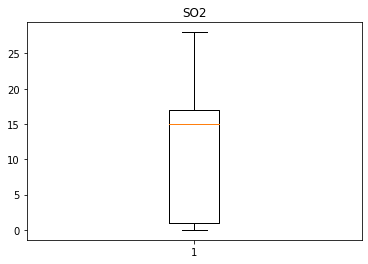

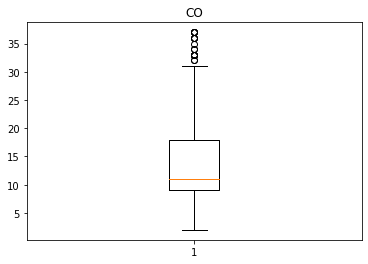

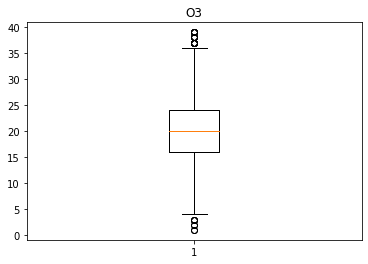

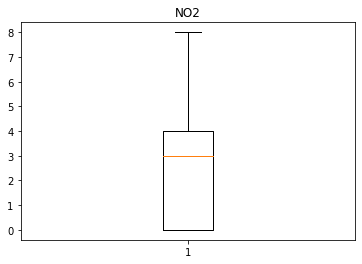

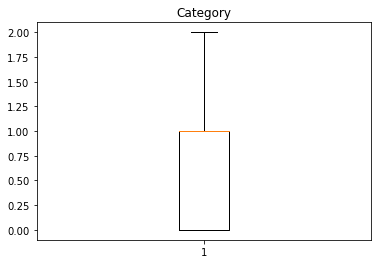

In [14]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Membuat salinan dataframe
df_copy = df[['PM2.5', 'PM10', 'SO2', 'CO', 'O3', 'NO2','Category']].copy()

# Label encoding untuk kolom 'Category'
label_encoder = LabelEncoder()
df_copy['Category'] = label_encoder.fit_transform(df_copy['Category'])

def remove_outliers(df_copy):
    df_result = df_copy.copy()  # Buat salinan dataframe untuk menyimpan hasil penghapusan outlier
    for col in df_copy.columns:
        Q1 = df_copy[col].quantile(0.25)
        Q3 = df_copy[col].quantile(0.75)
        IQR = Q3 - Q1
        upper_bound = Q3 + 1.5 * IQR
        lower_bound = Q1 - 1.5 * IQR
        df_result = df_result[(df_result[col] > lower_bound) & (df_result[col] < upper_bound)]
    return df_result

# Menghapus outlier
df_copy = remove_outliers(df_copy)

# Menampilkan boxplot
numerical = ['PM2.5', 'PM10', 'SO2', 'CO', 'O3', 'NO2']

for col in numerical:
    plt.boxplot(df_copy[col], vert=True)
    plt.title(col)
    plt.show()

# Tampilkan boxplot untuk kolom 'Category'
plt.boxplot(df_copy['Category'], vert=True)
plt.title('Category')
plt.show()


In [15]:
df = df_copy

## NOrmalisasi dengan minamx scaler

In [16]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Data X yang akan dinormalisasi (kecuali 'IE EXP (%)')
X_data = df[['PM2.5', 'PM10', 'SO2', 'CO', 'O3', 'NO2']]

# Inisialisasi MinMaxScaler untuk X
scaler_X = MinMaxScaler()
X_normalized = scaler_X.fit_transform(X_data)

# Mengganti kolom-kolom dalam data_model dengan data yang sudah dinormalisasi
df[['PM2.5', 'PM10', 'SO2', 'CO', 'O3', 'NO2']] = X_normalized

# Kolom 'IE EXP (%)' tidak perlu dinormalisasi
# Sekarang Anda dapat menggabungkan data yang sudah dinormalisasi dengan 'IE EXP (%)'
df = df

In [17]:
df

,PM2.5,PM10,SO2,CO,O3,NO2,Category
12,0.255319,0.18750,0.071429,0.771429,0.184211,0.0,0
25,0.255319,0.43750,0.071429,0.857143,0.684211,0.0,0
30,0.148936,0.37500,0.035714,0.885714,0.605263,0.0,0
31,0.127660,0.75000,0.071429,1.000000,0.368421,0.0,0
65,0.723404,0.43750,0.142857,0.542857,0.500000,0.0,0
...,...,...,...,...,...,...,...
1091,0.659574,0.43750,0.571429,0.285714,0.525274,0.5,1
1092,0.680851,0.46875,0.571429,0.285714,0.525274,0.5,1
1093,0.702128,0.50000,0.571429,0.314286,0.525274,0.5,1
1094,0.723404,0.53125,0.607143,0.314286,0.525274,0.5,1


### Mengecek Outlier

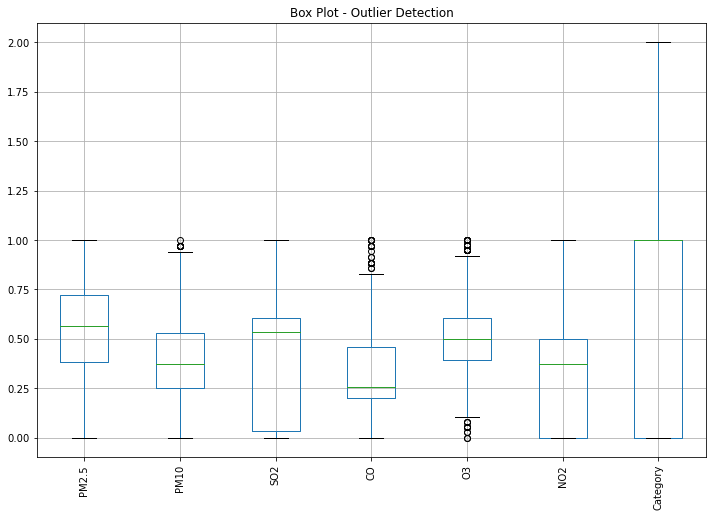

In [18]:
# Membuat box plot untuk setiap kolom
plt.figure(figsize=(12, 8))
df.boxplot()
plt.title('Box Plot - Outlier Detection')
plt.xticks(rotation=90)
plt.show()

# MOdeling

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

## XGBOOST


Ratio 20:80
Accuracy: 0.884393063583815
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.84      0.86        61
           1       0.89      0.94      0.91       107
           2       1.00      0.20      0.33         5

    accuracy                           0.88       173
   macro avg       0.92      0.66      0.70       173
weighted avg       0.89      0.88      0.88       173



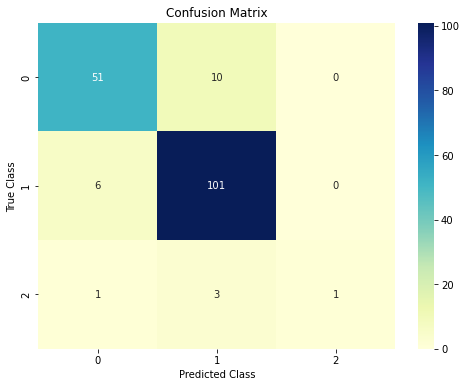

AUC Class 0: 0.96
AUC Class 1: 0.96
AUC Class 2: 0.97
Log Loss: 0.3613


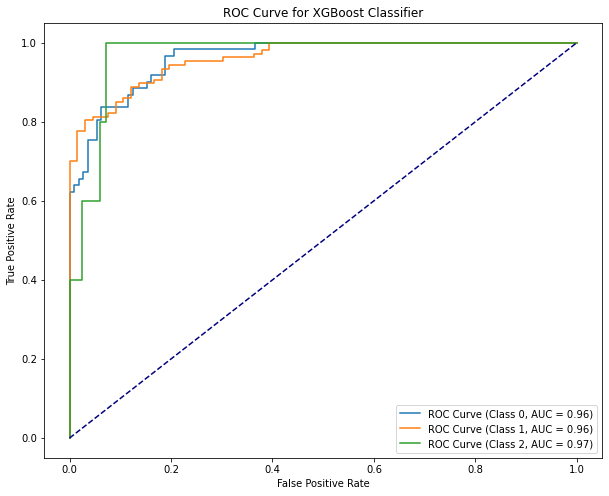


Ratio 30:70
Accuracy: 0.8692307692307693
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.87      0.84        95
           1       0.91      0.89      0.90       160
           2       1.00      0.20      0.33         5

    accuracy                           0.87       260
   macro avg       0.91      0.65      0.69       260
weighted avg       0.87      0.87      0.87       260



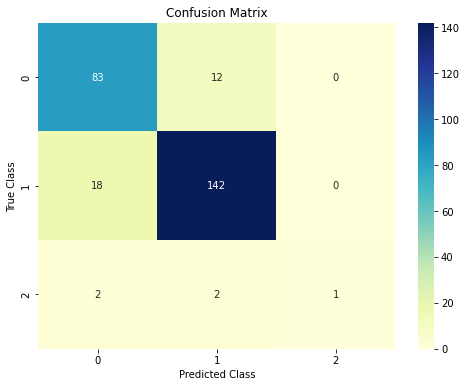

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.95
Log Loss: 0.3574


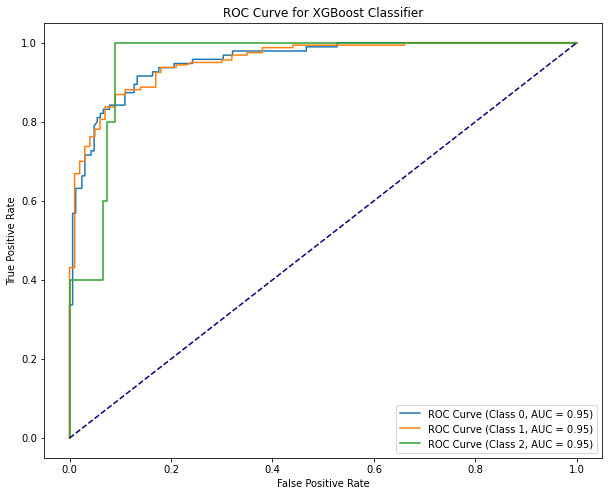


Ratio 40:60
Accuracy: 0.8728323699421965
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.88      0.85       129
           1       0.91      0.89      0.90       210
           2       0.75      0.43      0.55         7

    accuracy                           0.87       346
   macro avg       0.83      0.73      0.76       346
weighted avg       0.87      0.87      0.87       346



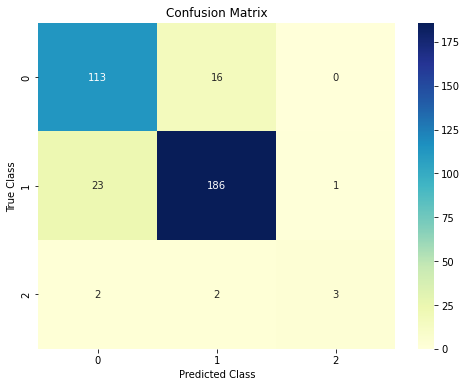

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.97
Log Loss: 0.3471


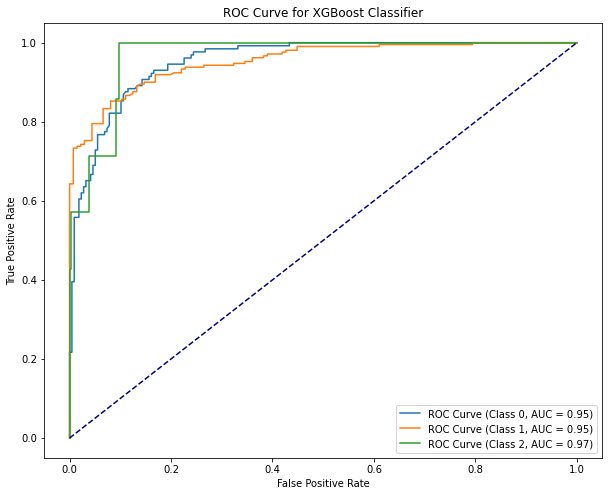

In [20]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, log_loss, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize, LabelEncoder
from sklearn.model_selection import train_test_split

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model XGBoost
    xgb_classifier = XGBClassifier(random_state=42)

    # Melatih model
    xgb_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = xgb_classifier.predict(X_test)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test_encoded, y_pred)
    print("Classification Report:\n", report)

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = xgb_classifier.predict_proba(X_test)

    # Memvisualisasikan Confusion Matrix
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(xgb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(xgb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for XGBoost Classifier')
    plt.legend()

    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


### Kfold XGBOOST

KFold=5
Fold 1 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.9075144508670521
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.91      0.90        67
           1       0.92      0.92      0.92       102
           2       1.00      0.50      0.67         4

    accuracy                           0.91       173
   macro avg       0.94      0.78      0.83       173
weighted avg       0.91      0.91      0.91       173



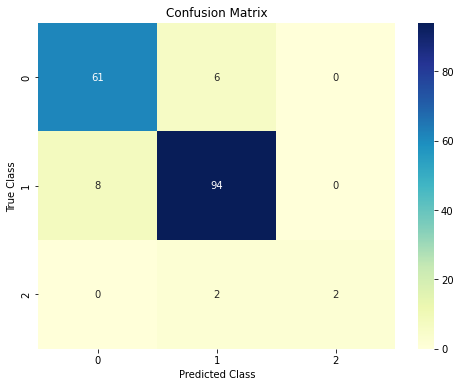

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.99
Log Loss: 0.2575


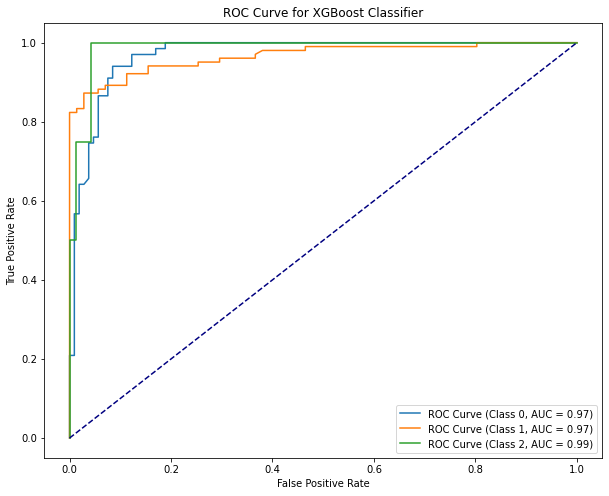

Fold 2 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.8323699421965318
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.79      0.80        67
           1       0.85      0.87      0.86       102
           2       0.67      0.50      0.57         4

    accuracy                           0.83       173
   macro avg       0.78      0.72      0.74       173
weighted avg       0.83      0.83      0.83       173



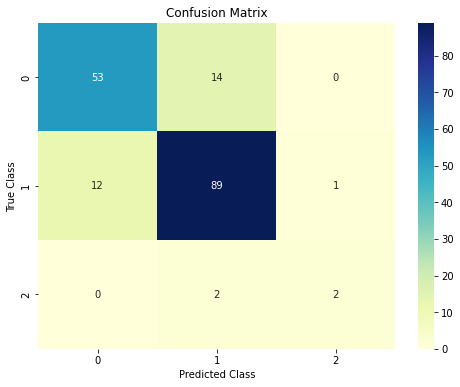

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.93
Log Loss: 0.4454


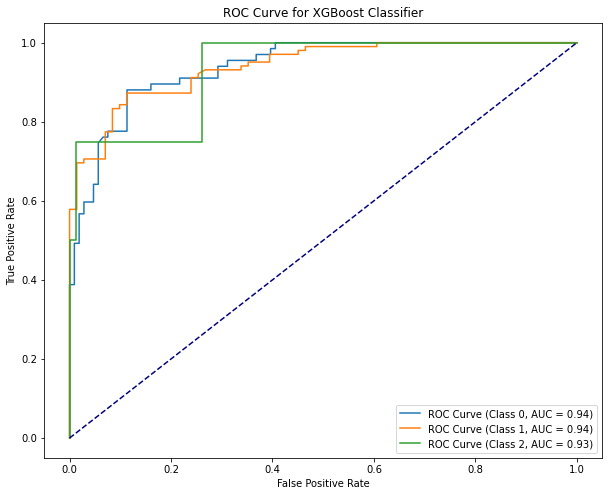

Fold 3 Class Distribution: {0: 66, 1: 102, 2: 5}

Accuracy: 0.861271676300578
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.76      0.81        66
           1       0.86      0.94      0.90       102
           2       0.60      0.60      0.60         5

    accuracy                           0.86       173
   macro avg       0.78      0.77      0.77       173
weighted avg       0.86      0.86      0.86       173



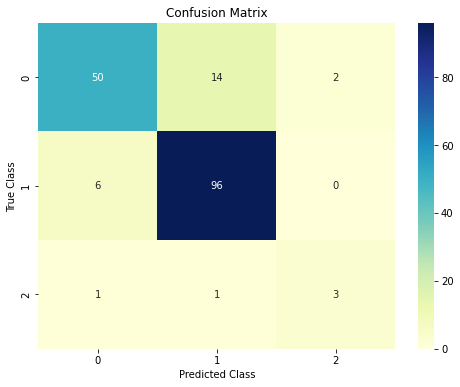

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.97
Log Loss: 0.3849


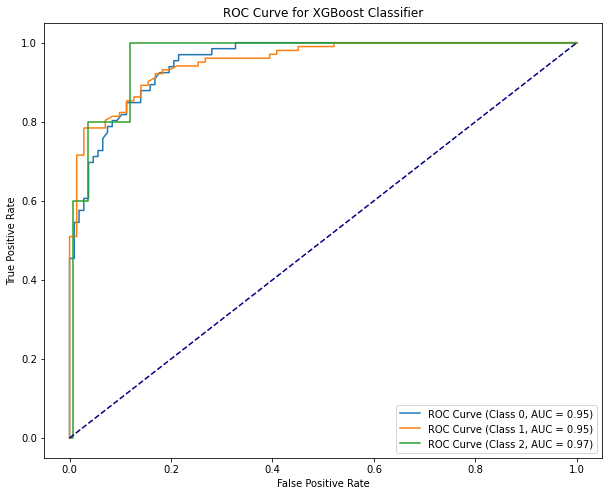

Fold 4 Class Distribution: {0: 66, 1: 103, 2: 4}

Accuracy: 0.8786127167630058
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.91      0.85        66
           1       0.94      0.88      0.91       103
           2       1.00      0.25      0.40         4

    accuracy                           0.88       173
   macro avg       0.91      0.68      0.72       173
weighted avg       0.89      0.88      0.88       173



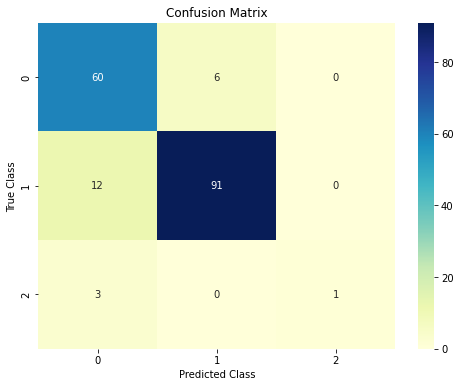

AUC Class 0: 0.95
AUC Class 1: 0.96
AUC Class 2: 0.92
Log Loss: 0.3885


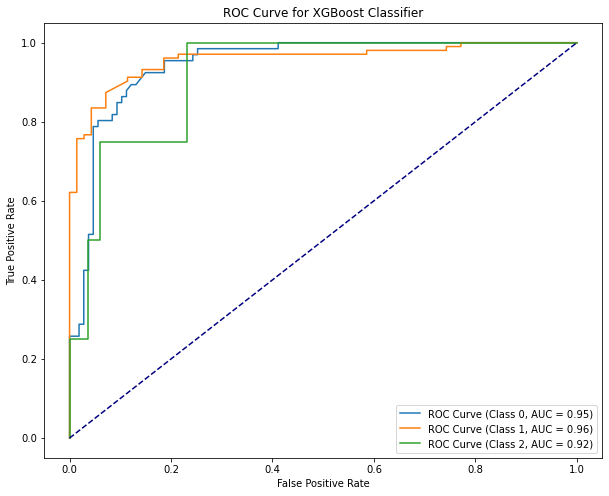

Fold 5 Class Distribution: {0: 66, 1: 102, 2: 4}

Accuracy: 0.8895348837209303
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.88      0.87        66
           1       0.91      0.91      0.91       102
           2       1.00      0.50      0.67         4

    accuracy                           0.89       172
   macro avg       0.92      0.76      0.81       172
weighted avg       0.89      0.89      0.89       172



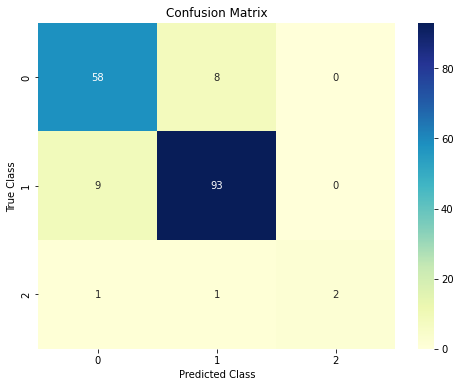

AUC Class 0: 0.96
AUC Class 1: 0.96
AUC Class 2: 1.00
Log Loss: 0.3337


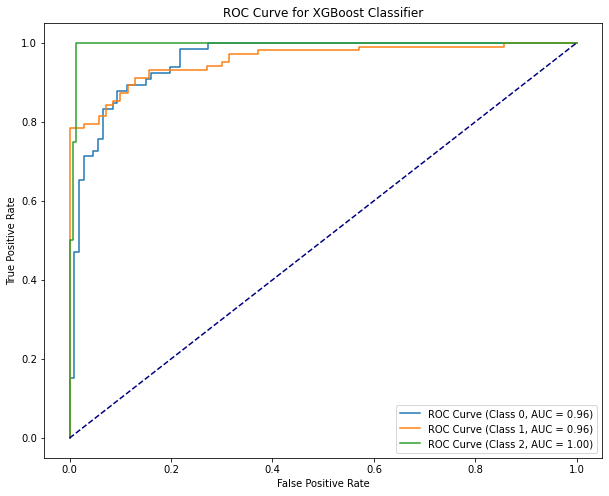


Average Accuracy for 5-fold: 0.8738607339696196
Average AUC for 5-fold: 0.9555884042264647
Average Log Loss for 5-fold: 0.36199200374513696
--------------------------------------------------


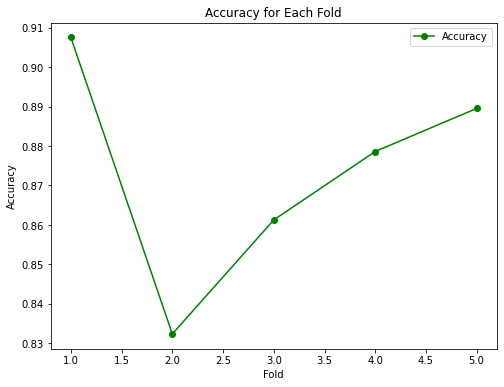

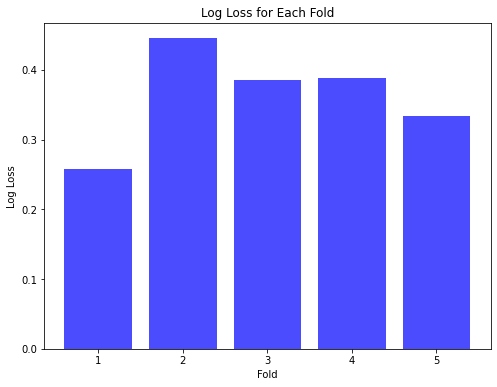


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.907514  0.974195  0.257550
1     2  0.832370  0.936830  0.445361
2     3  0.861272  0.956612  0.384857
3     4  0.878613  0.940701  0.388533
4     5  0.889535  0.969604  0.333660
--------------------------------------------------
KFold=10
Fold 1 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.9310344827586207
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91        34
           1       0.94      0.96      0.95        51
           2       1.00      0.50      0.67         2

    accuracy                           0.93        87
   macro avg       0.95      0.79      0.84        87
weighted avg       0.93      0.93      0.93        87



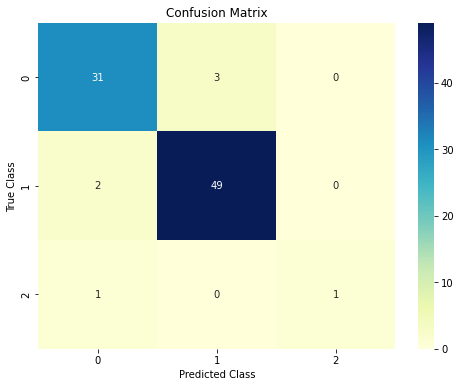

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.99
Log Loss: 0.2599


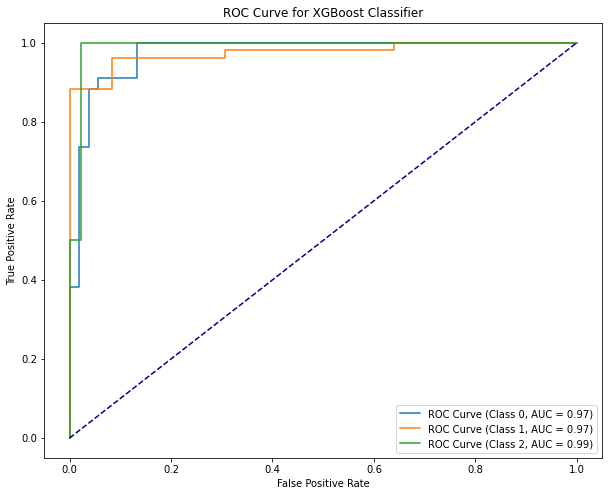

Fold 2 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.8735632183908046
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.91      0.86        34
           1       0.94      0.86      0.90        51
           2       0.50      0.50      0.50         2

    accuracy                           0.87        87
   macro avg       0.75      0.76      0.75        87
weighted avg       0.88      0.87      0.87        87



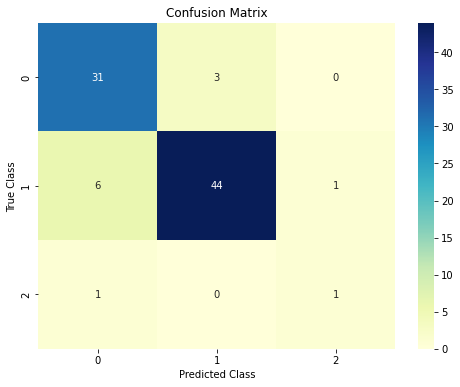

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.98
Log Loss: 0.2507


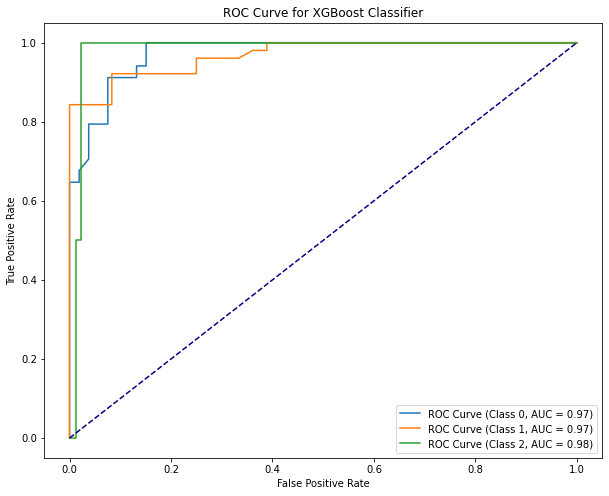

Fold 3 Class Distribution: {0: 33, 1: 51, 2: 3}

Accuracy: 0.8390804597701149
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.79      0.81        33
           1       0.84      0.90      0.87        51
           2       1.00      0.33      0.50         3

    accuracy                           0.84        87
   macro avg       0.89      0.67      0.73        87
weighted avg       0.84      0.84      0.83        87



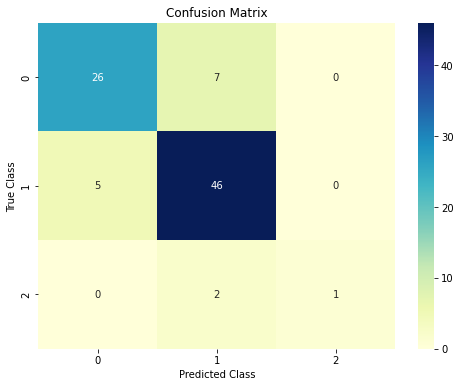

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.88
Log Loss: 0.4510


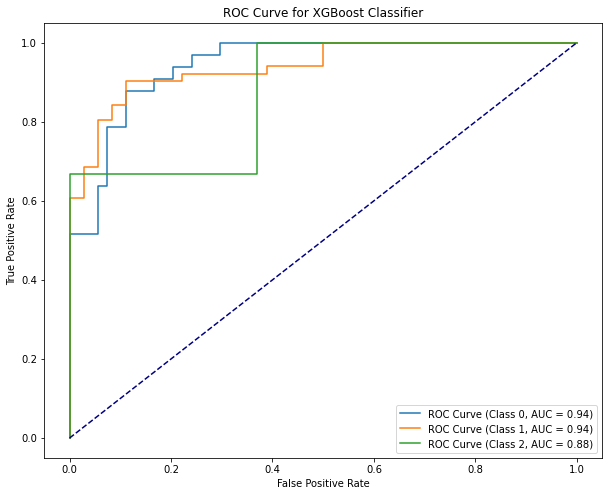

Fold 4 Class Distribution: {0: 33, 1: 52, 2: 2}

Accuracy: 0.8390804597701149
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.82      0.81        33
           1       0.88      0.87      0.87        52
           2       0.50      0.50      0.50         2

    accuracy                           0.84        87
   macro avg       0.73      0.73      0.73        87
weighted avg       0.84      0.84      0.84        87



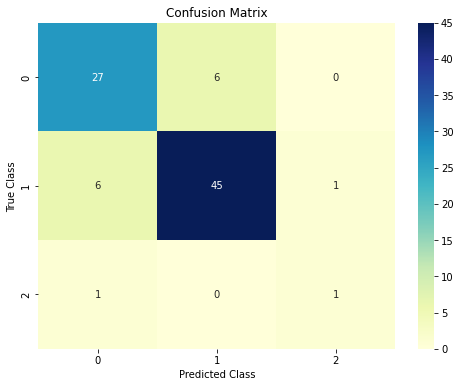

AUC Class 0: 0.92
AUC Class 1: 0.94
AUC Class 2: 0.98
Log Loss: 0.4984


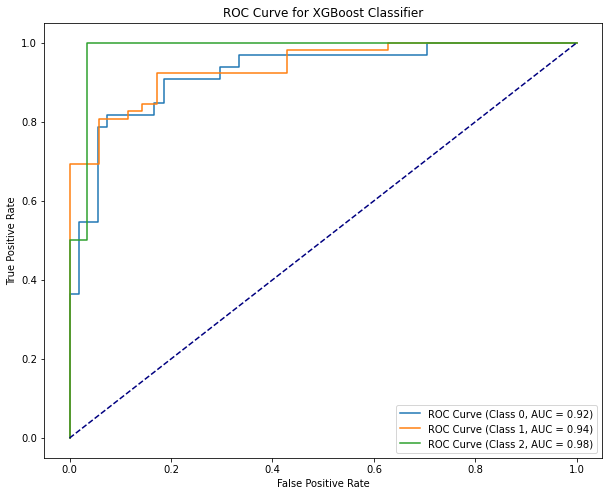

Fold 5 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8953488372093024
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.82      0.87        33
           1       0.88      0.96      0.92        51
           2       1.00      0.50      0.67         2

    accuracy                           0.90        86
   macro avg       0.94      0.76      0.82        86
weighted avg       0.90      0.90      0.89        86



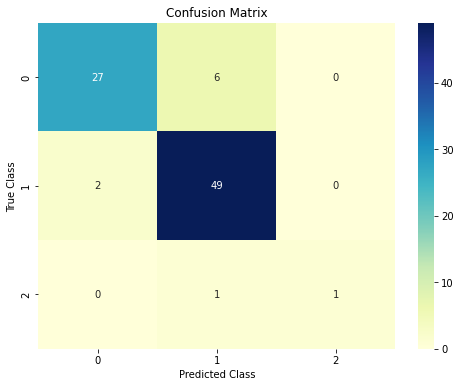

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 0.98
Log Loss: 0.2633


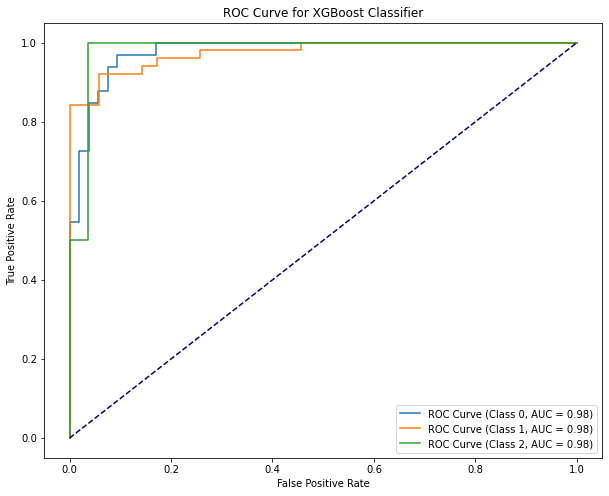

Fold 6 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8488372093023255
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.70      0.78        33
           1       0.84      0.94      0.89        51
           2       0.67      1.00      0.80         2

    accuracy                           0.85        86
   macro avg       0.80      0.88      0.82        86
weighted avg       0.85      0.85      0.84        86



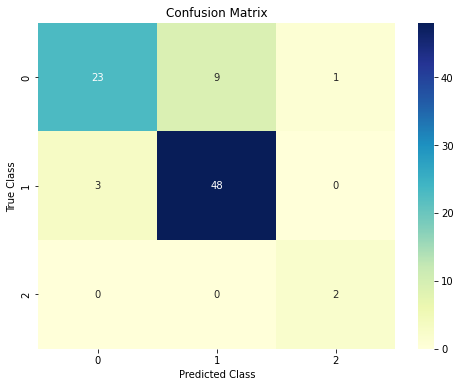

AUC Class 0: 0.93
AUC Class 1: 0.94
AUC Class 2: 0.99
Log Loss: 0.3944


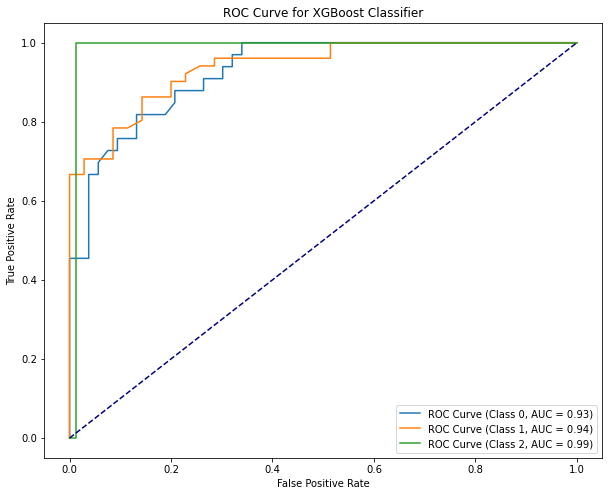

Fold 7 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8953488372093024
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.94      0.87        33
           1       0.96      0.90      0.93        51
           2       0.00      0.00      0.00         2

    accuracy                           0.90        86
   macro avg       0.59      0.61      0.60        86
weighted avg       0.88      0.90      0.89        86



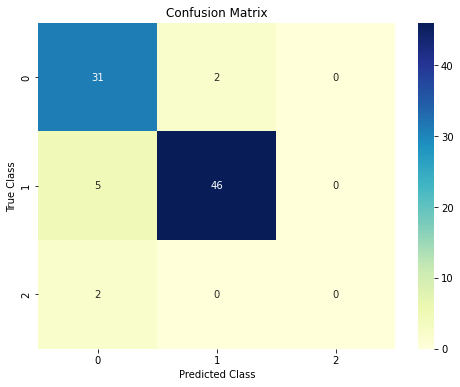

AUC Class 0: 0.96
AUC Class 1: 0.97
AUC Class 2: 0.74
Log Loss: 0.3794


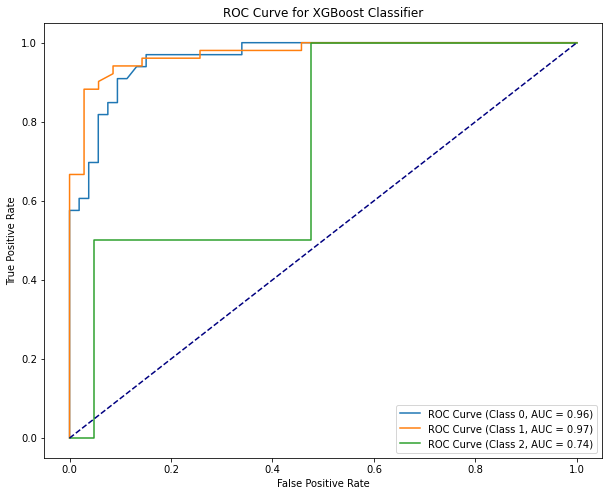

Fold 8 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8372093023255814
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.82      0.79        33
           1       0.88      0.86      0.87        51
           2       1.00      0.50      0.67         2

    accuracy                           0.84        86
   macro avg       0.88      0.73      0.78        86
weighted avg       0.84      0.84      0.84        86



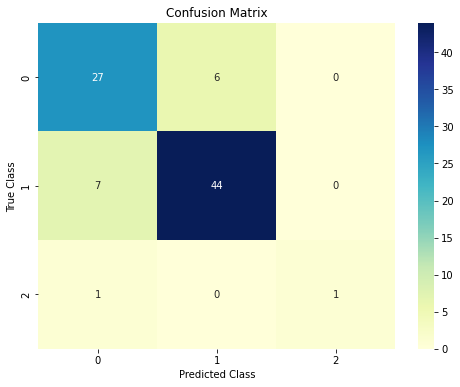

AUC Class 0: 0.93
AUC Class 1: 0.93
AUC Class 2: 0.99
Log Loss: 0.4683


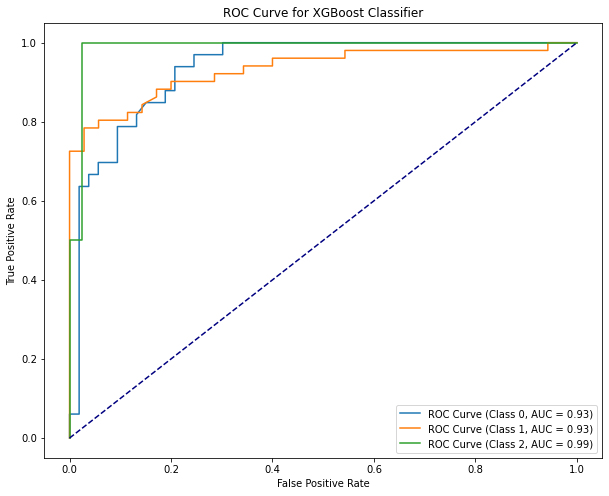

Fold 9 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.9302325581395349
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.94      0.93        33
           1       0.96      0.92      0.94        51
           2       0.67      1.00      0.80         2

    accuracy                           0.93        86
   macro avg       0.85      0.95      0.89        86
weighted avg       0.93      0.93      0.93        86



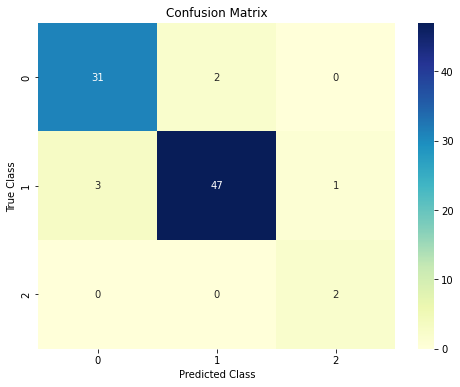

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2378


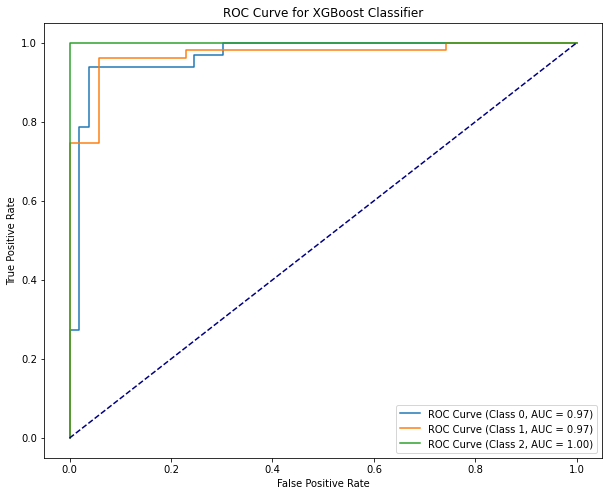

Fold 10 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8372093023255814
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.79      0.80        33
           1       0.85      0.88      0.87        51
           2       1.00      0.50      0.67         2

    accuracy                           0.84        86
   macro avg       0.89      0.72      0.78        86
weighted avg       0.84      0.84      0.84        86



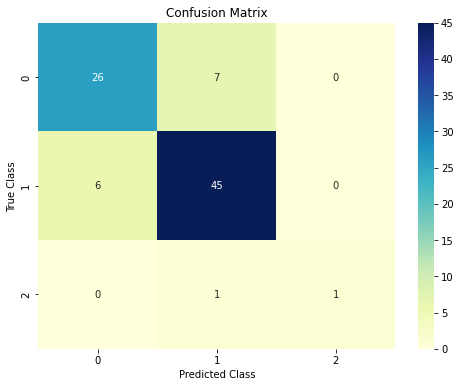

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.99
Log Loss: 0.4243


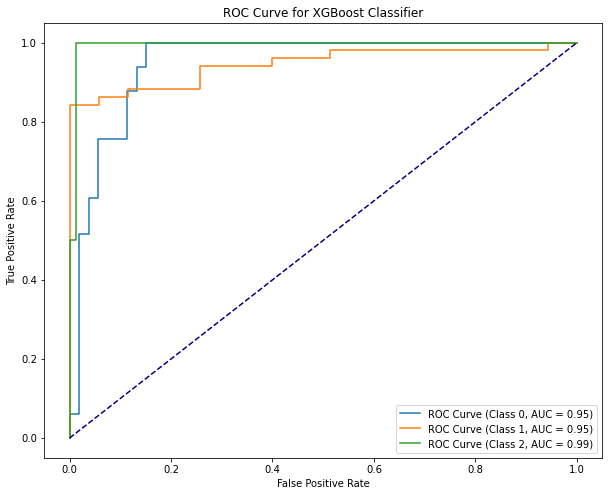


Average Accuracy for 10-fold: 0.8726944667201282
Average AUC for 10-fold: 0.9537321210119952
Average Log Loss for 10-fold: 0.3627349791866302
--------------------------------------------------


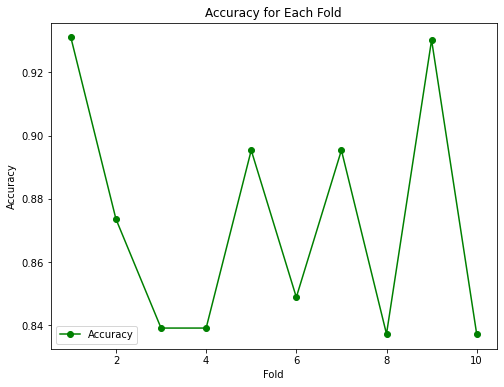

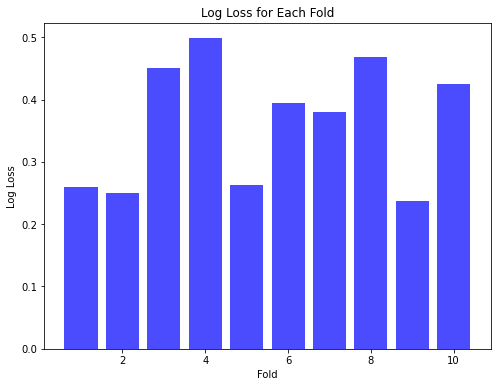


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.931034  0.979218  0.259898
1     2  0.873563  0.975073  0.250724
2     3  0.839080  0.920505  0.450977
3     4  0.839080  0.948352  0.498420
4     5  0.895349  0.978398  0.263272
5     6  0.848837  0.951476  0.394414
6     7  0.895349  0.891158  0.379355
7     8  0.837209  0.951707  0.468283
8     9  0.930233  0.978870  0.237752
9    10  0.837209  0.962563  0.424255
--------------------------------------------------


In [21]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")
    
    kfold_cv = StratifiedKFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for fold_num, (train_index, val_index) in enumerate(kfold_cv.split(X, y_encoded), start=1):
        X_train_kfold, X_val_kfold = X.iloc[train_index], X.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Check class distribution in each fold
        unique_classes, class_counts = np.unique(y_val_kfold, return_counts=True)
        print(f"Fold {fold_num} Class Distribution: {dict(zip(unique_classes, class_counts))}")

        # Membuat model XGBoost
        xgb_classifier = XGBClassifier(random_state=42)

        # Melatih model
        xgb_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = xgb_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = xgb_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i, class_label in enumerate(xgb_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {class_label}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i, class_label in enumerate(xgb_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for XGBoost Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")
    
    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()
    
    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## AdaBoost 


Ratio 20:80
Accuracy: 0.5317919075144508
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.51      0.46        61
           1       0.64      0.57      0.60       107
           2       0.00      0.00      0.00         5

    accuracy                           0.53       173
   macro avg       0.35      0.36      0.35       173
weighted avg       0.54      0.53      0.53       173



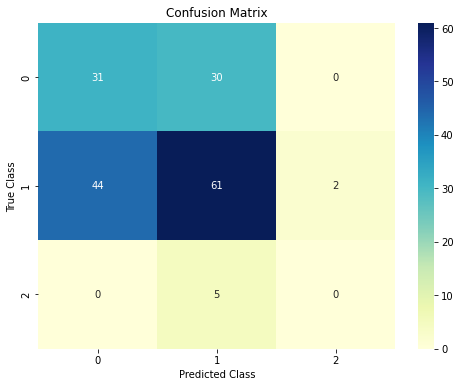

AUC Class 0: 0.46
AUC Class 1: 0.61
AUC Class 2: 0.96
Log Loss: 0.8413


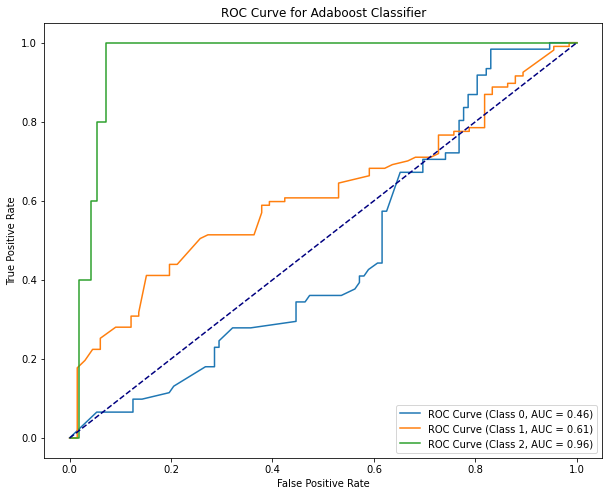


Ratio 30:70
Accuracy: 0.4346153846153846
Classification Report:
               precision    recall  f1-score   support

           0       0.36      0.60      0.45        95
           1       0.59      0.34      0.43       160
           2       0.14      0.20      0.17         5

    accuracy                           0.43       260
   macro avg       0.36      0.38      0.35       260
weighted avg       0.49      0.43      0.43       260



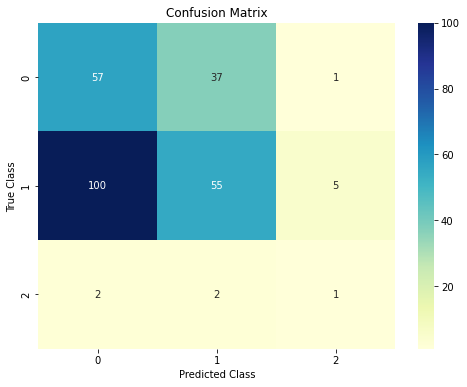

AUC Class 0: 0.49
AUC Class 1: 0.51
AUC Class 2: 0.95
Log Loss: 0.8240


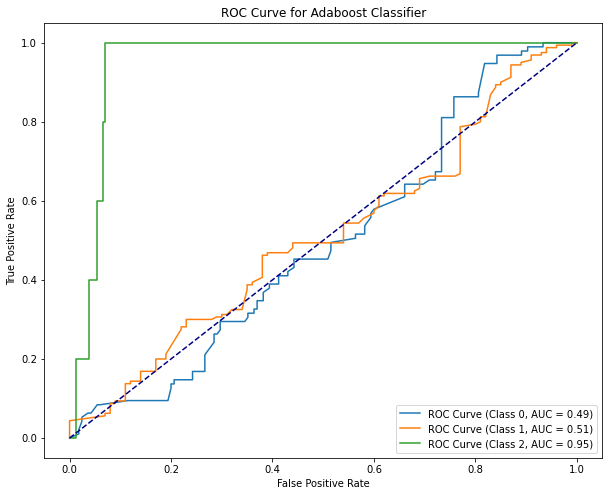


Ratio 40:60
Accuracy: 0.5028901734104047
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.67      0.51       129
           1       0.67      0.40      0.50       210
           2       0.33      0.43      0.38         7

    accuracy                           0.50       346
   macro avg       0.47      0.50      0.46       346
weighted avg       0.57      0.50      0.50       346



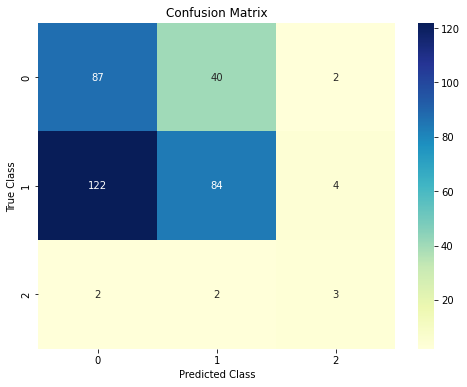

AUC Class 0: 0.48
AUC Class 1: 0.55
AUC Class 2: 0.97
Log Loss: 0.8293


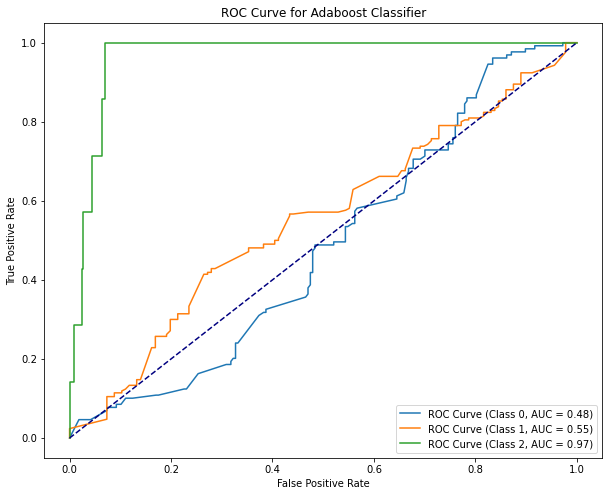

In [22]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize, LabelEncoder
from sklearn.model_selection import train_test_split

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of ratios
ratios = [0.2, 0.3, 0.4]
# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model Adaboost dengan Decision Tree Classifier sebagai base estimator
    ada_classifier = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1), random_state=42)

    # Melatih model
    ada_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = ada_classifier.predict(X_test)

    # Menghitung matriks kebingungan
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test_encoded, y_pred)
    print("Classification Report:\n", report)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    
    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = ada_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(ada_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(ada_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Adaboost Classifier')
    plt.legend()

    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


### Kfold adaboost

KFold=5
Fold 1 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.8670520231213873
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.85      0.84        67
           1       0.89      0.90      0.90       102
           2       1.00      0.25      0.40         4

    accuracy                           0.87       173
   macro avg       0.91      0.67      0.71       173
weighted avg       0.87      0.87      0.86       173



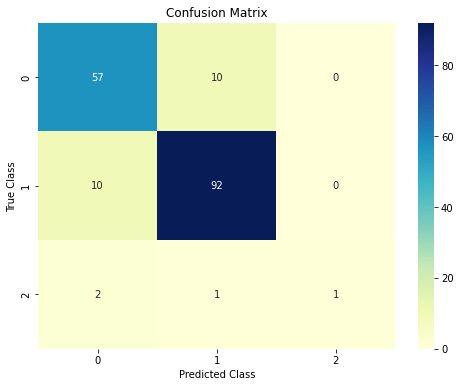

AUC Class 0: 0.92
AUC Class 1: 0.92
AUC Class 2: 0.93
Log Loss: 2.9955


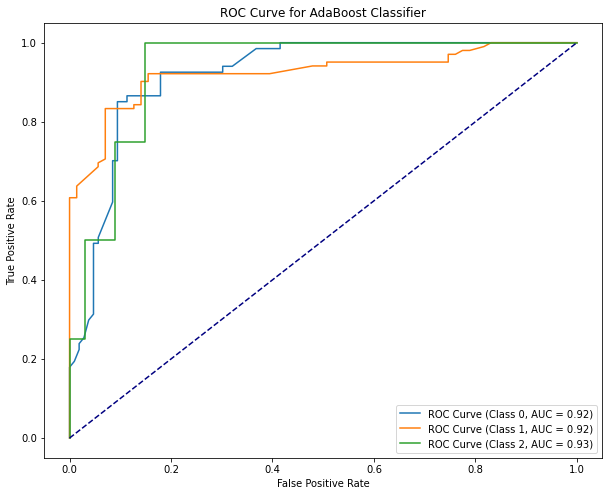

Fold 2 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.8439306358381503
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.81      0.81        67
           1       0.88      0.87      0.88       102
           2       0.50      0.75      0.60         4

    accuracy                           0.84       173
   macro avg       0.73      0.81      0.76       173
weighted avg       0.85      0.84      0.85       173



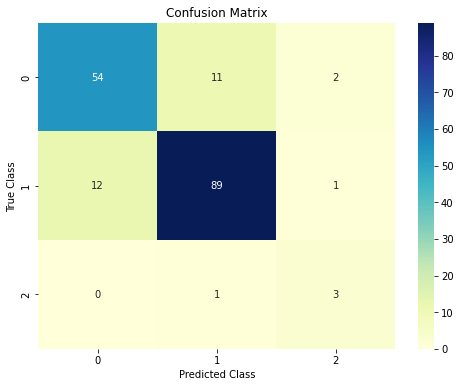

AUC Class 0: 0.90
AUC Class 1: 0.91
AUC Class 2: 0.97
Log Loss: 2.3642


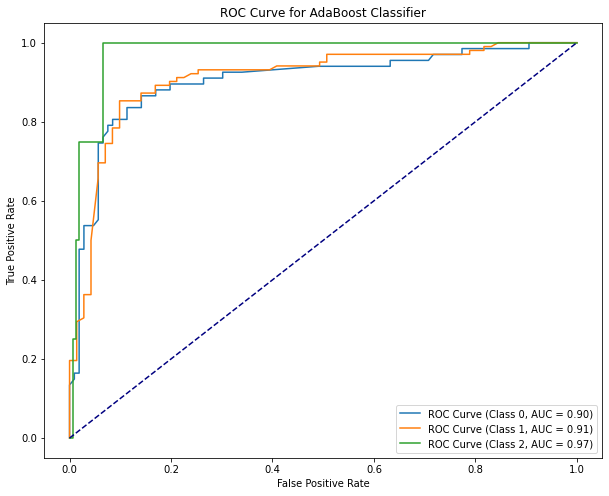

Fold 3 Class Distribution: {0: 66, 1: 102, 2: 5}

Accuracy: 0.861271676300578
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.77      0.82        66
           1       0.87      0.93      0.90       102
           2       0.60      0.60      0.60         5

    accuracy                           0.86       173
   macro avg       0.78      0.77      0.77       173
weighted avg       0.86      0.86      0.86       173



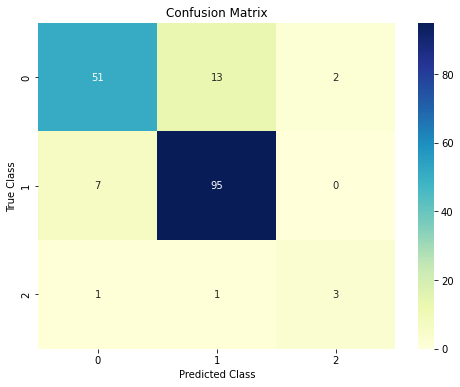

AUC Class 0: 0.89
AUC Class 1: 0.89
AUC Class 2: 0.79
Log Loss: 3.6162


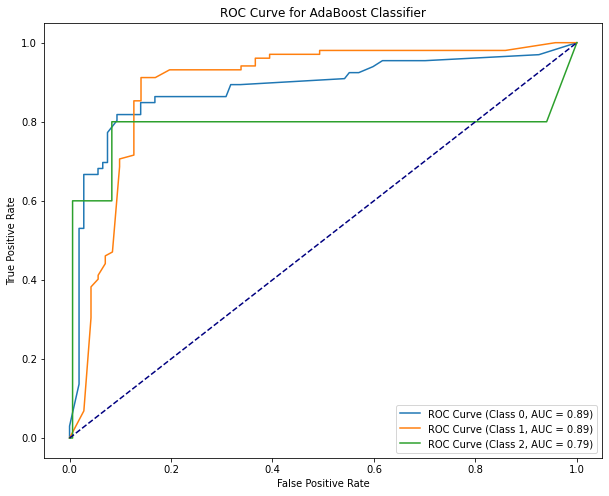

Fold 4 Class Distribution: {0: 66, 1: 103, 2: 4}

Accuracy: 0.8497109826589595
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.89      0.84        66
           1       0.91      0.84      0.87       103
           2       0.33      0.25      0.29         4

    accuracy                           0.85       173
   macro avg       0.68      0.66      0.67       173
weighted avg       0.85      0.85      0.85       173



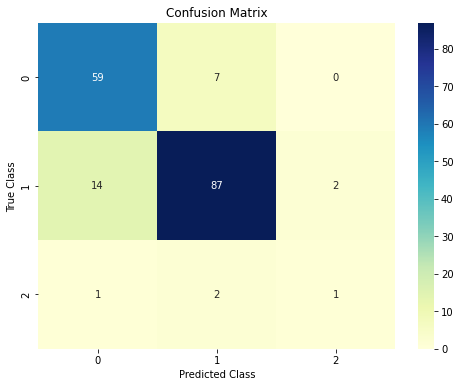

AUC Class 0: 0.93
AUC Class 1: 0.93
AUC Class 2: 0.96
Log Loss: 2.3259


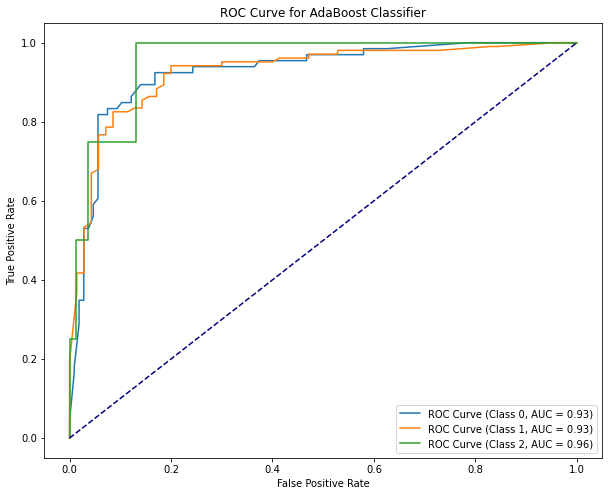

Fold 5 Class Distribution: {0: 66, 1: 102, 2: 4}

Accuracy: 0.8604651162790697
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.85      0.83        66
           1       0.90      0.87      0.89       102
           2       0.75      0.75      0.75         4

    accuracy                           0.86       172
   macro avg       0.82      0.82      0.82       172
weighted avg       0.86      0.86      0.86       172



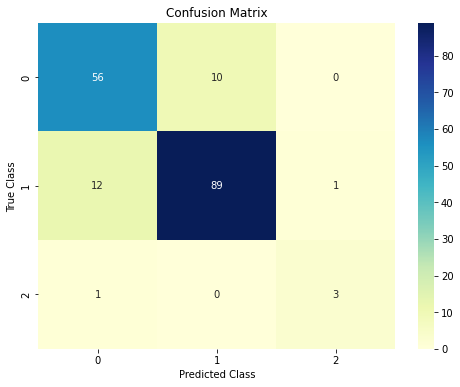

AUC Class 0: 0.92
AUC Class 1: 0.92
AUC Class 2: 0.99
Log Loss: 1.0990


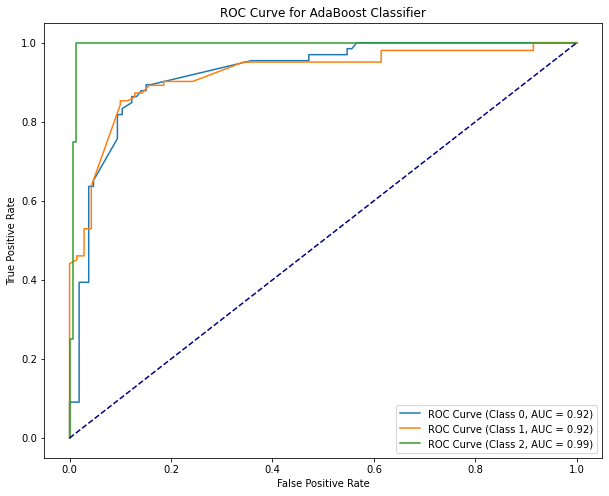


Average Accuracy for 5-fold: 0.8564860868396289
Average AUC for 5-fold: 0.918223888051514
Average Log Loss for 5-fold: 2.480173093159605
--------------------------------------------------


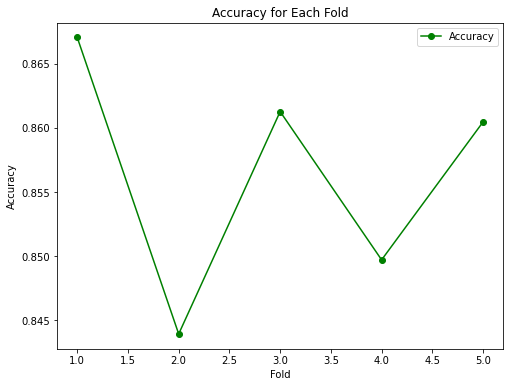

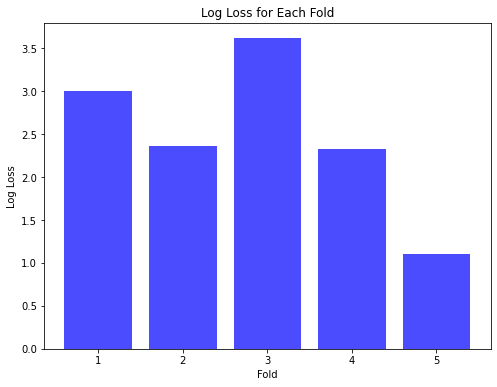


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.867052  0.925535  2.995529
1     2  0.843931  0.929316  2.364210
2     3  0.861272  0.854715  3.616165
3     4  0.849711  0.936209  2.325949
4     5  0.860465  0.945344  1.099013
--------------------------------------------------
KFold=10
Fold 1 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.8505747126436781
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.79      0.81        34
           1       0.87      0.90      0.88        51
           2       1.00      0.50      0.67         2

    accuracy                           0.85        87
   macro avg       0.90      0.73      0.79        87
weighted avg       0.85      0.85      0.85        87



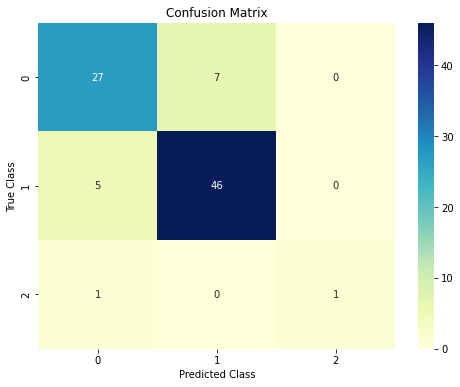

AUC Class 0: 0.93
AUC Class 1: 0.94
AUC Class 2: 0.96
Log Loss: 2.4577


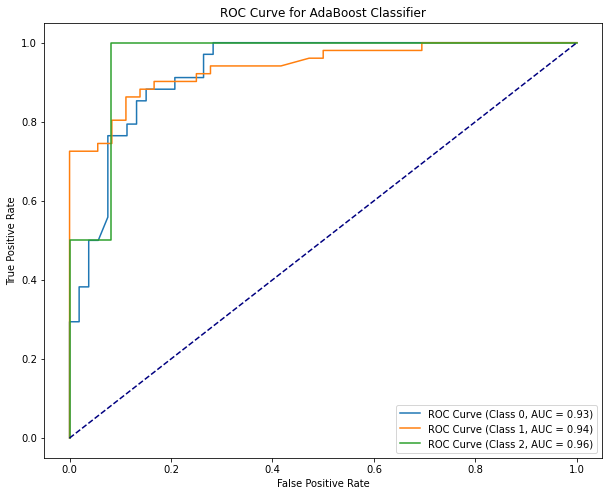

Fold 2 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.8850574712643678
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.94      0.88        34
           1       0.94      0.88      0.91        51
           2       0.00      0.00      0.00         2

    accuracy                           0.89        87
   macro avg       0.59      0.61      0.60        87
weighted avg       0.87      0.89      0.88        87



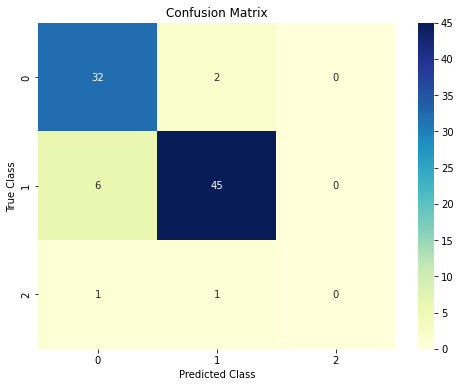

AUC Class 0: 0.94
AUC Class 1: 0.95
AUC Class 2: 0.84
Log Loss: 2.2950


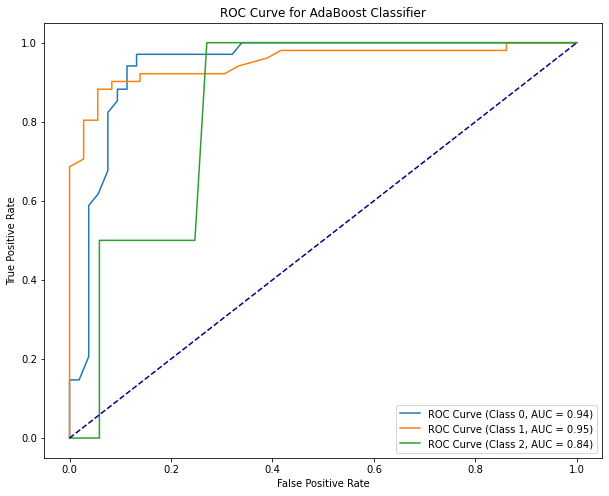

Fold 3 Class Distribution: {0: 33, 1: 51, 2: 3}

Accuracy: 0.8160919540229885
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.79      0.78        33
           1       0.85      0.86      0.85        51
           2       1.00      0.33      0.50         3

    accuracy                           0.82        87
   macro avg       0.87      0.66      0.71        87
weighted avg       0.82      0.82      0.81        87



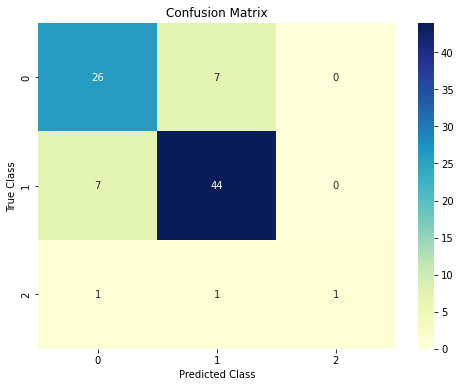

AUC Class 0: 0.92
AUC Class 1: 0.90
AUC Class 2: 0.76
Log Loss: 2.0061


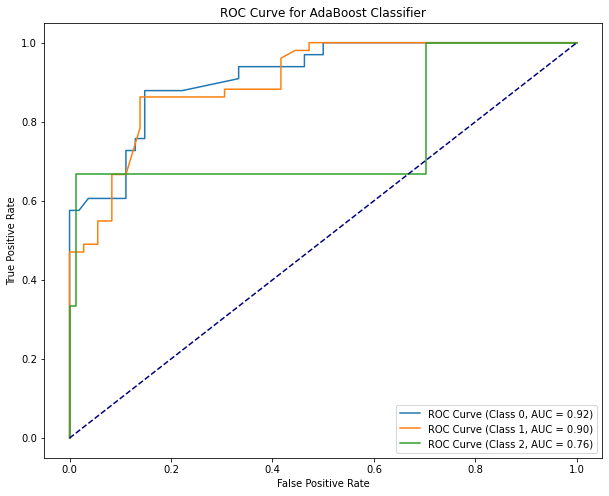

Fold 4 Class Distribution: {0: 33, 1: 52, 2: 2}

Accuracy: 0.8160919540229885
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.82      0.78        33
           1       0.90      0.83      0.86        52
           2       0.33      0.50      0.40         2

    accuracy                           0.82        87
   macro avg       0.66      0.72      0.68        87
weighted avg       0.83      0.82      0.82        87



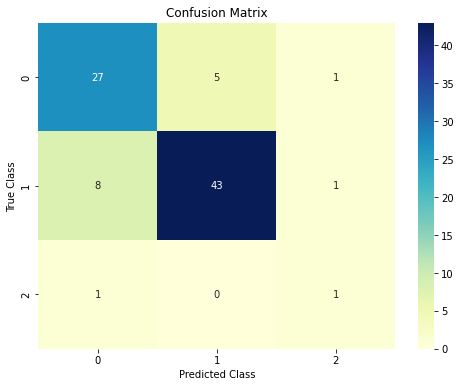

AUC Class 0: 0.91
AUC Class 1: 0.90
AUC Class 2: 0.96
Log Loss: 2.4659


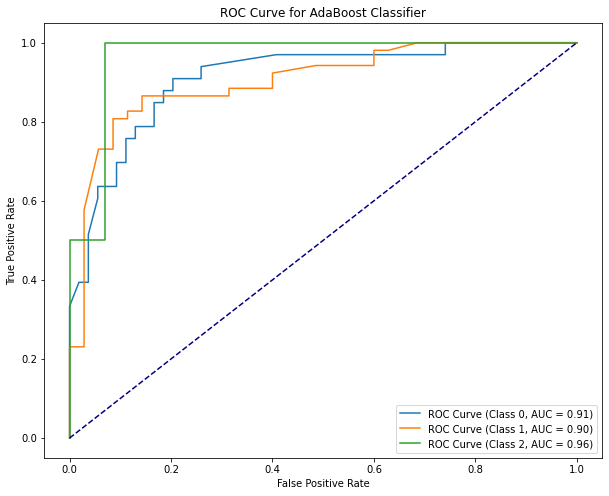

Fold 5 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8488372093023255
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.85      0.82        33
           1       0.88      0.88      0.88        51
           2       0.00      0.00      0.00         2

    accuracy                           0.85        86
   macro avg       0.56      0.58      0.57        86
weighted avg       0.83      0.85      0.84        86



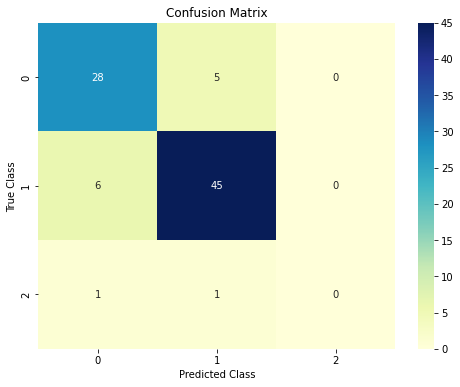

AUC Class 0: 0.92
AUC Class 1: 0.92
AUC Class 2: 1.00
Log Loss: 1.2048


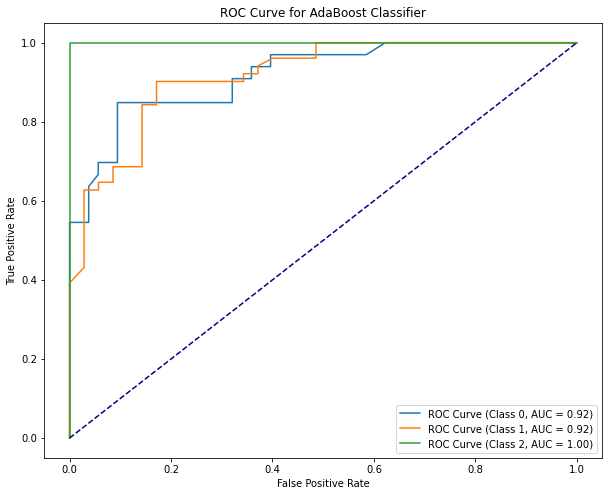

Fold 6 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.7906976744186046
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.70      0.73        33
           1       0.83      0.86      0.85        51
           2       0.33      0.50      0.40         2

    accuracy                           0.79        86
   macro avg       0.64      0.69      0.66        86
weighted avg       0.79      0.79      0.79        86



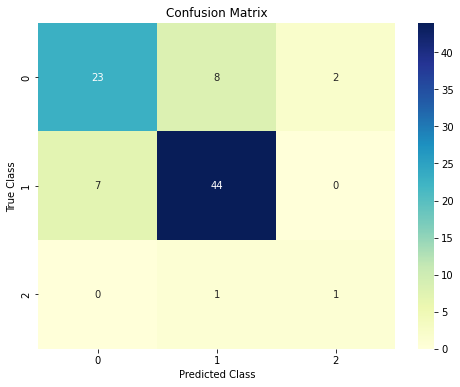

AUC Class 0: 0.86
AUC Class 1: 0.88
AUC Class 2: 0.84
Log Loss: 4.4015


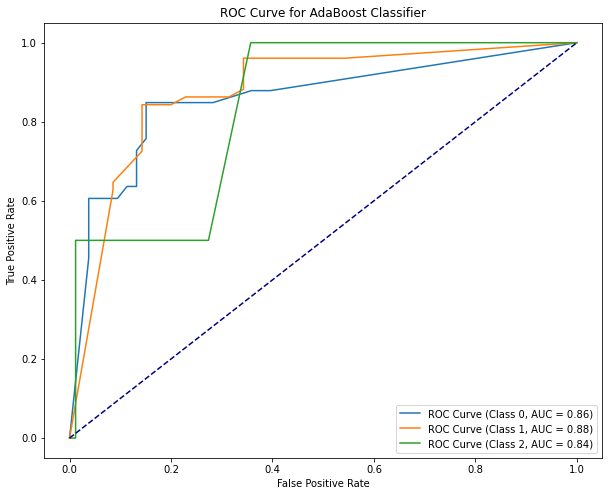

Fold 7 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8604651162790697
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.85      0.85        33
           1       0.88      0.90      0.89        51
           2       0.00      0.00      0.00         2

    accuracy                           0.86        86
   macro avg       0.58      0.58      0.58        86
weighted avg       0.85      0.86      0.86        86



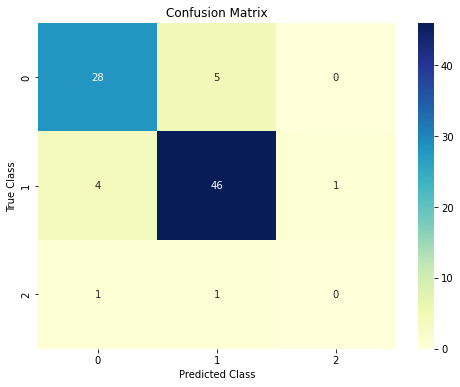

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.96
Log Loss: 1.9389


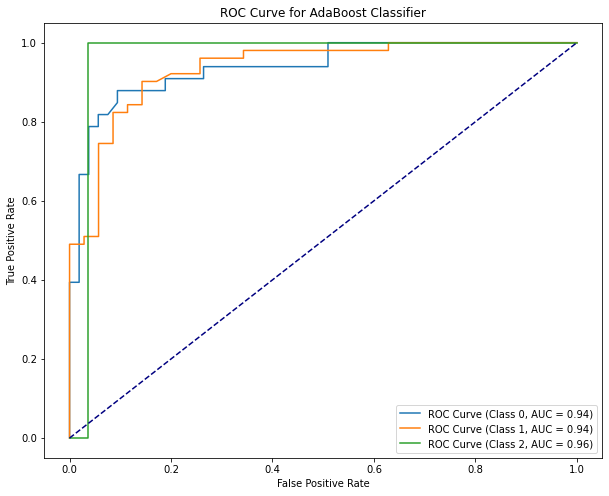

Fold 8 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8255813953488372
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.85      0.80        33
           1       0.89      0.82      0.86        51
           2       0.50      0.50      0.50         2

    accuracy                           0.83        86
   macro avg       0.72      0.72      0.72        86
weighted avg       0.83      0.83      0.83        86



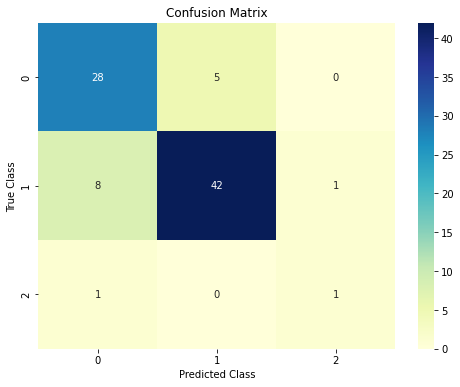

AUC Class 0: 0.90
AUC Class 1: 0.90
AUC Class 2: 0.99
Log Loss: 3.1564


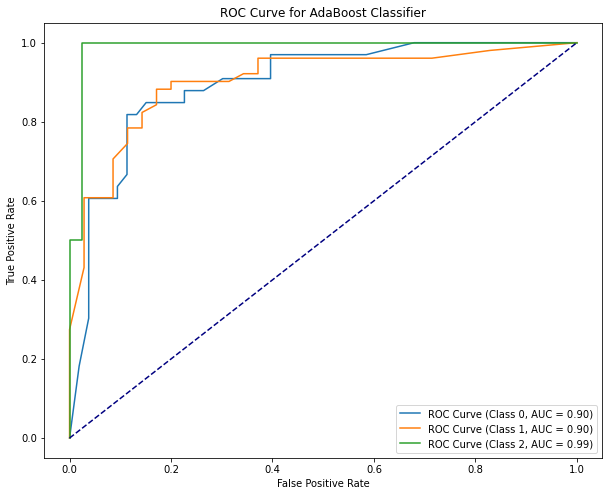

Fold 9 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8953488372093024
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.91      0.87        33
           1       0.94      0.90      0.92        51
           2       1.00      0.50      0.67         2

    accuracy                           0.90        86
   macro avg       0.92      0.77      0.82        86
weighted avg       0.90      0.90      0.89        86



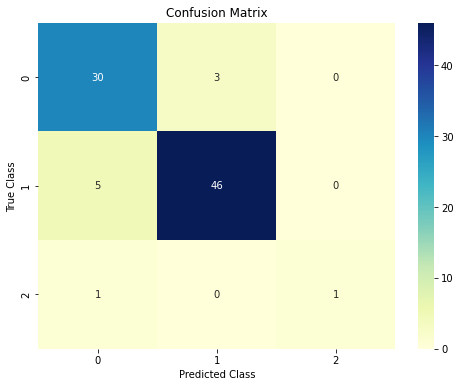

AUC Class 0: 0.92
AUC Class 1: 0.93
AUC Class 2: 1.00
Log Loss: 0.9101


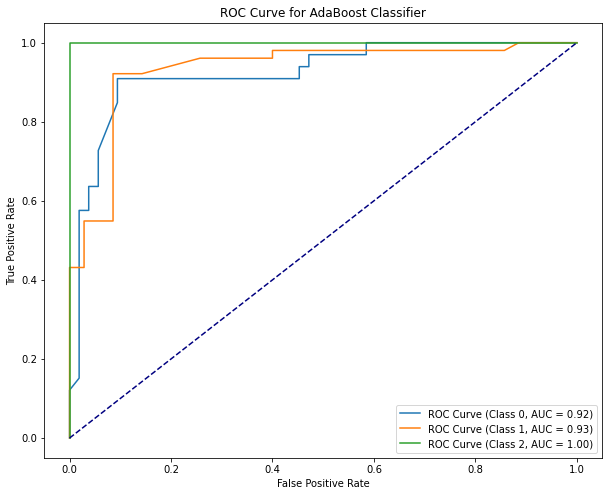

Fold 10 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8488372093023255
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.79      0.81        33
           1       0.87      0.90      0.88        51
           2       0.50      0.50      0.50         2

    accuracy                           0.85        86
   macro avg       0.74      0.73      0.73        86
weighted avg       0.85      0.85      0.85        86



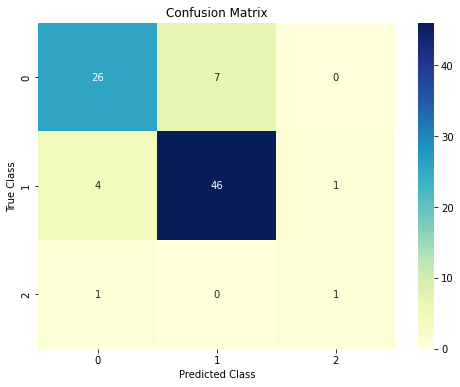

AUC Class 0: 0.93
AUC Class 1: 0.93
AUC Class 2: 0.99
Log Loss: 2.4425


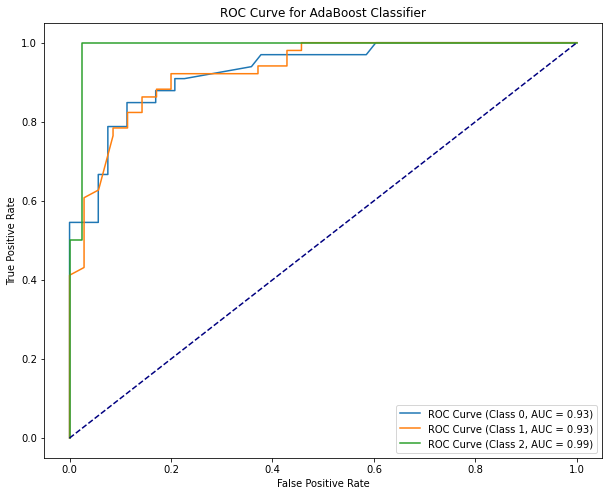


Average Accuracy for 10-fold: 0.8437583533814488
Average AUC for 10-fold: 0.9218177727542323
Average Log Loss for 10-fold: 2.3278971797601424
--------------------------------------------------


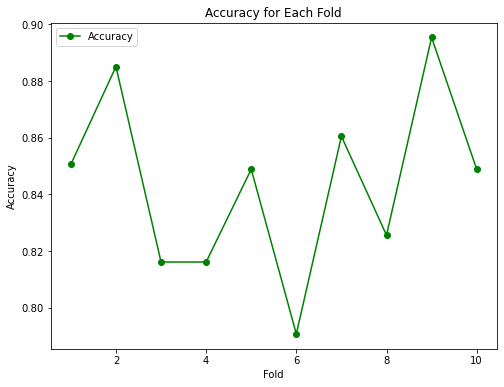

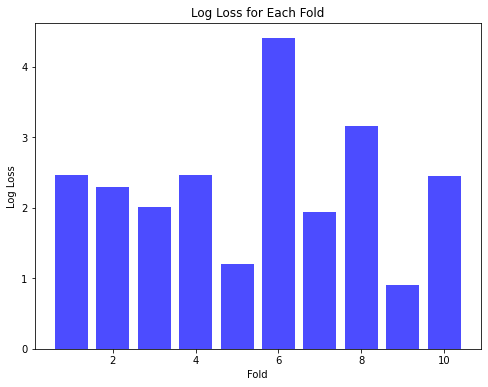


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.850575  0.942263  2.457724
1     2  0.885057  0.911116  2.295031
2     3  0.816092  0.860807  2.006132
3     4  0.816092  0.926257  2.465916
4     5  0.848837  0.944924  1.204784
5     6  0.790698  0.857462  4.401512
6     7  0.860465  0.946225  1.938870
7     8  0.825581  0.929329  3.156441
8     9  0.895349  0.951868  0.910109
9    10  0.848837  0.947926  2.442453
--------------------------------------------------


In [23]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")

    kfold_cv = StratifiedKFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for fold_num, (train_index, val_index) in enumerate(kfold_cv.split(X, y_encoded), start=1):
        X_train_kfold, X_val_kfold = X.iloc[train_index], X.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Check class distribution in each fold
        unique_classes, class_counts = np.unique(y_val_kfold, return_counts=True)
        print(f"Fold {fold_num} Class Distribution: {dict(zip(unique_classes, class_counts))}")

        # Membuat model AdaBoost
        base_classifier = DecisionTreeClassifier(random_state=42)
        adaboost_classifier = AdaBoostClassifier(base_classifier, random_state=42)

        # Melatih model
        adaboost_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = adaboost_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = adaboost_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i, class_label in enumerate(adaboost_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {class_label}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i, class_label in enumerate(adaboost_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for AdaBoost Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")

    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()

    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## Gradient Boosting Clasifire


Ratio 20:80
Accuracy: 0.8728323699421965
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.85      0.84        61
           1       0.91      0.92      0.91       107
           2       0.50      0.20      0.29         5

    accuracy                           0.87       173
   macro avg       0.74      0.66      0.68       173
weighted avg       0.87      0.87      0.87       173



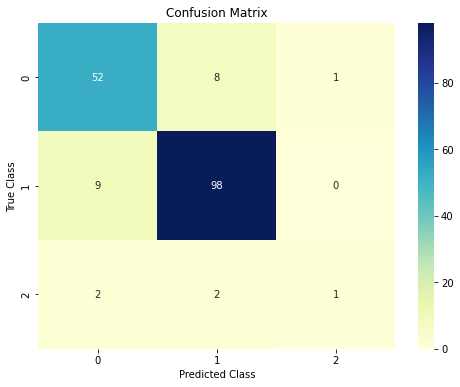

AUC Class 0: 0.93
AUC Class 1: 0.93
AUC Class 2: 0.96
Log Loss: 0.3992


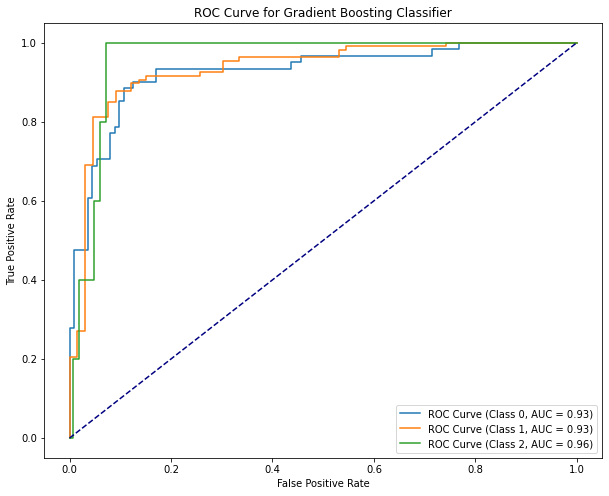


Ratio 30:70
Accuracy: 0.8384615384615385
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.84      0.81        95
           1       0.89      0.86      0.88       160
           2       0.00      0.00      0.00         5

    accuracy                           0.84       260
   macro avg       0.56      0.57      0.56       260
weighted avg       0.83      0.84      0.83       260



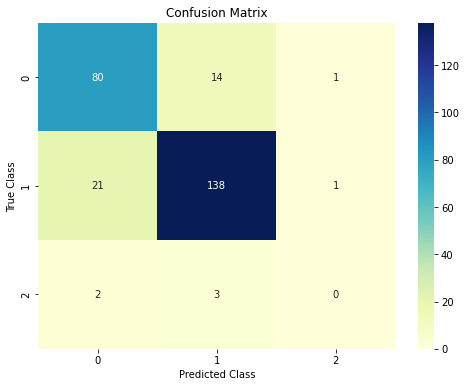

AUC Class 0: 0.92
AUC Class 1: 0.93
AUC Class 2: 0.95
Log Loss: 0.4002


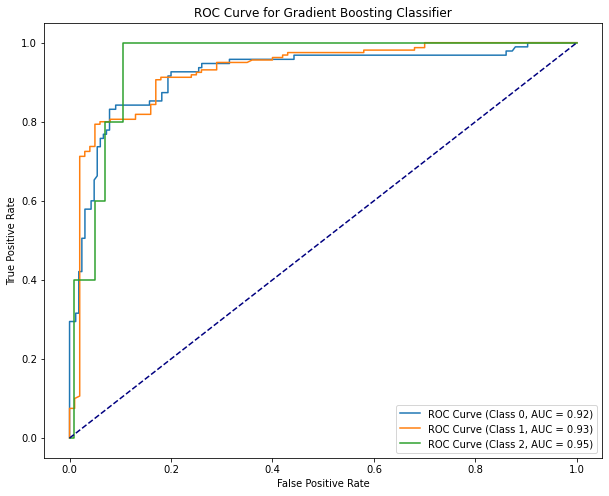


Ratio 40:60
Accuracy: 0.8236994219653179
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.81      0.79       129
           1       0.88      0.85      0.86       210
           2       0.33      0.43      0.38         7

    accuracy                           0.82       346
   macro avg       0.66      0.69      0.68       346
weighted avg       0.83      0.82      0.83       346



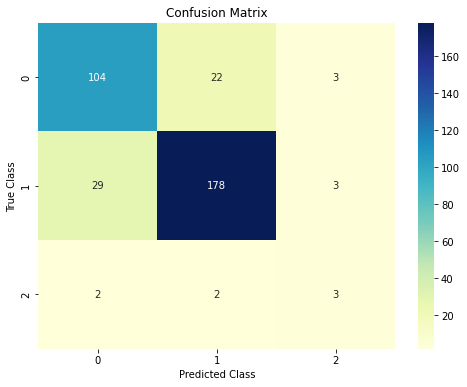

AUC Class 0: 0.92
AUC Class 1: 0.92
AUC Class 2: 0.96
Log Loss: 0.3909


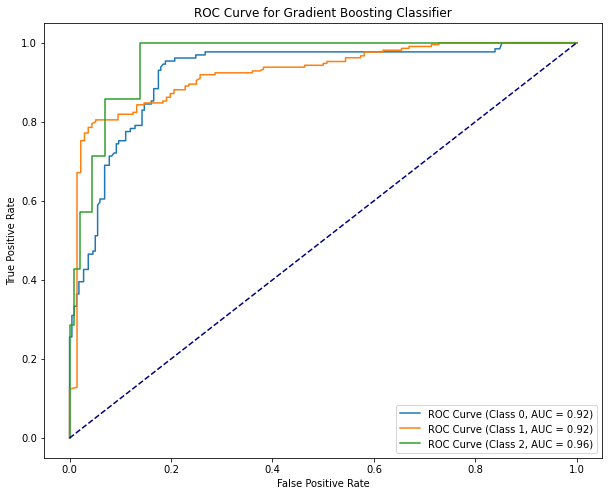

In [24]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# Encoding string labels to integer labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=ratio, random_state=42)

    # Membuat model Gradient Boosting
    gb_classifier = GradientBoostingClassifier(random_state=42)

    # Melatih model
    gb_classifier.fit(X_train, y_train)

    # Melakukan prediksi pada data testing
    y_pred = gb_classifier.predict(X_test)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test, y_pred)
    print("Classification Report:\n", report)
    
    # Menghitung matriks kebingungan
    confusion_mat = confusion_matrix(y_test, y_pred)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = gb_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(gb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve((y_test == i).astype(int),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(gb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve((y_test == i).astype(int),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Gradient Boosting Classifier')
    plt.legend()

    # Menghitung log loss
    logloss = log_loss(y_test, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


### GB FOld

KFold=5
Fold 1 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.8959537572254336
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.90      0.88        67
           1       0.91      0.92      0.92       102
           2       1.00      0.25      0.40         4

    accuracy                           0.90       173
   macro avg       0.93      0.69      0.73       173
weighted avg       0.90      0.90      0.89       173



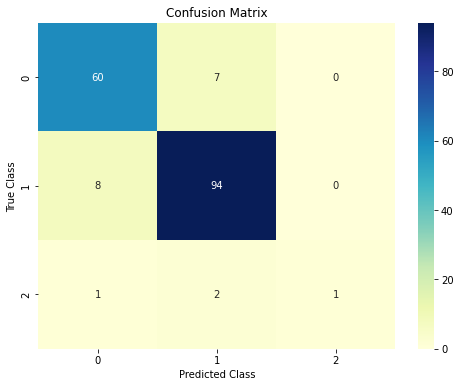

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.96
Log Loss: 0.3653


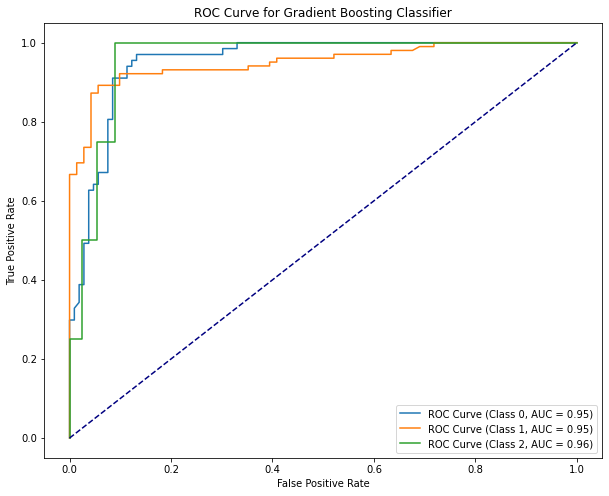

Fold 2 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.8265895953757225
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.81      0.80        67
           1       0.86      0.85      0.86       102
           2       0.50      0.50      0.50         4

    accuracy                           0.83       173
   macro avg       0.72      0.72      0.72       173
weighted avg       0.83      0.83      0.83       173



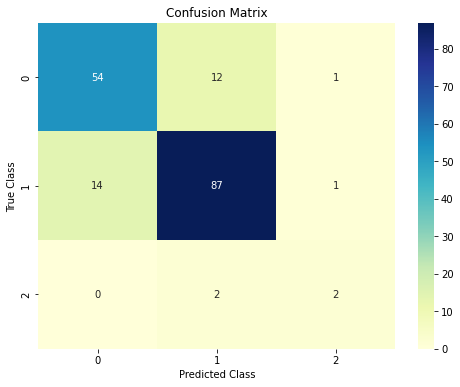

AUC Class 0: 0.90
AUC Class 1: 0.92
AUC Class 2: 0.98
Log Loss: 0.4257


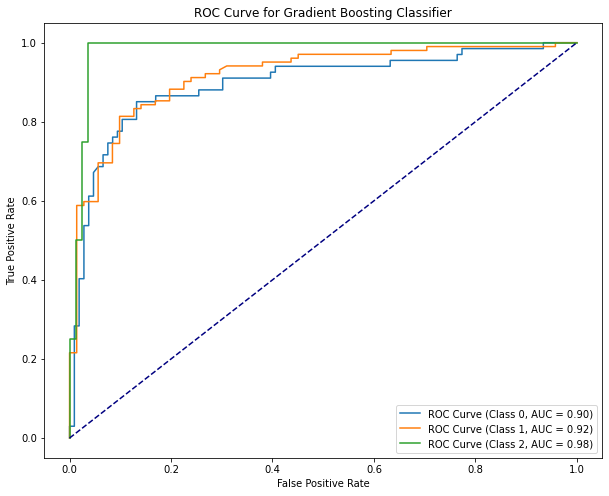

Fold 3 Class Distribution: {0: 66, 1: 102, 2: 5}

Accuracy: 0.8323699421965318
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.73      0.78        66
           1       0.84      0.92      0.88       102
           2       0.50      0.40      0.44         5

    accuracy                           0.83       173
   macro avg       0.73      0.68      0.70       173
weighted avg       0.83      0.83      0.83       173



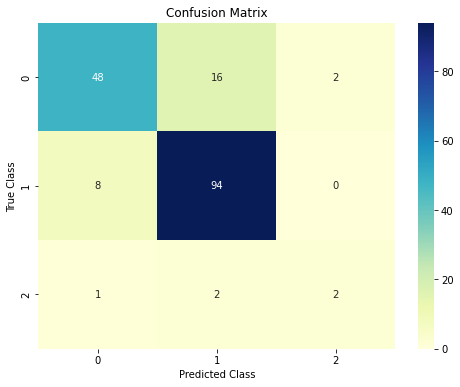

AUC Class 0: 0.91
AUC Class 1: 0.92
AUC Class 2: 0.98
Log Loss: 0.4255


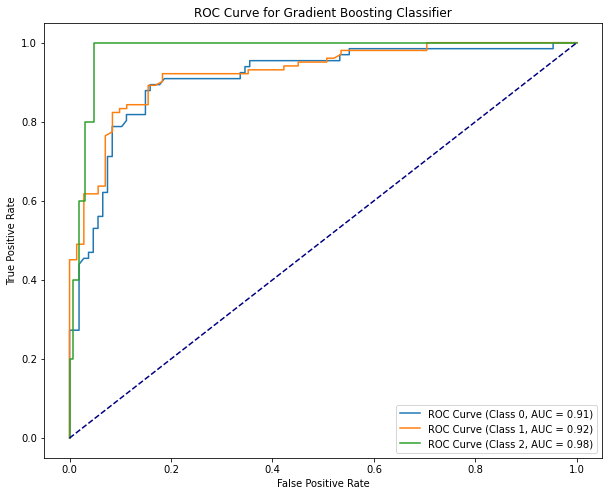

Fold 4 Class Distribution: {0: 66, 1: 103, 2: 4}

Accuracy: 0.838150289017341
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.86      0.81        66
           1       0.90      0.85      0.88       103
           2       0.00      0.00      0.00         4

    accuracy                           0.84       173
   macro avg       0.56      0.57      0.56       173
weighted avg       0.83      0.84      0.83       173



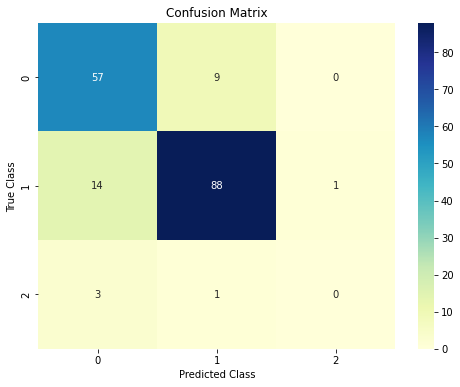

AUC Class 0: 0.93
AUC Class 1: 0.94
AUC Class 2: 0.95
Log Loss: 0.4002


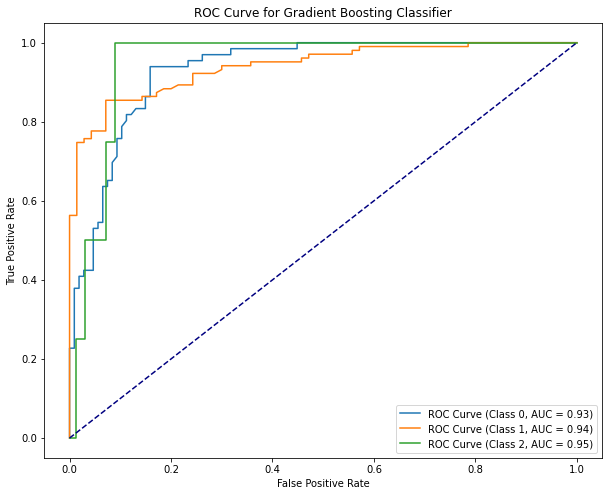

Fold 5 Class Distribution: {0: 66, 1: 102, 2: 4}

Accuracy: 0.8430232558139535
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.83      0.81        66
           1       0.89      0.88      0.89       102
           2       0.00      0.00      0.00         4

    accuracy                           0.84       172
   macro avg       0.56      0.57      0.57       172
weighted avg       0.83      0.84      0.84       172



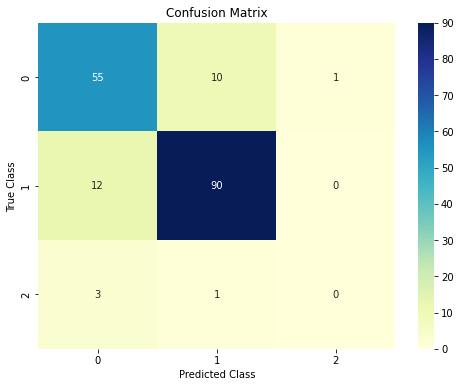

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.97
Log Loss: 0.3733


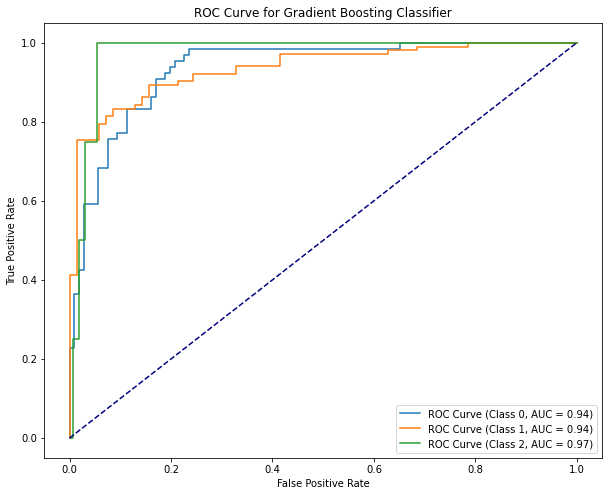


Average Accuracy for 5-fold: 0.8472173679257965
Average AUC for 5-fold: 0.9423401989133543
Average Log Loss for 5-fold: 0.3979993679305651
--------------------------------------------------


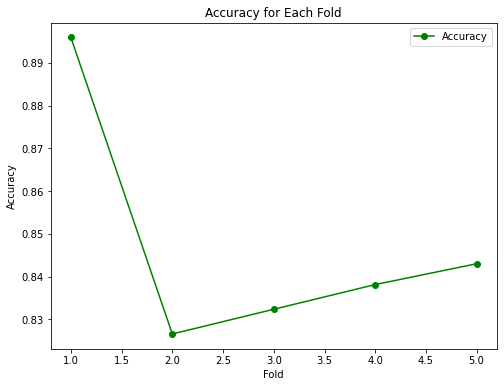

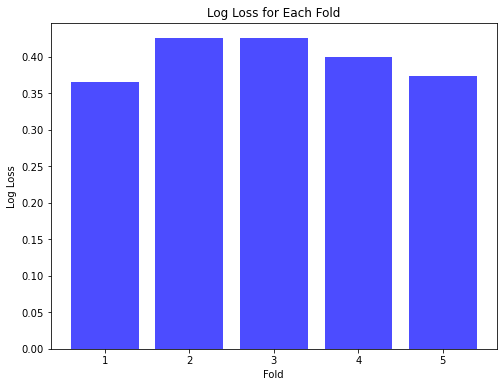


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.895954  0.953899  0.365286
1     2  0.826590  0.931457  0.425696
2     3  0.832370  0.938197  0.425501
3     4  0.838150  0.940323  0.400217
4     5  0.843023  0.947826  0.373297
--------------------------------------------------
KFold=10
Fold 1 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.9080459770114943
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.91      0.90        34
           1       0.92      0.92      0.92        51
           2       1.00      0.50      0.67         2

    accuracy                           0.91        87
   macro avg       0.94      0.78      0.83        87
weighted avg       0.91      0.91      0.91        87



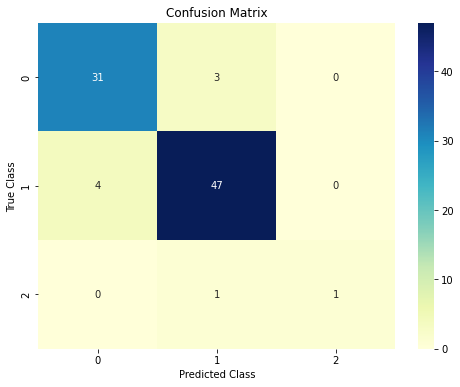

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 0.96
Log Loss: 0.2965


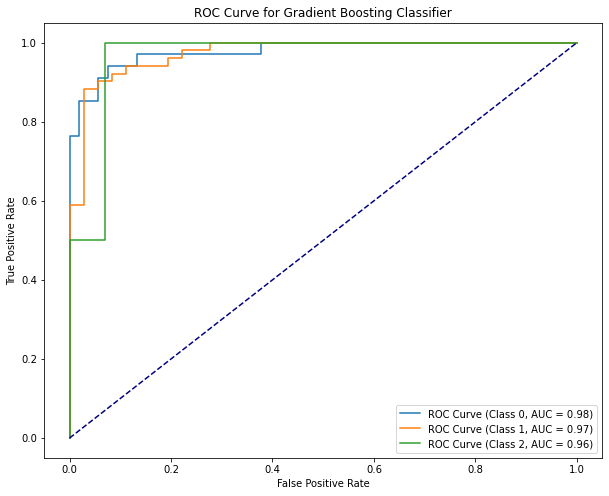

Fold 2 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.8275862068965517
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.82      0.81        34
           1       0.86      0.84      0.85        51
           2       0.50      0.50      0.50         2

    accuracy                           0.83        87
   macro avg       0.72      0.72      0.72        87
weighted avg       0.83      0.83      0.83        87



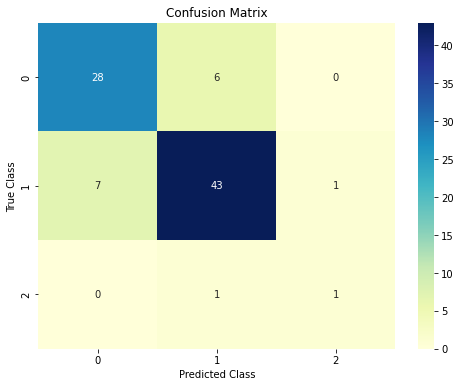

AUC Class 0: 0.92
AUC Class 1: 0.90
AUC Class 2: 0.99
Log Loss: 0.3850


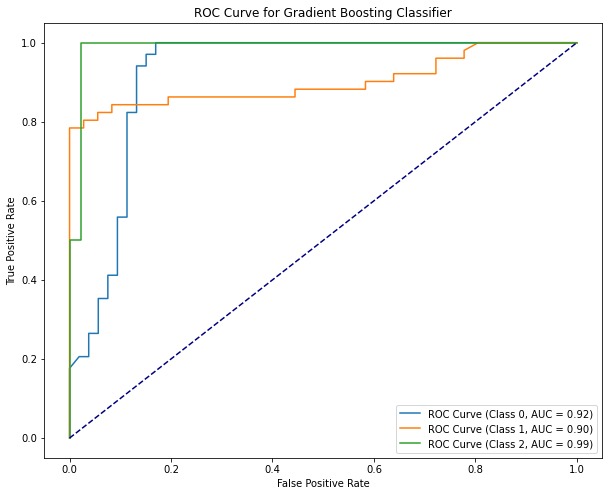

Fold 3 Class Distribution: {0: 33, 1: 51, 2: 3}

Accuracy: 0.8505747126436781
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.82      0.82        33
           1       0.88      0.90      0.89        51
           2       0.50      0.33      0.40         3

    accuracy                           0.85        87
   macro avg       0.73      0.68      0.70        87
weighted avg       0.85      0.85      0.85        87



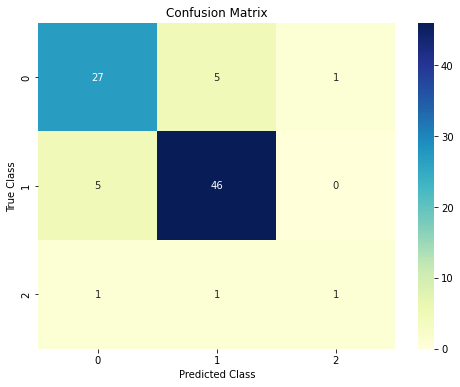

AUC Class 0: 0.90
AUC Class 1: 0.93
AUC Class 2: 0.98
Log Loss: 0.4309


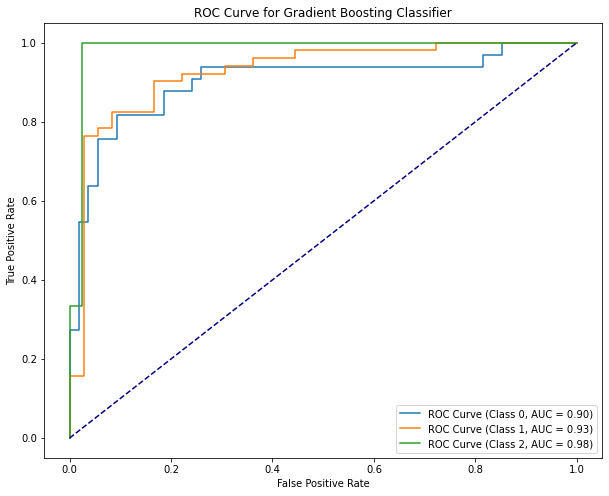

Fold 4 Class Distribution: {0: 33, 1: 52, 2: 2}

Accuracy: 0.8390804597701149
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.76      0.79        33
           1       0.89      0.90      0.90        52
           2       0.25      0.50      0.33         2

    accuracy                           0.84        87
   macro avg       0.66      0.72      0.67        87
weighted avg       0.85      0.84      0.84        87



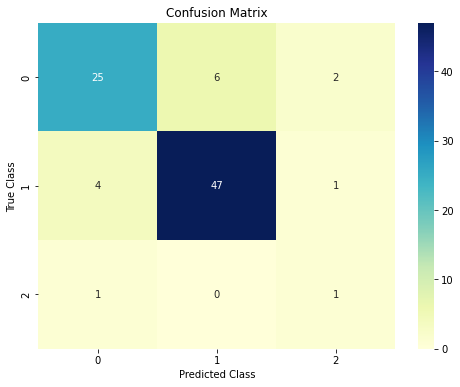

AUC Class 0: 0.89
AUC Class 1: 0.94
AUC Class 2: 0.96
Log Loss: 0.4378


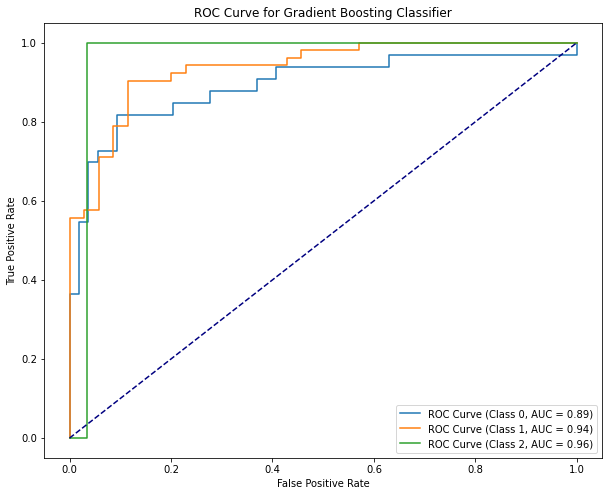

Fold 5 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.9069767441860465
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.82      0.89        33
           1       0.88      0.98      0.93        51
           2       1.00      0.50      0.67         2

    accuracy                           0.91        86
   macro avg       0.95      0.77      0.83        86
weighted avg       0.91      0.91      0.90        86



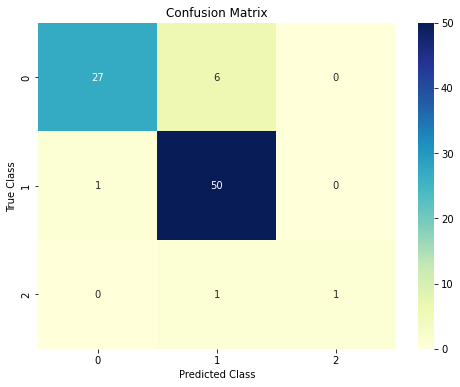

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 0.99
Log Loss: 0.2977


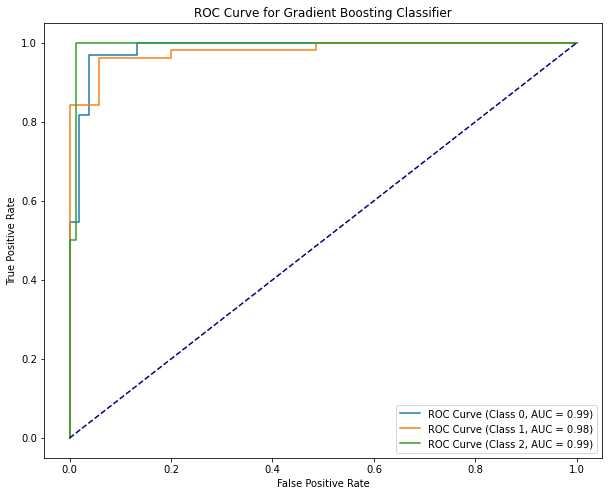

Fold 6 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.7674418604651163
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.64      0.69        33
           1       0.80      0.86      0.83        51
           2       0.33      0.50      0.40         2

    accuracy                           0.77        86
   macro avg       0.63      0.67      0.64        86
weighted avg       0.77      0.77      0.77        86



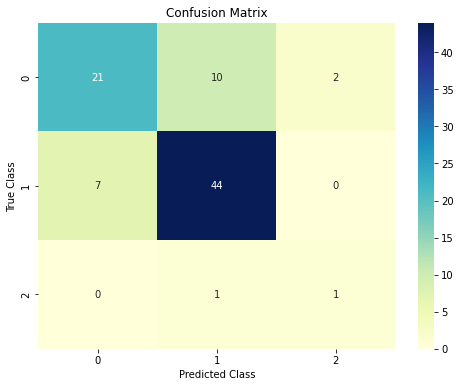

AUC Class 0: 0.84
AUC Class 1: 0.88
AUC Class 2: 0.98
Log Loss: 0.5081


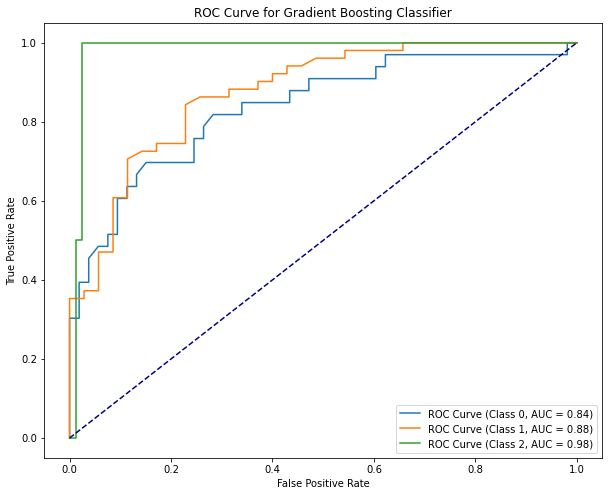

Fold 7 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8604651162790697
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.88      0.84        33
           1       0.92      0.88      0.90        51
           2       0.00      0.00      0.00         2

    accuracy                           0.86        86
   macro avg       0.57      0.59      0.58        86
weighted avg       0.85      0.86      0.86        86



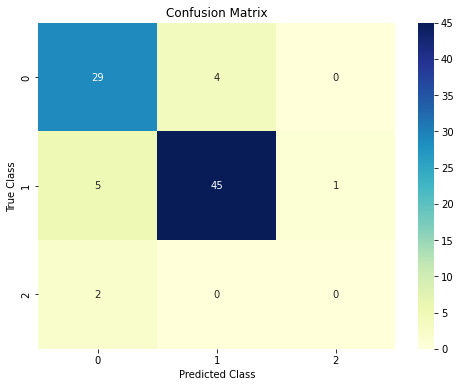

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.95
Log Loss: 0.4095


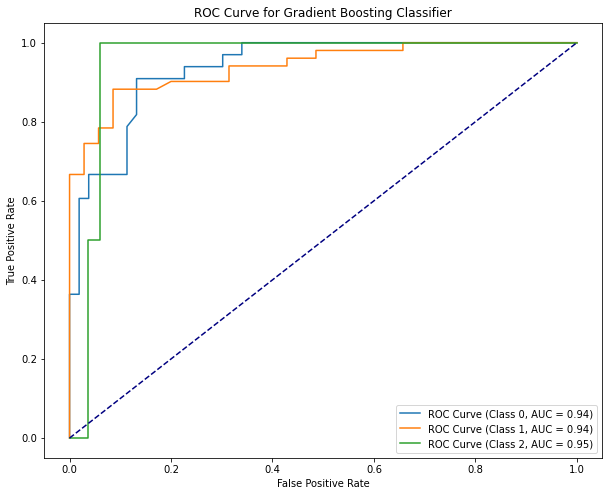

Fold 8 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8255813953488372
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.85      0.80        33
           1       0.88      0.84      0.86        51
           2       0.00      0.00      0.00         2

    accuracy                           0.83        86
   macro avg       0.54      0.56      0.55        86
weighted avg       0.81      0.83      0.82        86



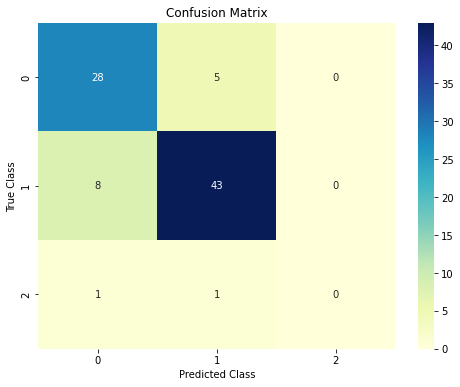

AUC Class 0: 0.90
AUC Class 1: 0.91
AUC Class 2: 0.93
Log Loss: 0.4363


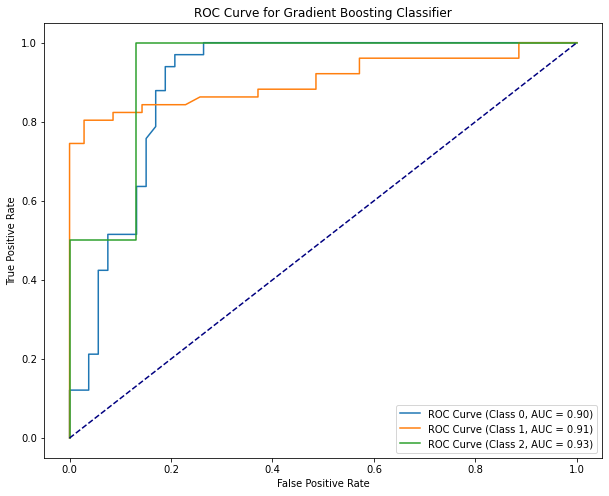

Fold 9 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8372093023255814
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.88      0.82        33
           1       0.91      0.82      0.87        51
           2       0.50      0.50      0.50         2

    accuracy                           0.84        86
   macro avg       0.73      0.73      0.73        86
weighted avg       0.85      0.84      0.84        86



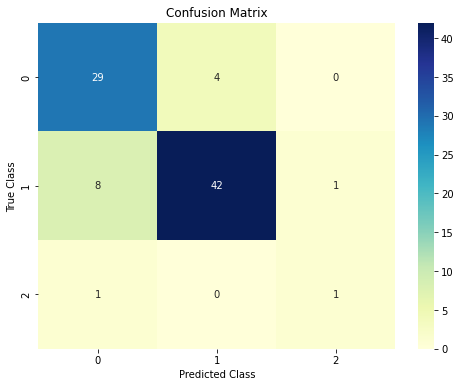

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.99
Log Loss: 0.3359


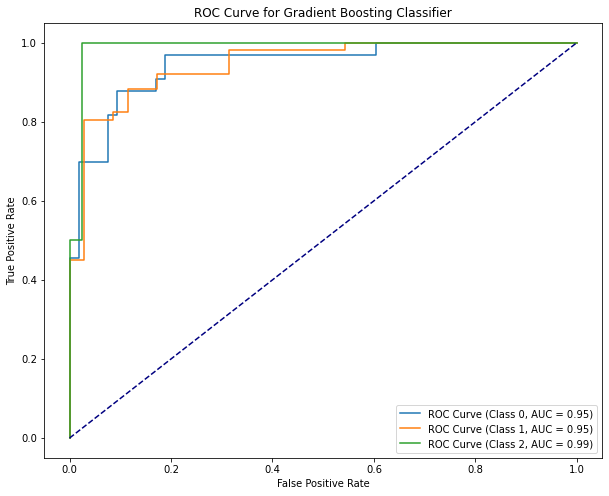

Fold 10 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.813953488372093
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.76      0.77        33
           1       0.83      0.88      0.86        51
           2       0.00      0.00      0.00         2

    accuracy                           0.81        86
   macro avg       0.54      0.55      0.54        86
weighted avg       0.79      0.81      0.80        86



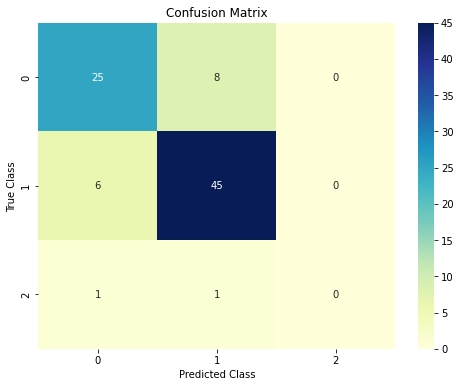

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.97
Log Loss: 0.3903


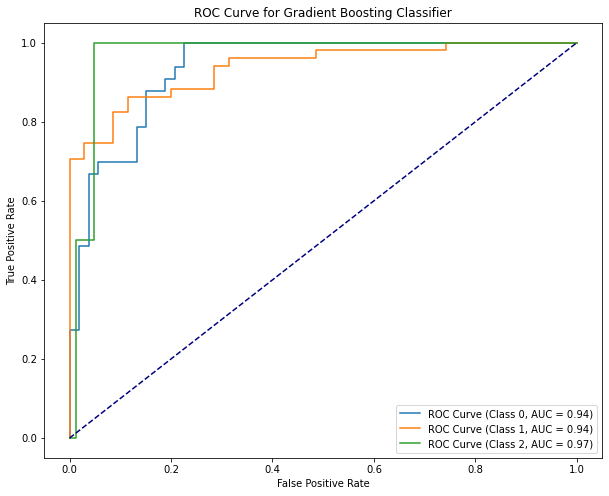


Average Accuracy for 10-fold: 0.8436915263298582
Average AUC for 10-fold: 0.9424252230803594
Average Log Loss for 10-fold: 0.39279039699135593
--------------------------------------------------


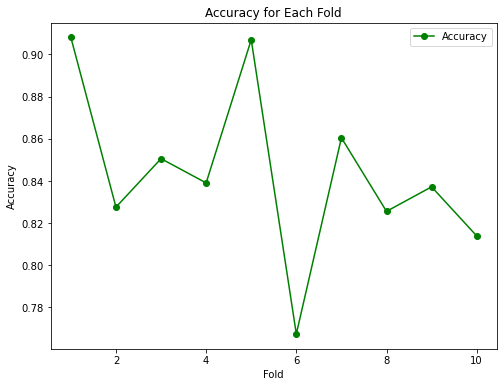

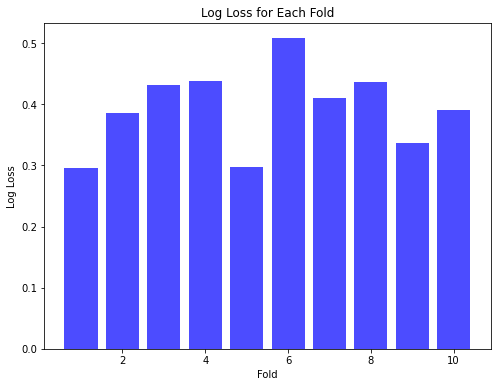


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.908046  0.971940  0.296472
1     2  0.827586  0.936212  0.384959
2     3  0.850575  0.937288  0.430906
3     4  0.839080  0.931266  0.437812
4     5  0.906977  0.986338  0.297661
5     6  0.767442  0.897895  0.508142
6     7  0.860465  0.943370  0.409463
7     8  0.825581  0.912499  0.436260
8     9  0.837209  0.959812  0.335910
9    10  0.813953  0.947632  0.390318
--------------------------------------------------


In [25]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")

    kfold_cv = StratifiedKFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for fold_num, (train_index, val_index) in enumerate(kfold_cv.split(X, y_encoded), start=1):
        X_train_kfold, X_val_kfold = X.iloc[train_index], X.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Check class distribution in each fold
        unique_classes, class_counts = np.unique(y_val_kfold, return_counts=True)
        print(f"Fold {fold_num} Class Distribution: {dict(zip(unique_classes, class_counts))}")

        # Membuat model Gradient Boosting
        gb_classifier = GradientBoostingClassifier(random_state=42)

        # Melatih model
        gb_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = gb_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = gb_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i, class_label in enumerate(gb_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {class_label}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i, class_label in enumerate(gb_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for Gradient Boosting Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")

    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()

    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## CatBoosting


Ratio 20:80
Accuracy: 0.8728323699421965
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.84      0.84        61
           1       0.89      0.93      0.91       107
           2       1.00      0.20      0.33         5

    accuracy                           0.87       173
   macro avg       0.91      0.65      0.69       173
weighted avg       0.88      0.87      0.87       173



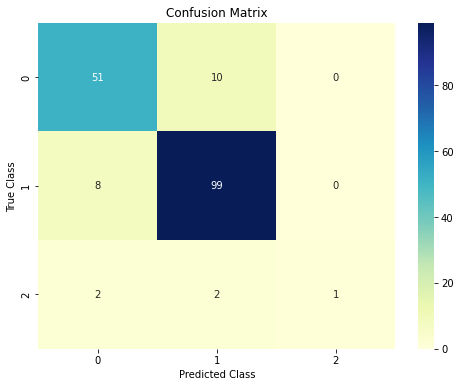

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.96
Log Loss: 0.3441


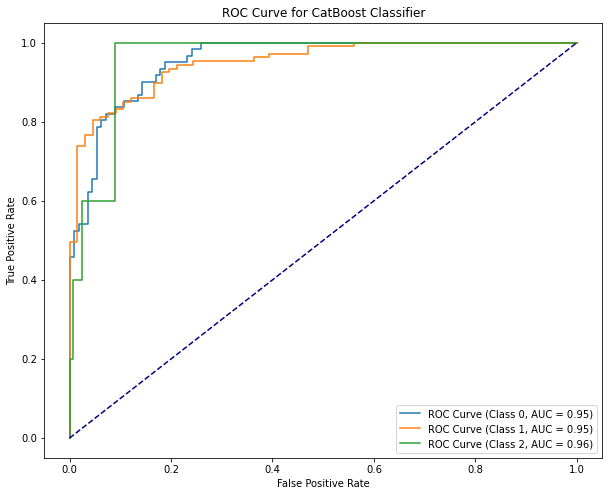


Ratio 30:70
Accuracy: 0.8692307692307693
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.85      0.84        95
           1       0.90      0.90      0.90       160
           2       0.50      0.20      0.29         5

    accuracy                           0.87       260
   macro avg       0.74      0.65      0.68       260
weighted avg       0.87      0.87      0.87       260



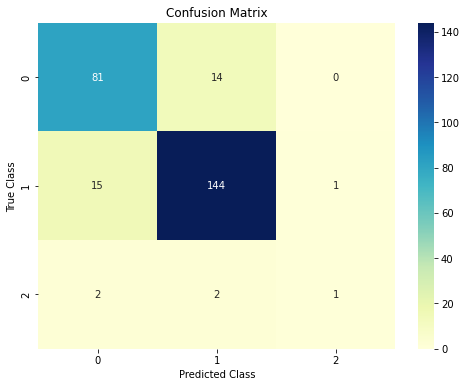

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.95
Log Loss: 0.3323


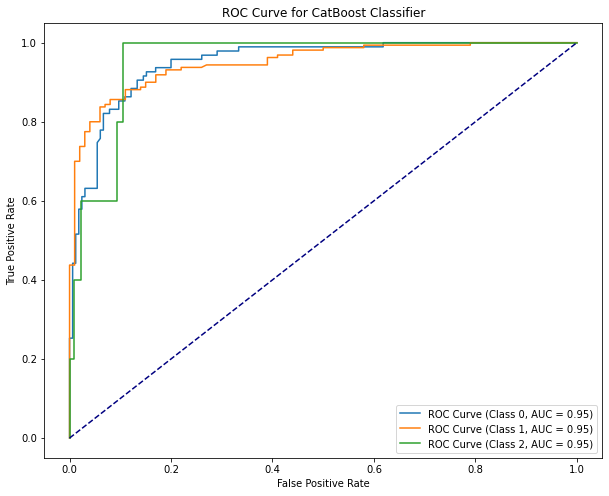


Ratio 40:60
Accuracy: 0.869942196531792
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.86      0.84       129
           1       0.90      0.89      0.89       210
           2       0.75      0.43      0.55         7

    accuracy                           0.87       346
   macro avg       0.83      0.73      0.76       346
weighted avg       0.87      0.87      0.87       346



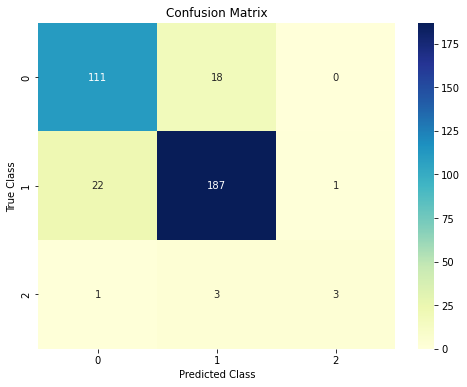

AUC Class 0: 0.95
AUC Class 1: 0.94
AUC Class 2: 0.97
Log Loss: 0.3333


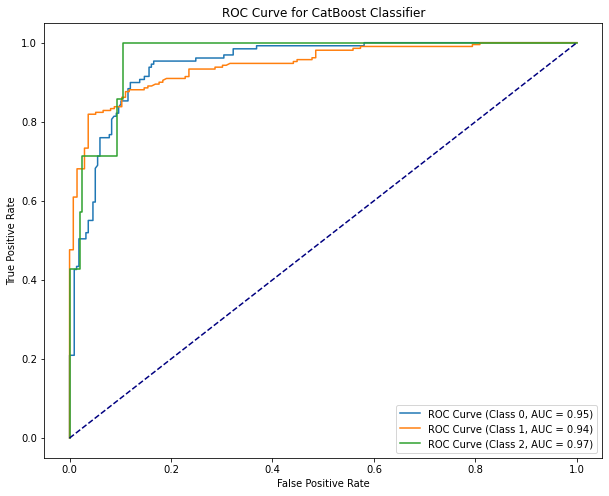

In [26]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model CatBoost
    catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)

    # Melatih model
    catboost_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = catboost_classifier.predict(X_test)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test_encoded, y_pred)
    print("Classification Report:\n", report)
    
    # Menghitung matriks kebingungan
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = catboost_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i, class_label in enumerate(catboost_classifier.classes_):
        fpr, tpr, _ = roc_curve((y_test_encoded == i).astype(int), y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {class_label}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i, class_label in enumerate(catboost_classifier.classes_):
        fpr, tpr, _ = roc_curve((y_test_encoded == i).astype(int), y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for CatBoost Classifier')
    plt.legend()

    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


### Catboosting KFOLD

KFold=5
Fold 1 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.9190751445086706
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.93      0.91        67
           1       0.93      0.93      0.93       102
           2       1.00      0.50      0.67         4

    accuracy                           0.92       173
   macro avg       0.94      0.79      0.84       173
weighted avg       0.92      0.92      0.92       173



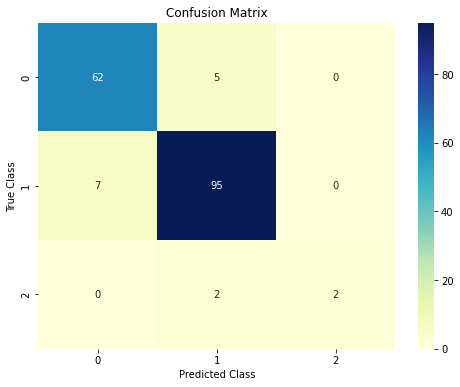

AUC Class 0: 0.96
AUC Class 1: 0.96
AUC Class 2: 0.99
Log Loss: 0.2686


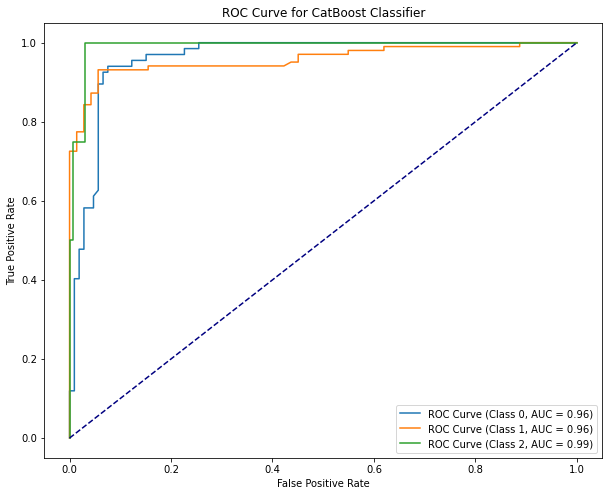

Fold 2 Class Distribution: {0: 67, 1: 102, 2: 4}

Accuracy: 0.8497109826589595
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.79      0.82        67
           1       0.86      0.89      0.88       102
           2       0.75      0.75      0.75         4

    accuracy                           0.85       173
   macro avg       0.82      0.81      0.81       173
weighted avg       0.85      0.85      0.85       173



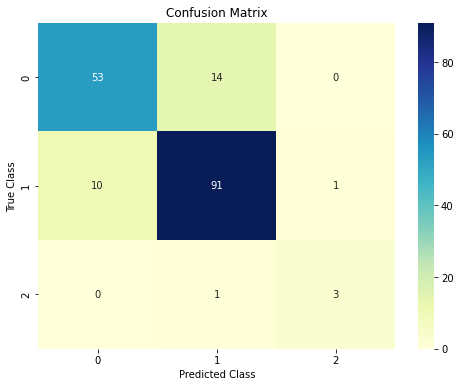

AUC Class 0: 0.93
AUC Class 1: 0.94
AUC Class 2: 0.98
Log Loss: 0.3723


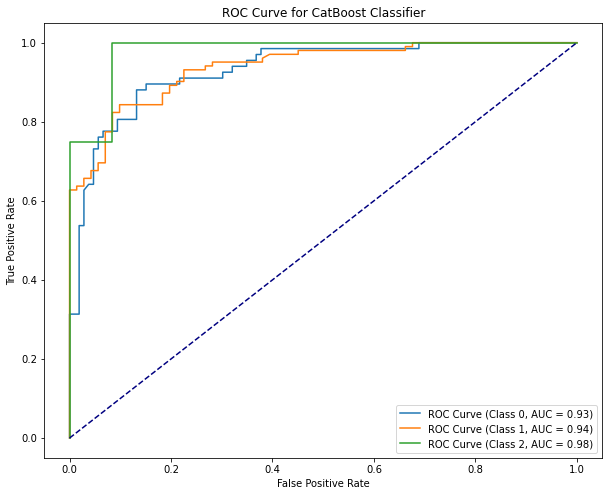

Fold 3 Class Distribution: {0: 66, 1: 102, 2: 5}

Accuracy: 0.8670520231213873
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.77      0.82        66
           1       0.86      0.94      0.90       102
           2       0.75      0.60      0.67         5

    accuracy                           0.87       173
   macro avg       0.83      0.77      0.80       173
weighted avg       0.87      0.87      0.86       173



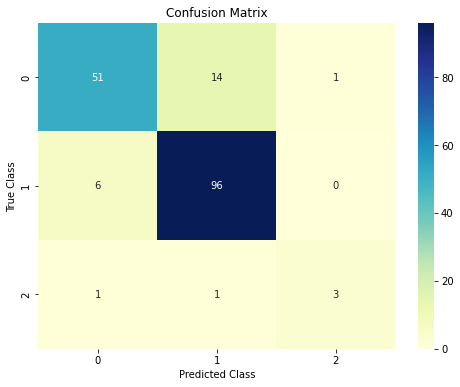

AUC Class 0: 0.94
AUC Class 1: 0.95
AUC Class 2: 0.98
Log Loss: 0.3648


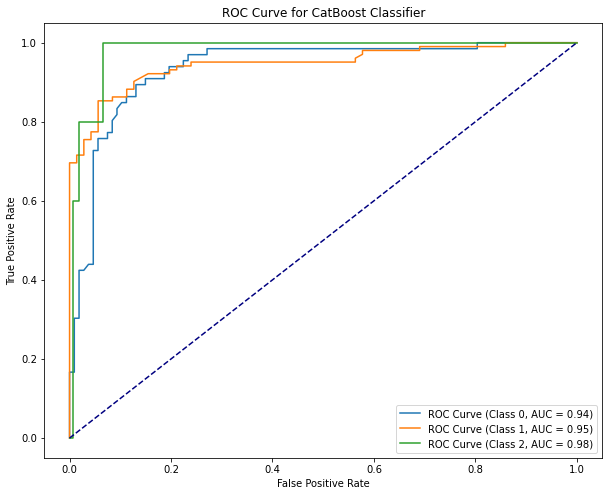

Fold 4 Class Distribution: {0: 66, 1: 103, 2: 4}

Accuracy: 0.8786127167630058
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.89      0.85        66
           1       0.93      0.89      0.91       103
           2       1.00      0.25      0.40         4

    accuracy                           0.88       173
   macro avg       0.91      0.68      0.72       173
weighted avg       0.88      0.88      0.88       173



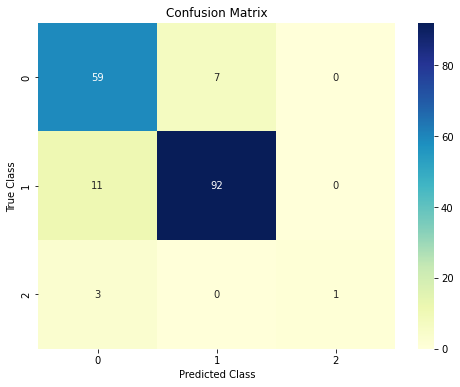

AUC Class 0: 0.94
AUC Class 1: 0.96
AUC Class 2: 0.95
Log Loss: 0.3529


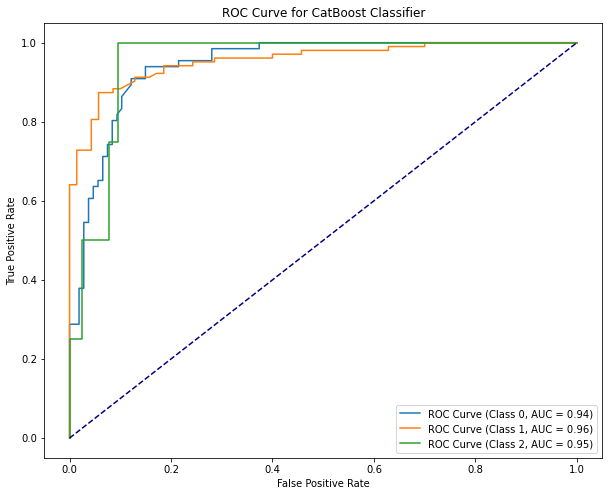

Fold 5 Class Distribution: {0: 66, 1: 102, 2: 4}

Accuracy: 0.877906976744186
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.88      0.86        66
           1       0.91      0.89      0.90       102
           2       0.67      0.50      0.57         4

    accuracy                           0.88       172
   macro avg       0.81      0.76      0.78       172
weighted avg       0.88      0.88      0.88       172



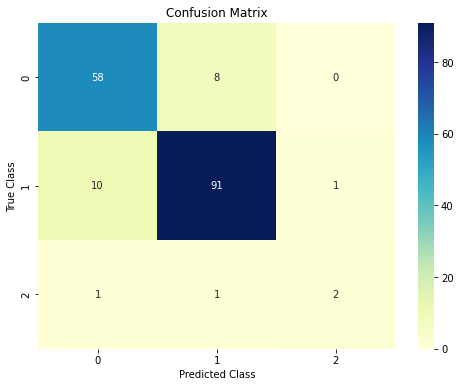

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 1.00
Log Loss: 0.3007


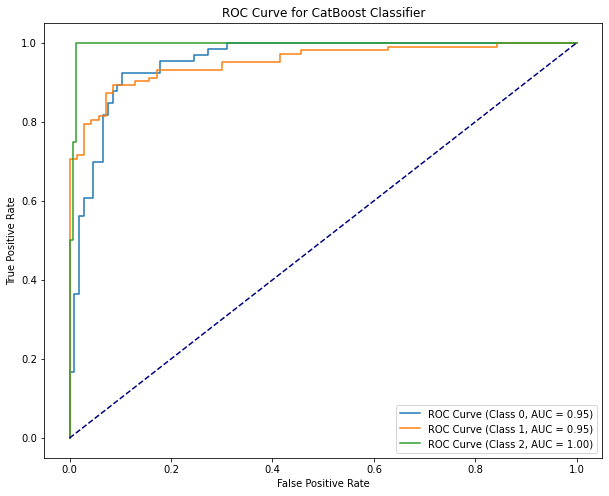


Average Accuracy for 5-fold: 0.8784715687592419
Average AUC for 5-fold: 0.95822527550249
Average Log Loss for 5-fold: 0.3318455170349403
--------------------------------------------------


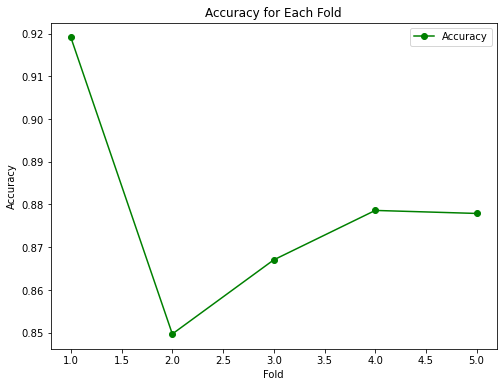

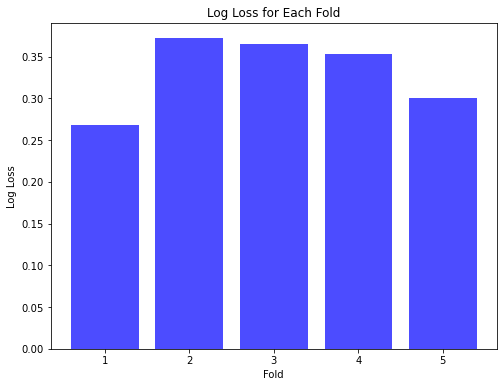


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.919075  0.970141  0.268563
1     2  0.849711  0.949483  0.372295
2     3  0.867052  0.954152  0.364768
3     4  0.878613  0.950477  0.352882
4     5  0.877907  0.966873  0.300719
--------------------------------------------------
KFold=10
Fold 1 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.9310344827586207
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.91      0.93        34
           1       0.92      0.96      0.94        51
           2       1.00      0.50      0.67         2

    accuracy                           0.93        87
   macro avg       0.95      0.79      0.84        87
weighted avg       0.93      0.93      0.93        87



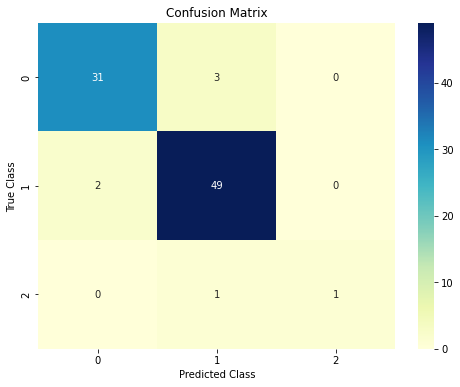

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2556


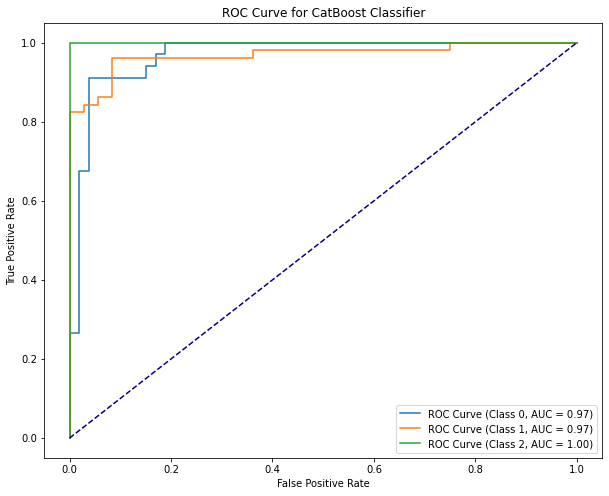

Fold 2 Class Distribution: {0: 34, 1: 51, 2: 2}

Accuracy: 0.8850574712643678
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.94      0.89        34
           1       0.92      0.88      0.90        51
           2       0.00      0.00      0.00         2

    accuracy                           0.89        87
   macro avg       0.59      0.61      0.60        87
weighted avg       0.87      0.89      0.87        87



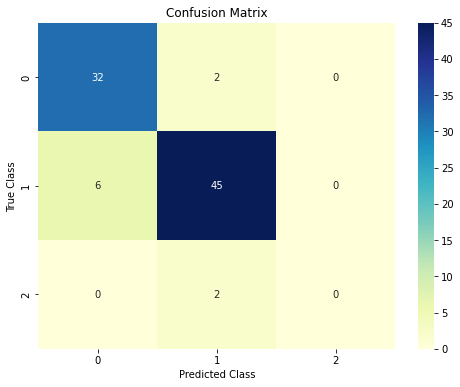

AUC Class 0: 0.96
AUC Class 1: 0.95
AUC Class 2: 0.97
Log Loss: 0.2865


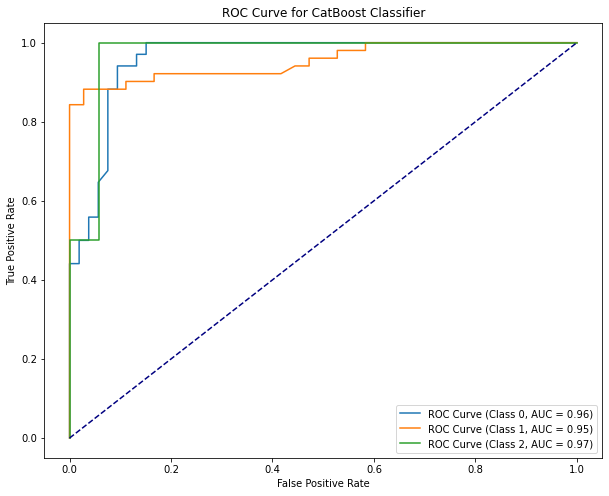

Fold 3 Class Distribution: {0: 33, 1: 51, 2: 3}

Accuracy: 0.8275862068965517
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.73      0.77        33
           1       0.82      0.92      0.87        51
           2       1.00      0.33      0.50         3

    accuracy                           0.83        87
   macro avg       0.88      0.66      0.71        87
weighted avg       0.83      0.83      0.82        87



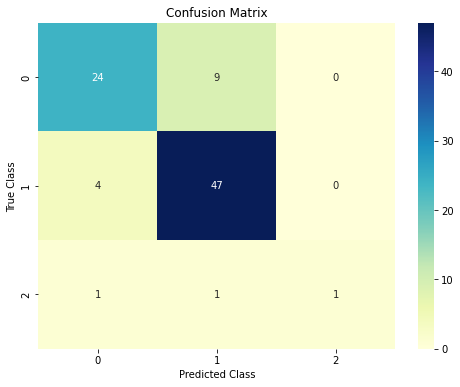

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.97
Log Loss: 0.3889


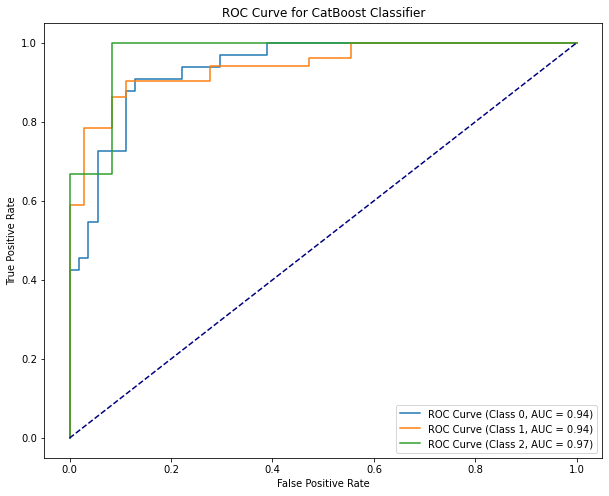

Fold 4 Class Distribution: {0: 33, 1: 52, 2: 2}

Accuracy: 0.8275862068965517
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.76      0.78        33
           1       0.87      0.88      0.88        52
           2       0.33      0.50      0.40         2

    accuracy                           0.83        87
   macro avg       0.67      0.71      0.69        87
weighted avg       0.83      0.83      0.83        87



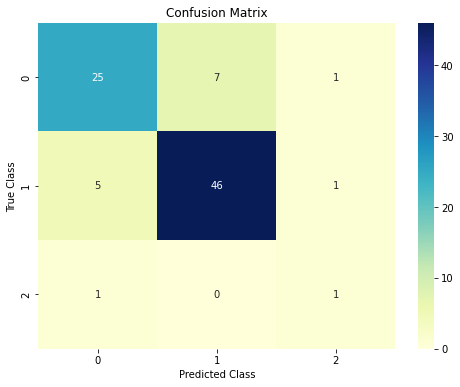

AUC Class 0: 0.92
AUC Class 1: 0.94
AUC Class 2: 0.98
Log Loss: 0.3845


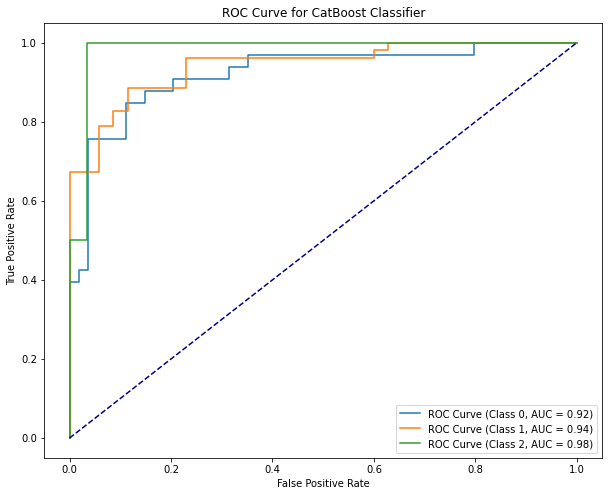

Fold 5 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8837209302325582
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.79      0.85        33
           1       0.86      0.96      0.91        51
           2       1.00      0.50      0.67         2

    accuracy                           0.88        86
   macro avg       0.93      0.75      0.81        86
weighted avg       0.89      0.88      0.88        86



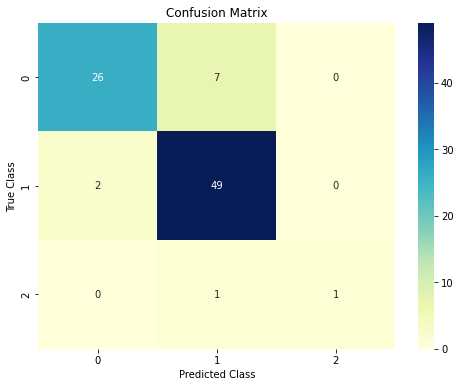

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.98
Log Loss: 0.2805


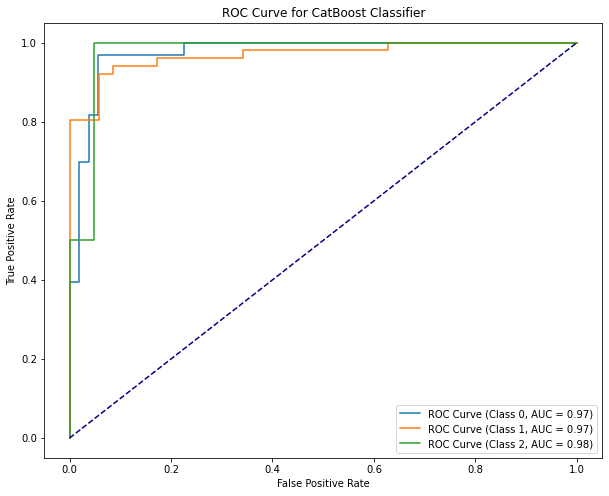

Fold 6 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8488372093023255
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.73      0.79        33
           1       0.85      0.92      0.89        51
           2       0.67      1.00      0.80         2

    accuracy                           0.85        86
   macro avg       0.79      0.88      0.82        86
weighted avg       0.85      0.85      0.85        86



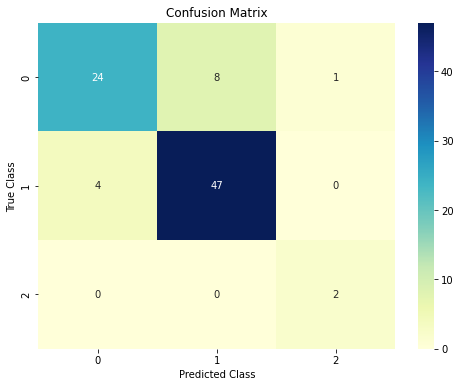

AUC Class 0: 0.91
AUC Class 1: 0.93
AUC Class 2: 0.99
Log Loss: 0.3907


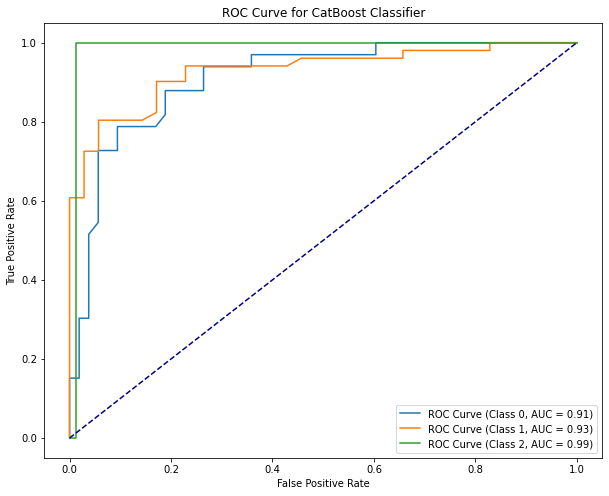

Fold 7 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.9069767441860465
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.94      0.89        33
           1       0.96      0.92      0.94        51
           2       0.00      0.00      0.00         2

    accuracy                           0.91        86
   macro avg       0.60      0.62      0.61        86
weighted avg       0.89      0.91      0.90        86



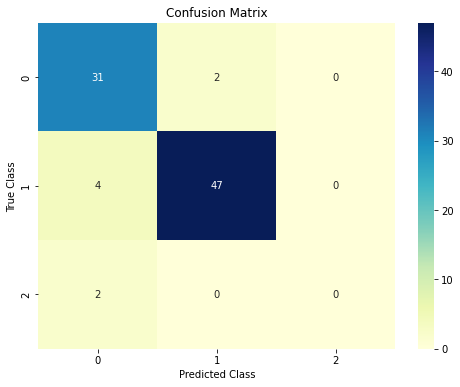

AUC Class 0: 0.96
AUC Class 1: 0.97
AUC Class 2: 0.91
Log Loss: 0.3429


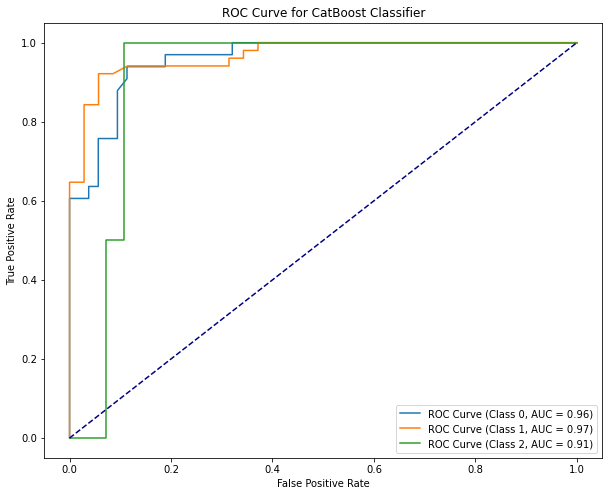

Fold 8 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8372093023255814
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.79      0.79        33
           1       0.87      0.88      0.87        51
           2       1.00      0.50      0.67         2

    accuracy                           0.84        86
   macro avg       0.88      0.72      0.78        86
weighted avg       0.84      0.84      0.84        86



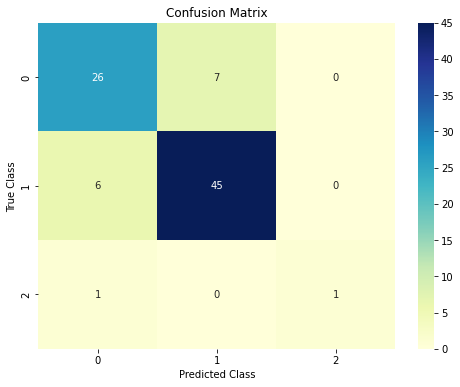

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.99
Log Loss: 0.3697


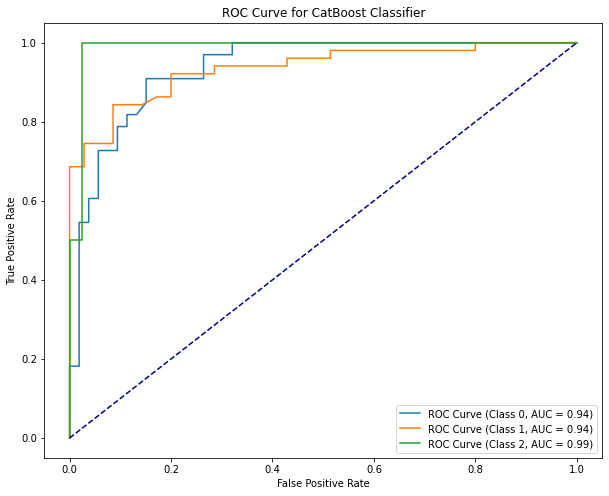

Fold 9 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8953488372093024
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.91      0.88        33
           1       0.94      0.90      0.92        51
           2       0.50      0.50      0.50         2

    accuracy                           0.90        86
   macro avg       0.77      0.77      0.77        86
weighted avg       0.90      0.90      0.90        86



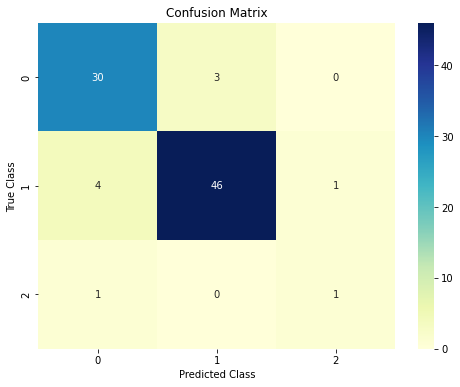

AUC Class 0: 0.96
AUC Class 1: 0.96
AUC Class 2: 0.99
Log Loss: 0.2734


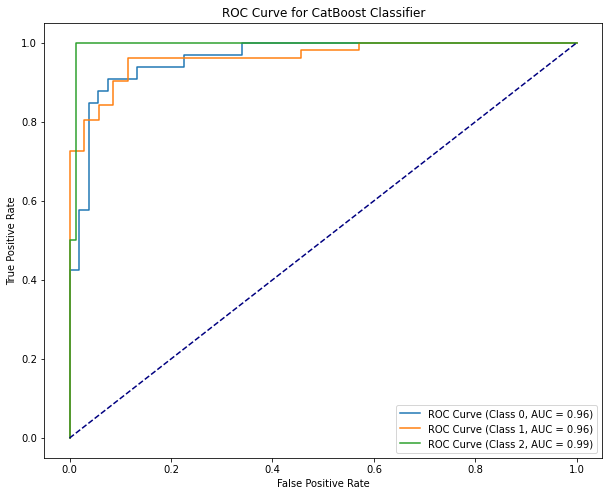

Fold 10 Class Distribution: {0: 33, 1: 51, 2: 2}

Accuracy: 0.8255813953488372
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.76      0.78        33
           1       0.83      0.88      0.86        51
           2       1.00      0.50      0.67         2

    accuracy                           0.83        86
   macro avg       0.88      0.71      0.77        86
weighted avg       0.83      0.83      0.82        86



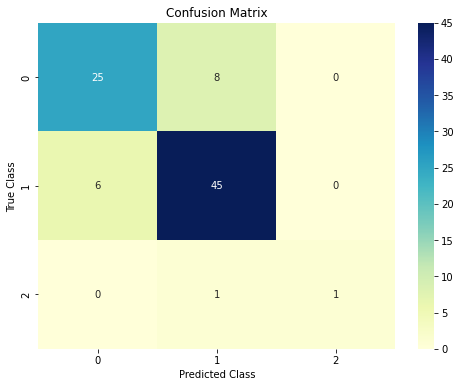

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 1.00
Log Loss: 0.3284


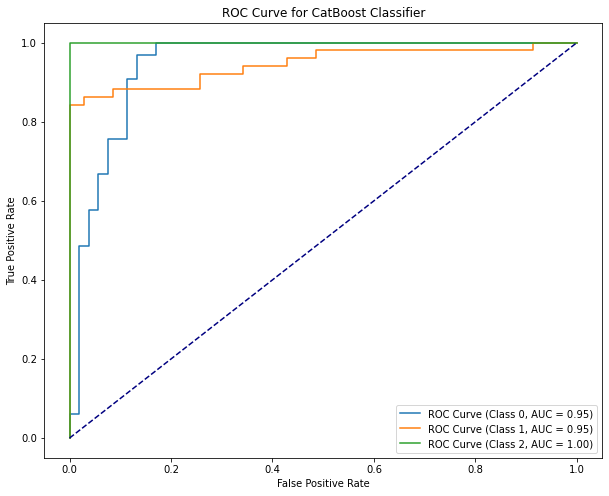


Average Accuracy for 10-fold: 0.8668938786420742
Average AUC for 10-fold: 0.9591009835704003
Average Log Loss for 10-fold: 0.3301129428667749
--------------------------------------------------


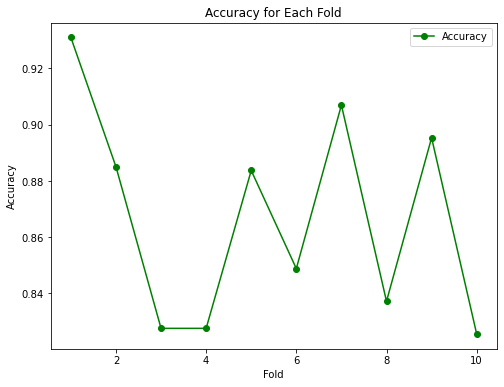

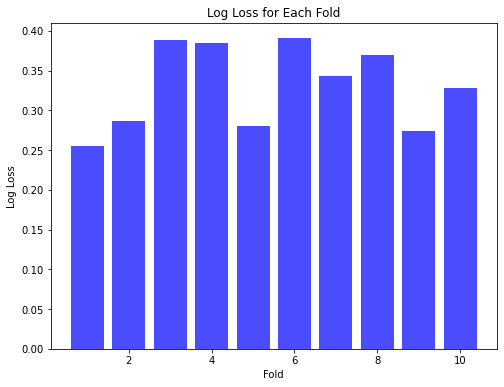


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.931034  0.978926  0.255579
1     2  0.885057  0.961629  0.286483
2     3  0.827586  0.950551  0.388886
3     4  0.827586  0.948886  0.384485
4     5  0.883721  0.973216  0.280519
5     6  0.848837  0.942203  0.390721
6     7  0.906977  0.945683  0.342893
7     8  0.837209  0.953022  0.369698
8     9  0.895349  0.973108  0.273435
9    10  0.825581  0.963784  0.328430
--------------------------------------------------


In [27]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")

    kfold_cv = StratifiedKFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for fold_num, (train_index, val_index) in enumerate(kfold_cv.split(X, y_encoded), start=1):
        X_train_kfold, X_val_kfold = X.iloc[train_index], X.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Check class distribution in each fold
        unique_classes, class_counts = np.unique(y_val_kfold, return_counts=True)
        print(f"Fold {fold_num} Class Distribution: {dict(zip(unique_classes, class_counts))}")

        # Membuat model CatBoost
        catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)

        # Melatih model
        catboost_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = catboost_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = catboost_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i, class_label in enumerate(catboost_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {class_label}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i, class_label in enumerate(catboost_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for CatBoost Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")

    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()

    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## LGBM

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 6
[LightGBM] [Info] Start training from score -0.936021
[LightGBM] [Info] Start training from score -0.536725
[LightGBM] [Info] Start training from score -3.765551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

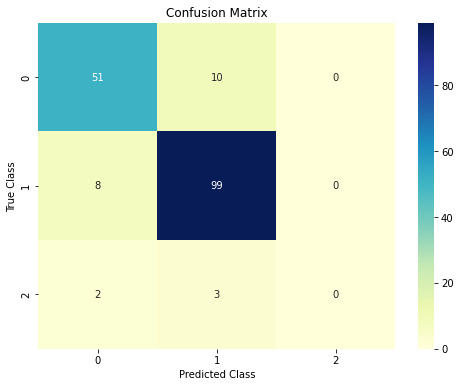

AUC Class 0: 0.96
AUC Class 1: 0.96
AUC Class 2: 0.95
Log Loss: 0.3884


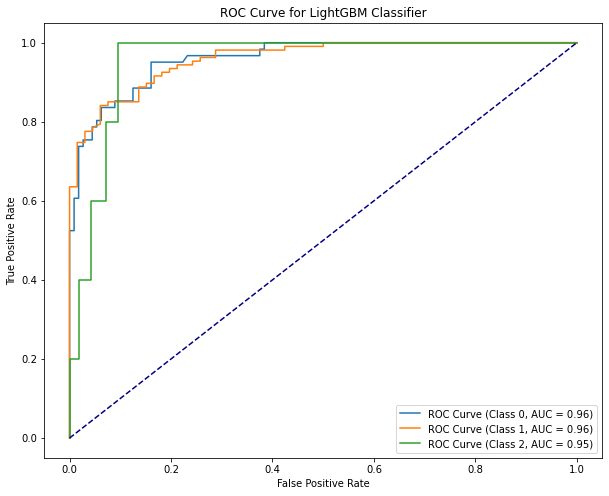

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 168
[LightGBM] [Info] Number of data points in the train set: 604, number of used features: 6
[LightGBM] [Info] Start training from score -0.935514
[LightGBM] [Info] Start training from score -0.542788
[LightGBM] [Info] Start training from score -3.630985
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

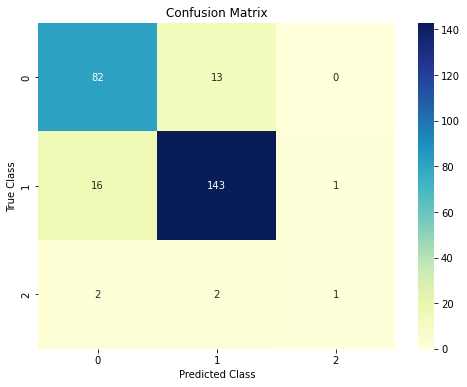

AUC Class 0: 0.96
AUC Class 1: 0.95
AUC Class 2: 0.96
Log Loss: 0.3482


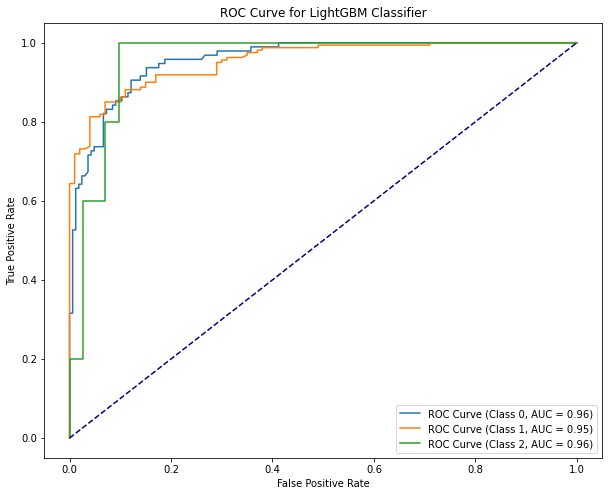

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 518, number of used features: 6
[LightGBM] [Info] Start training from score -0.936769
[LightGBM] [Info] Start training from score -0.542865
[LightGBM] [Info] Start training from score -3.610918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

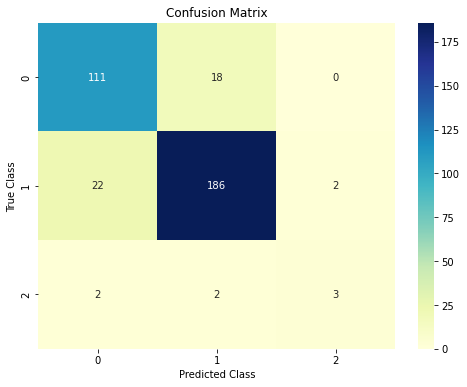

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.96
Log Loss: 0.3270


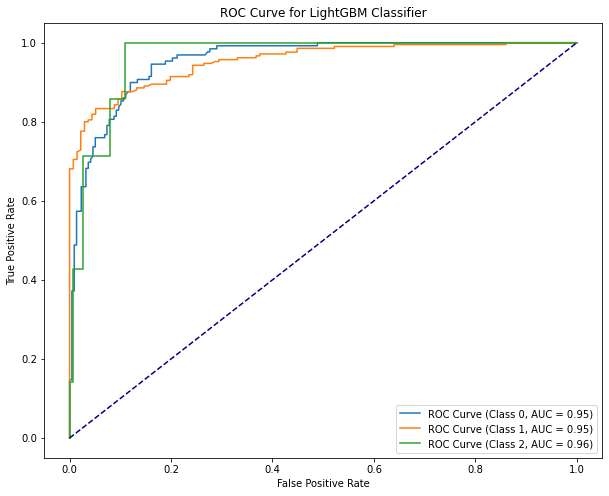

In [28]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, log_loss, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize, LabelEncoder
from sklearn.model_selection import train_test_split

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model LightGBM
    lgbm_classifier = LGBMClassifier(random_state=42)

    # Melatih model
    lgbm_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = lgbm_classifier.predict(X_test)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test_encoded, y_pred)
    print("Classification Report:\n", report)

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = lgbm_classifier.predict_proba(X_test)

    # Memvisualisasikan Confusion Matrix
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(lgbm_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(lgbm_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for LightGBM Classifier')
    plt.legend()

    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


### LGBM Kfold

KFold=5
Fold 1 Class Distribution: {0: 67, 1: 102, 2: 4}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 6
[LightGBM] [Info] Start training from score -0.958410
[LightGBM] [Info] Start training from score -0.524425
[LightGBM] [Info] Start training from score -3.704926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

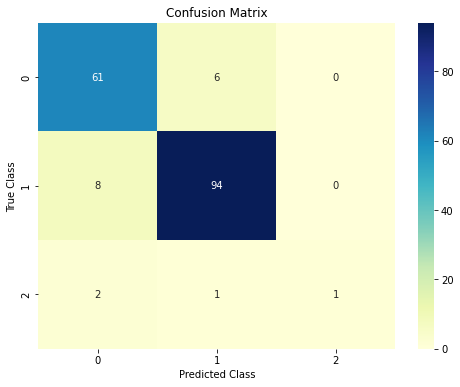

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.98
Log Loss: 0.2688


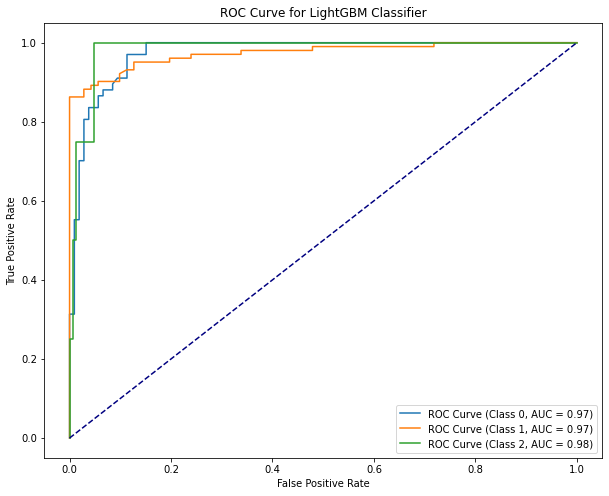

Fold 2 Class Distribution: {0: 67, 1: 102, 2: 4}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 6
[LightGBM] [Info] Start training from score -0.958410
[LightGBM] [Info] Start training from score -0.524425
[LightGBM] [Info] Start training from score -3.704926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

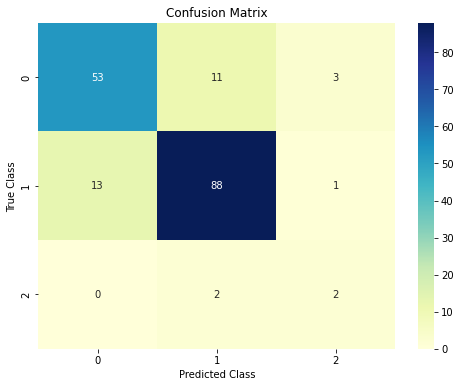

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 0.97
Log Loss: 0.4566


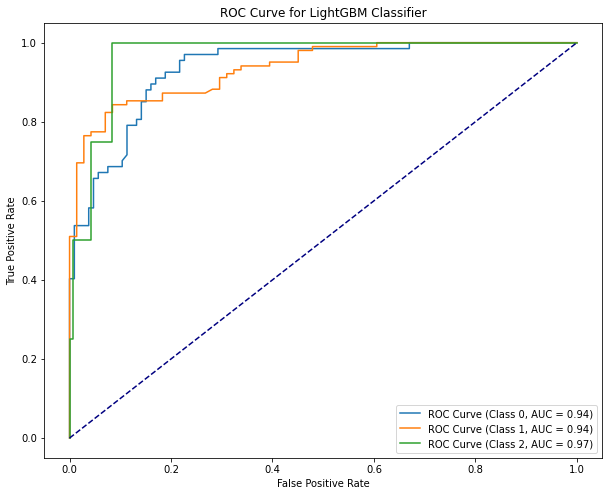

Fold 3 Class Distribution: {0: 66, 1: 102, 2: 5}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 6
[LightGBM] [Info] Start training from score -0.954644
[LightGBM] [Info] Start training from score -0.524425
[LightGBM] [Info] Start training from score -3.765551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

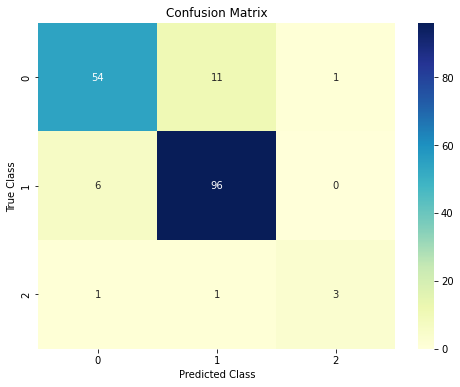

AUC Class 0: 0.96
AUC Class 1: 0.96
AUC Class 2: 0.98
Log Loss: 0.3482


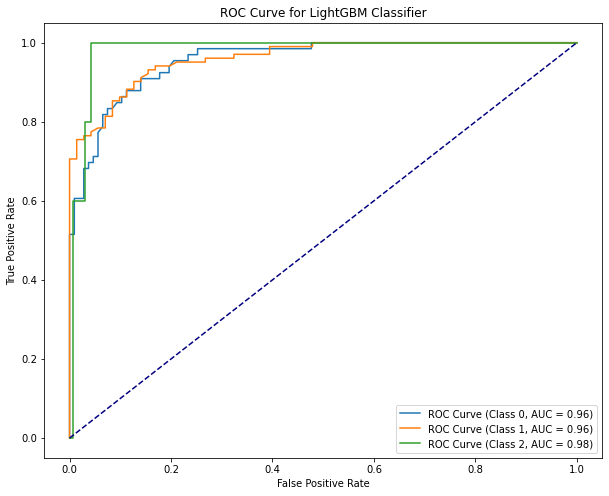

Fold 4 Class Distribution: {0: 66, 1: 103, 2: 4}
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000026 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 6
[LightGBM] [Info] Start training from score -0.954644
[LightGBM] [Info] Start training from score -0.526873
[LightGBM] [Info] Start training from score -3.704926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

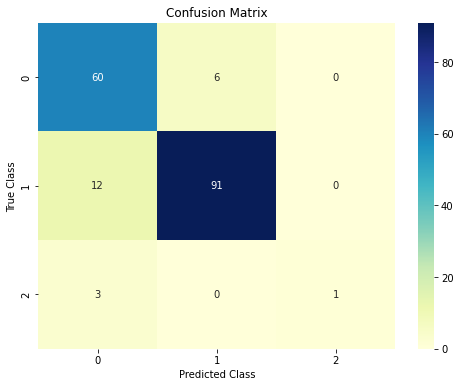

AUC Class 0: 0.95
AUC Class 1: 0.96
AUC Class 2: 0.95
Log Loss: 0.3827


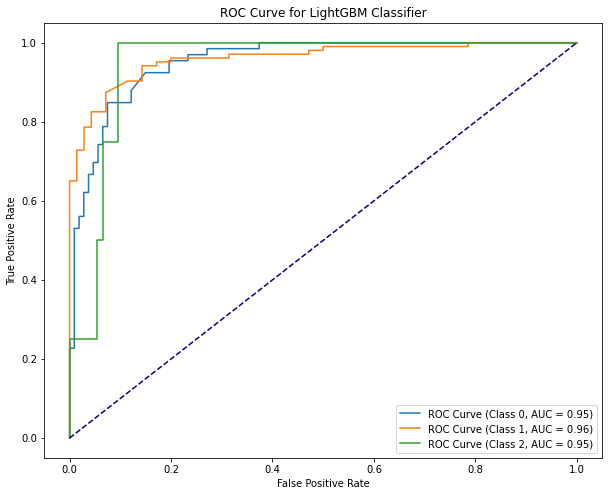

Fold 5 Class Distribution: {0: 66, 1: 102, 2: 4}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 692, number of used features: 6
[LightGBM] [Info] Start training from score -0.956090
[LightGBM] [Info] Start training from score -0.525871
[LightGBM] [Info] Start training from score -3.706373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

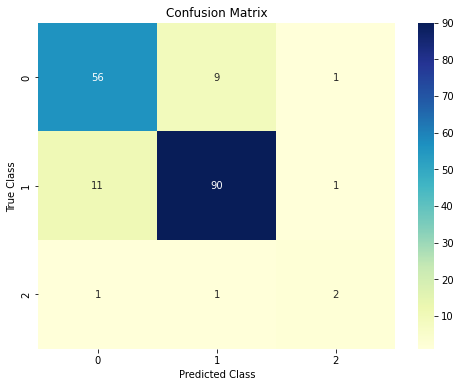

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.99
Log Loss: 0.3542


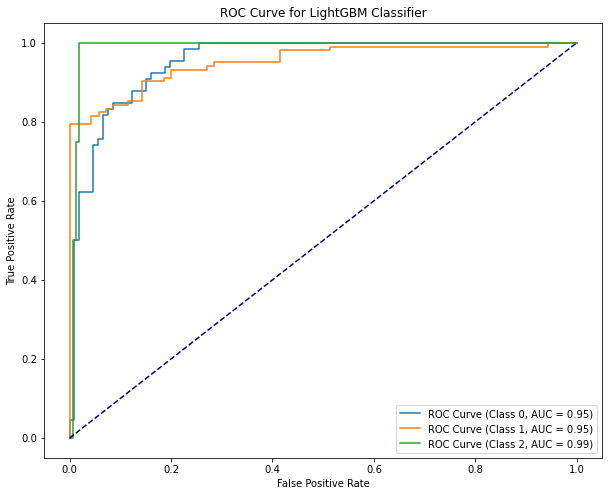


Average Accuracy for 5-fold: 0.8703589192095711
Average AUC for 5-fold: 0.9615683701428448
Average Log Loss for 5-fold: 0.362110791495066
--------------------------------------------------


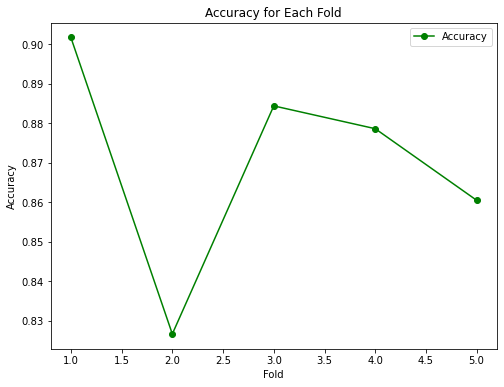

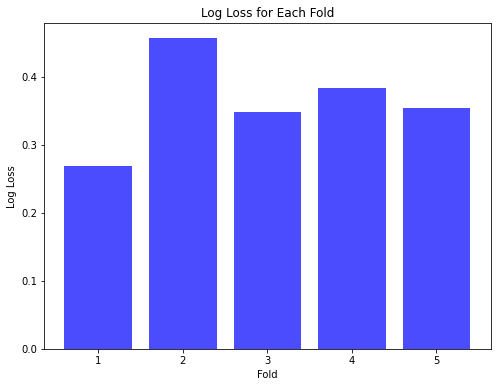


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.901734  0.977242  0.268843
1     2  0.826590  0.946388  0.456575
2     3  0.884393  0.966390  0.348231
3     4  0.878613  0.953168  0.382728
4     5  0.860465  0.964653  0.354177
--------------------------------------------------
KFold=10
Fold 1 Class Distribution: {0: 34, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 777, number of used features: 6
[LightGBM] [Info] Start training from score -0.958347
[LightGBM] [Info] Start training from score -0.524214
[LightGBM] [Info] Start training from score -3.711001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

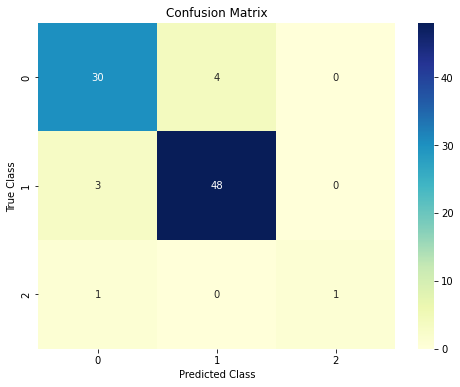

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.98
Log Loss: 0.2800


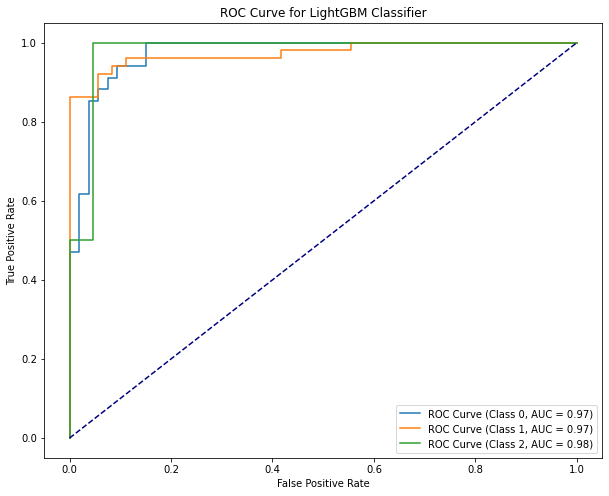

Fold 2 Class Distribution: {0: 34, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 777, number of used features: 6
[LightGBM] [Info] Start training from score -0.958347
[LightGBM] [Info] Start training from score -0.524214
[LightGBM] [Info] Start training from score -3.711001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

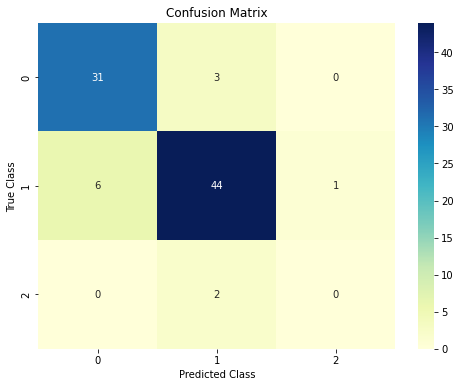

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 0.99
Log Loss: 0.2511


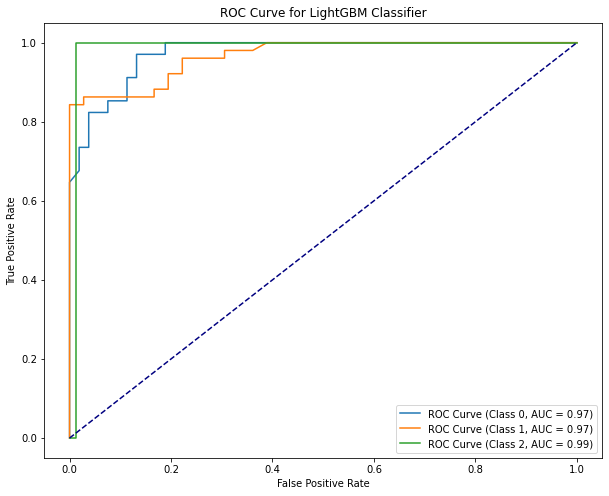

Fold 3 Class Distribution: {0: 33, 1: 51, 2: 3}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 777, number of used features: 6
[LightGBM] [Info] Start training from score -0.954997
[LightGBM] [Info] Start training from score -0.524214
[LightGBM] [Info] Start training from score -3.765069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

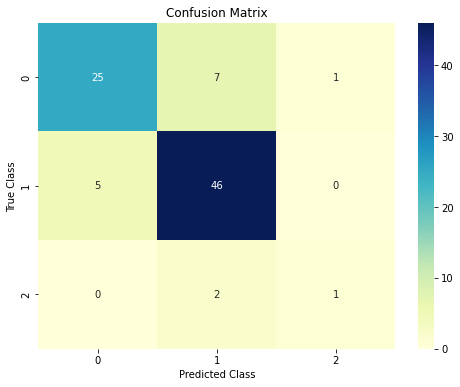

AUC Class 0: 0.94
AUC Class 1: 0.93
AUC Class 2: 0.95
Log Loss: 0.5359


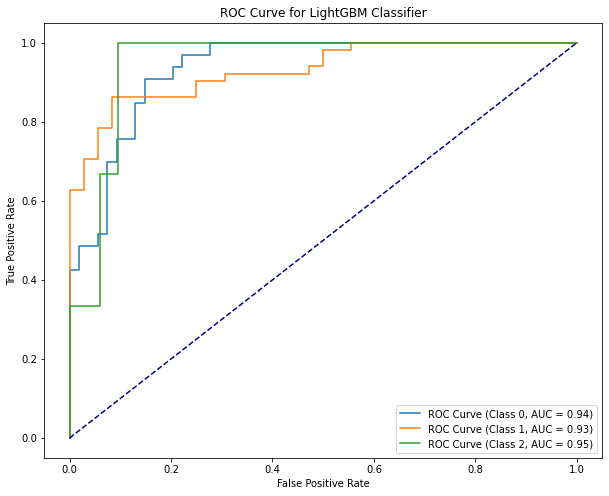

Fold 4 Class Distribution: {0: 33, 1: 52, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 777, number of used features: 6
[LightGBM] [Info] Start training from score -0.954997
[LightGBM] [Info] Start training from score -0.526390
[LightGBM] [Info] Start training from score -3.711001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

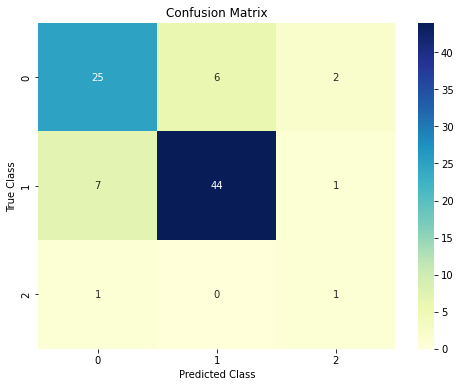

AUC Class 0: 0.91
AUC Class 1: 0.94
AUC Class 2: 0.96
Log Loss: 0.5632


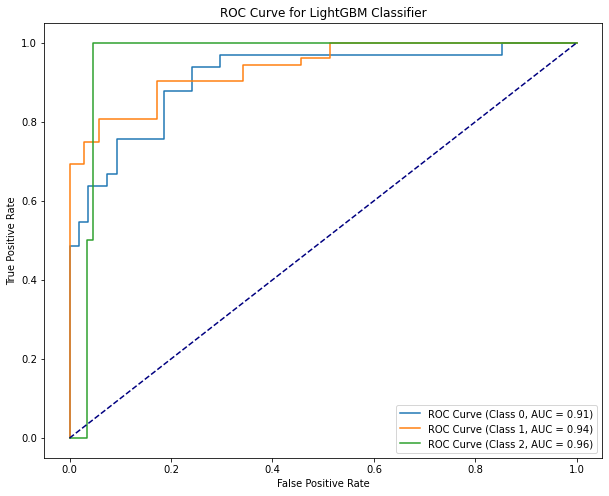

Fold 5 Class Distribution: {0: 33, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 778, number of used features: 6
[LightGBM] [Info] Start training from score -0.956283
[LightGBM] [Info] Start training from score -0.525500
[LightGBM] [Info] Start training from score -3.712288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

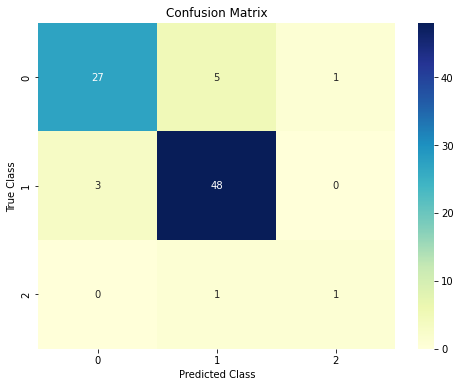

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 0.99
Log Loss: 0.2439


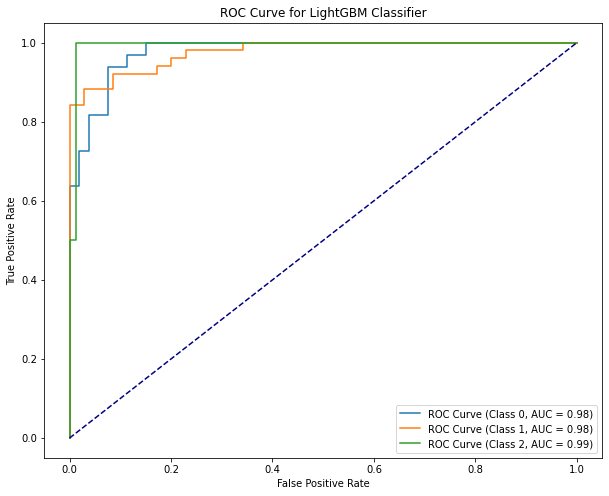

Fold 6 Class Distribution: {0: 33, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000031 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 778, number of used features: 6
[LightGBM] [Info] Start training from score -0.956283
[LightGBM] [Info] Start training from score -0.525500
[LightGBM] [Info] Start training from score -3.712288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

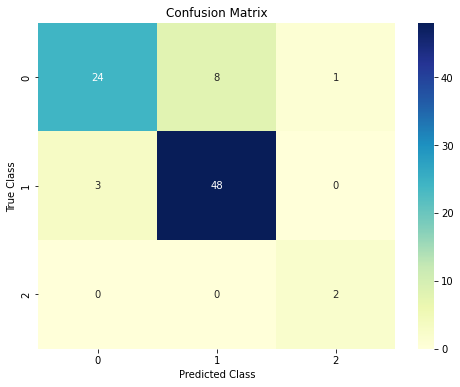

AUC Class 0: 0.92
AUC Class 1: 0.94
AUC Class 2: 0.99
Log Loss: 0.4074


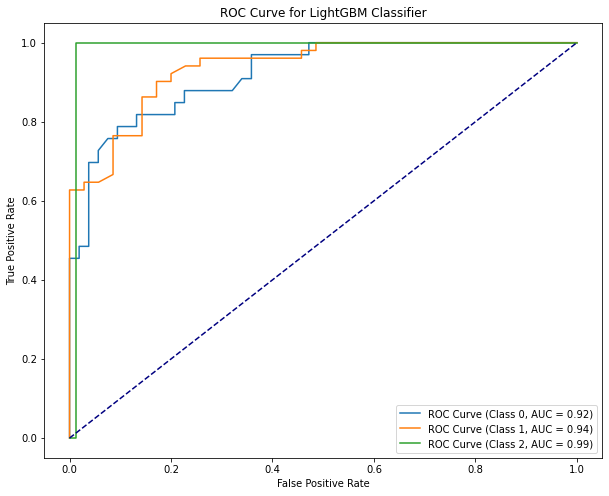

Fold 7 Class Distribution: {0: 33, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 172
[LightGBM] [Info] Number of data points in the train set: 778, number of used features: 6
[LightGBM] [Info] Start training from score -0.956283
[LightGBM] [Info] Start training from score -0.525500
[LightGBM] [Info] Start training from score -3.712288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

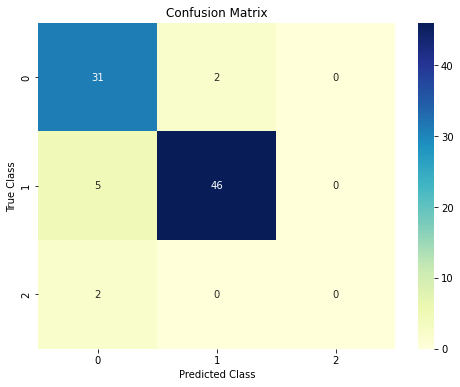

AUC Class 0: 0.97
AUC Class 1: 0.98
AUC Class 2: 0.93
Log Loss: 0.3529


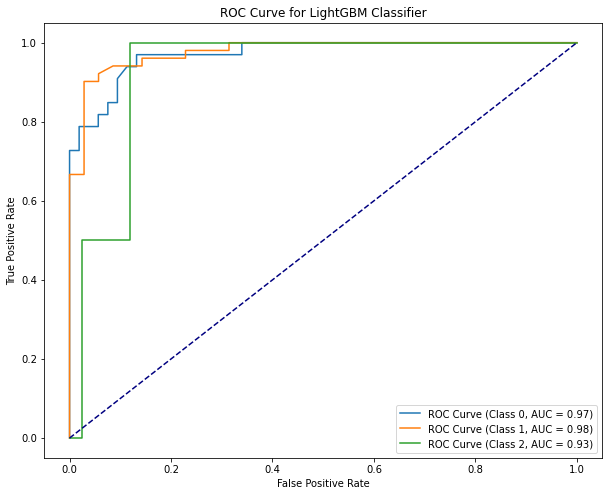

Fold 8 Class Distribution: {0: 33, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 778, number of used features: 6
[LightGBM] [Info] Start training from score -0.956283
[LightGBM] [Info] Start training from score -0.525500
[LightGBM] [Info] Start training from score -3.712288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

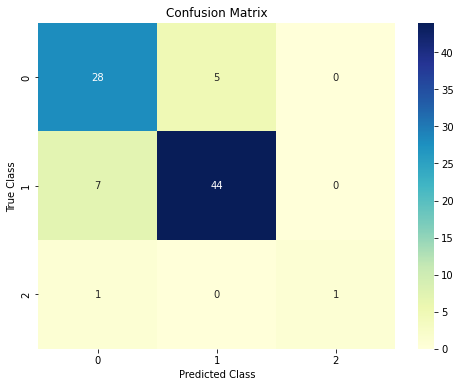

AUC Class 0: 0.94
AUC Class 1: 0.94
AUC Class 2: 1.00
Log Loss: 0.4044


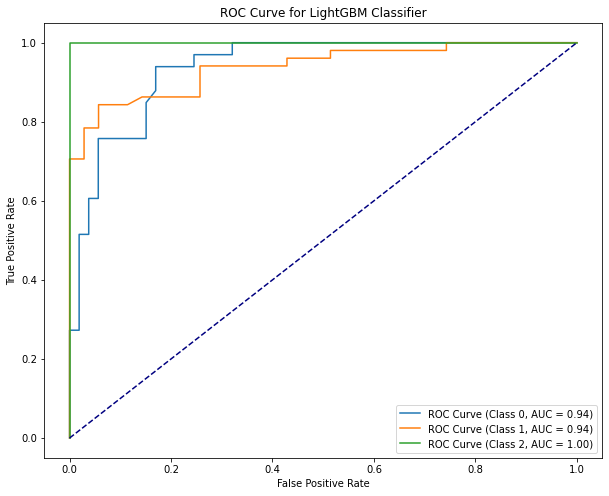

Fold 9 Class Distribution: {0: 33, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 778, number of used features: 6
[LightGBM] [Info] Start training from score -0.956283
[LightGBM] [Info] Start training from score -0.525500
[LightGBM] [Info] Start training from score -3.712288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

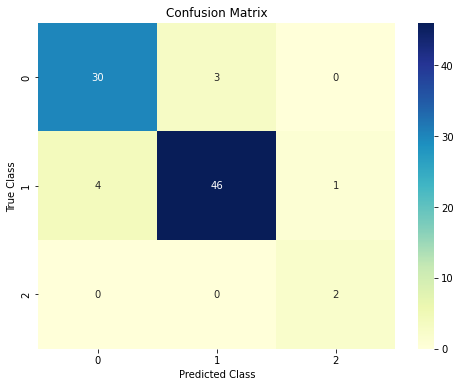

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2412


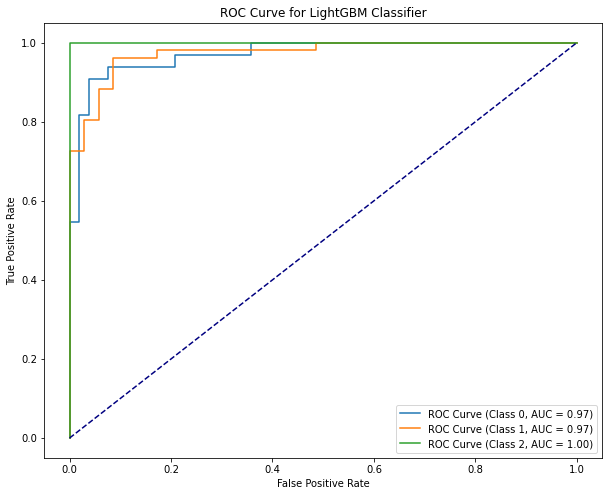

Fold 10 Class Distribution: {0: 33, 1: 51, 2: 2}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 176
[LightGBM] [Info] Number of data points in the train set: 778, number of used features: 6
[LightGBM] [Info] Start training from score -0.956283
[LightGBM] [Info] Start training from score -0.525500
[LightGBM] [Info] Start training from score -3.712288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

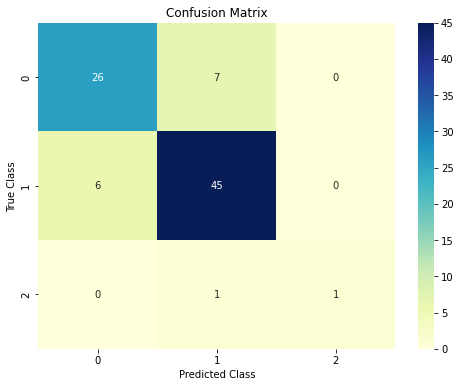

AUC Class 0: 0.95
AUC Class 1: 0.95
AUC Class 2: 0.99
Log Loss: 0.4465


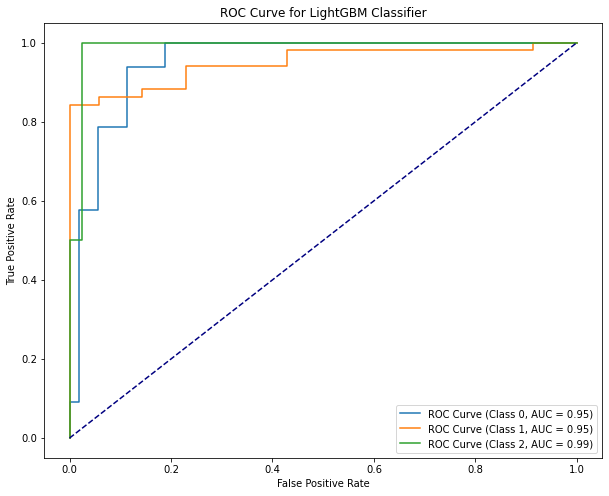


Average Accuracy for 10-fold: 0.8634856990109595
Average AUC for 10-fold: 0.9618920100557787
Average Log Loss for 10-fold: 0.372636997416418
--------------------------------------------------


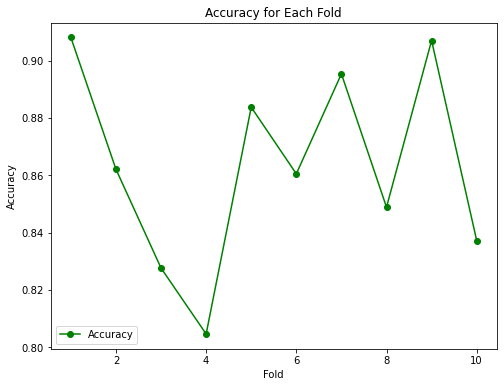

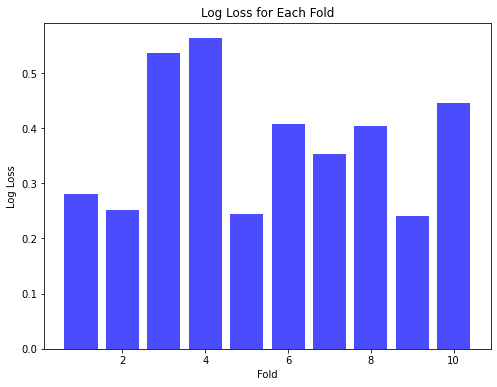


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.908046  0.974378  0.279952
1     2  0.862069  0.975941  0.251114
2     3  0.827586  0.938604  0.535920
3     4  0.804598  0.936219  0.563159
4     5  0.883721  0.982927  0.243850
5     6  0.860465  0.949007  0.407403
6     7  0.895349  0.959193  0.352891
7     8  0.848837  0.958683  0.404405
8     9  0.906977  0.981884  0.241159
9    10  0.837209  0.962084  0.446516
--------------------------------------------------


In [29]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")

    kfold_cv = StratifiedKFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for fold_num, (train_index, val_index) in enumerate(kfold_cv.split(X, y_encoded), start=1):
        X_train_kfold, X_val_kfold = X.iloc[train_index], X.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Check class distribution in each fold
        unique_classes, class_counts = np.unique(y_val_kfold, return_counts=True)
        print(f"Fold {fold_num} Class Distribution: {dict(zip(unique_classes, class_counts))}")

        # Membuat model LightGBM
        lgbm_classifier = LGBMClassifier(random_state=42)

        # Melatih model
        lgbm_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = lgbm_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = lgbm_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i, class_label in enumerate(lgbm_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {class_label}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i, class_label in enumerate(lgbm_classifier.classes_):
            fpr, tpr, _ = roc_curve((y_val_kfold == class_label).astype(int), y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for LightGBM Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")

    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()

    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


# Implementasi SMOTE pada Model Boosting dengan HOCV

In [30]:
from imblearn.over_sampling import SMOTE  # imblearn untuk penanganan ketidakseimbangan kelas (Oversampling)
# Melakukan oversampling dengan SMOTE
smote = SMOTE(random_state=42) #Memangil SMOTE dengan random state 42  menghasilkan hasil yang dapat direproduksi secara konsisten. 
X_resampled, y_resampled = smote.fit_resample(X, y) # menyimpan hasil over samping tersebut pada x y resampled

## XGBOOST SMOTE


Ratio 20:80
Accuracy: 0.9381107491856677
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91        88
           1       0.93      0.88      0.91       104
           2       0.98      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.93      0.94      0.93       307
weighted avg       0.94      0.94      0.94       307



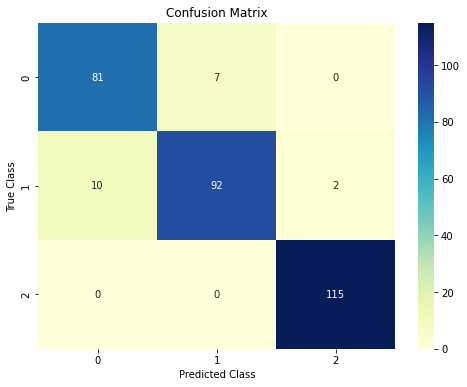

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2041


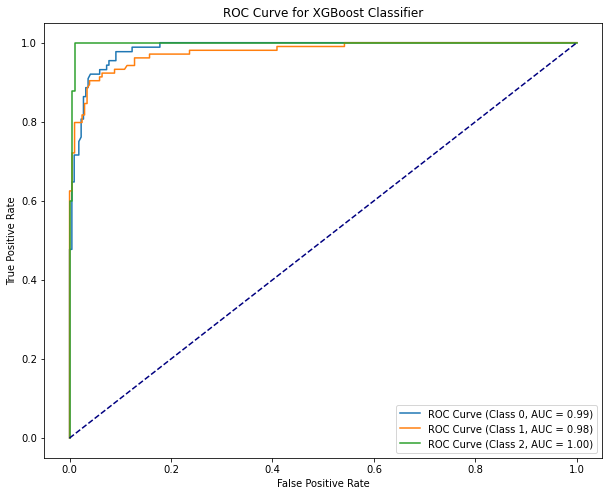


Ratio 30:70
Accuracy: 0.9326086956521739
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91       142
           1       0.92      0.88      0.90       154
           2       0.97      0.99      0.98       164

    accuracy                           0.93       460
   macro avg       0.93      0.93      0.93       460
weighted avg       0.93      0.93      0.93       460



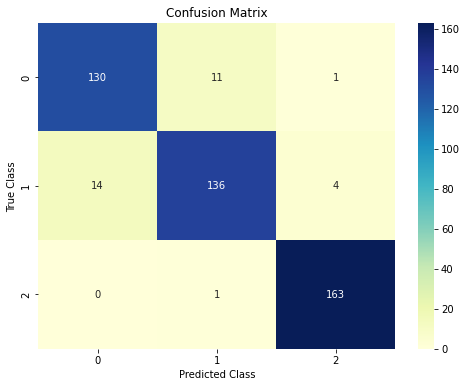

AUC Class 0: 0.99
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2035


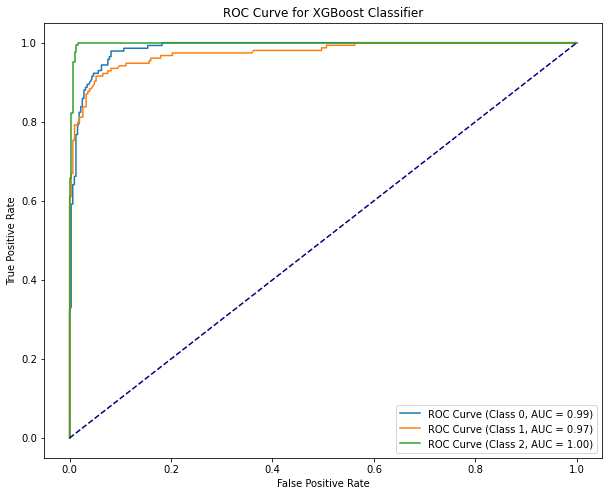


Ratio 40:60
Accuracy: 0.9218241042345277
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.87      0.89       200
           1       0.88      0.90      0.89       203
           2       0.97      1.00      0.98       211

    accuracy                           0.92       614
   macro avg       0.92      0.92      0.92       614
weighted avg       0.92      0.92      0.92       614



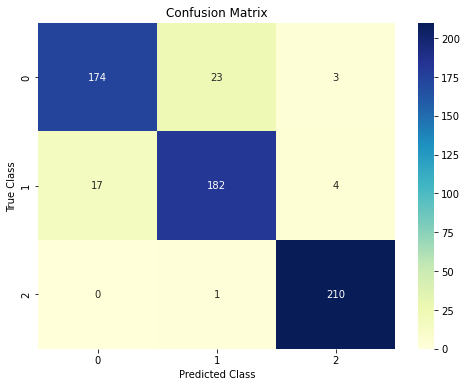

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2190


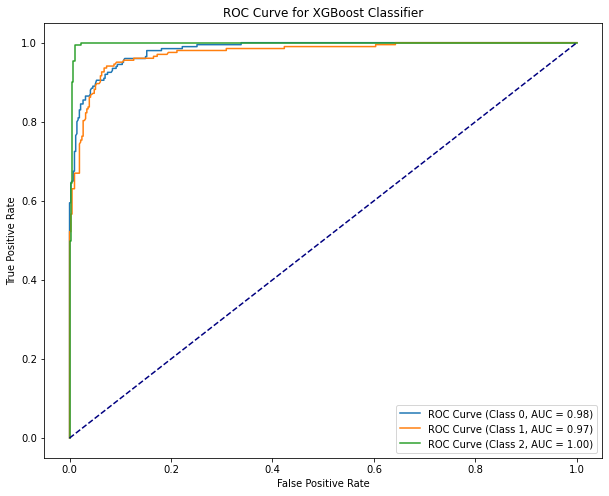

In [31]:
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model XGBoost
    xgb_classifier = XGBClassifier(random_state=42)

    # Melatih model
    xgb_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = xgb_classifier.predict(X_test)

    # Evaluasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    report = classification_report(y_test_encoded, y_pred)
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)

    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)
    print("Classification Report:\n", report)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = xgb_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(xgb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(xgb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for XGBoost Classifier')
    plt.legend()
    
    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()
    
    

## ADABoost SMOTE


Ratio 20:80
Accuracy: 0.6970684039087948
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.69      0.58        88
           1       0.58      0.38      0.46       104
           2       0.97      0.99      0.98       115

    accuracy                           0.70       307
   macro avg       0.68      0.69      0.67       307
weighted avg       0.70      0.70      0.69       307



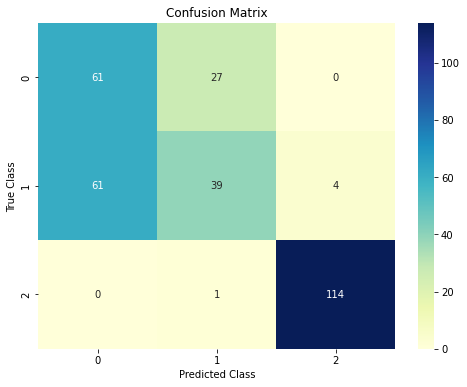

AUC Class 0: 0.74
AUC Class 1: 0.72
AUC Class 2: 0.99
Log Loss: 0.8703


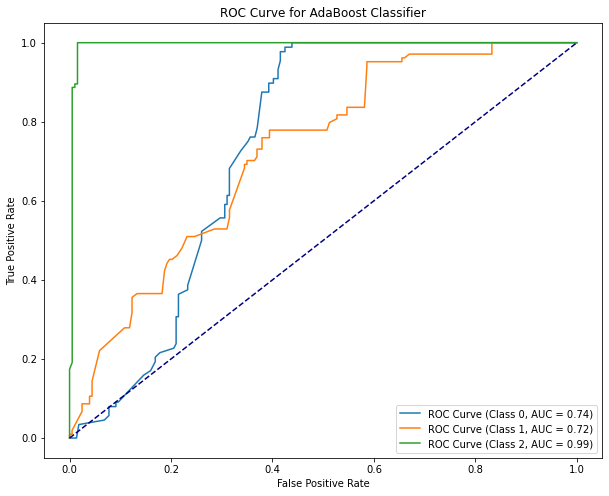


Ratio 30:70
Accuracy: 0.6326086956521739
Classification Report:
               precision    recall  f1-score   support

           0       0.45      0.56      0.50       142
           1       0.45      0.32      0.37       154
           2       0.94      0.99      0.97       164

    accuracy                           0.63       460
   macro avg       0.61      0.62      0.61       460
weighted avg       0.62      0.63      0.62       460



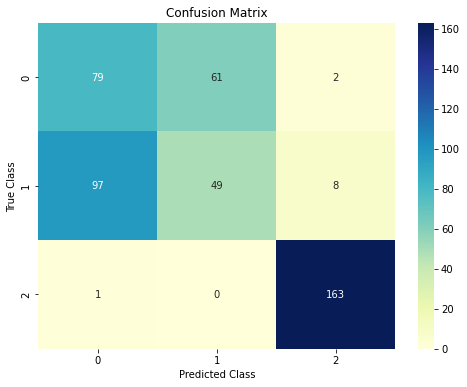

AUC Class 0: 0.71
AUC Class 1: 0.73
AUC Class 2: 1.00
Log Loss: 0.8620


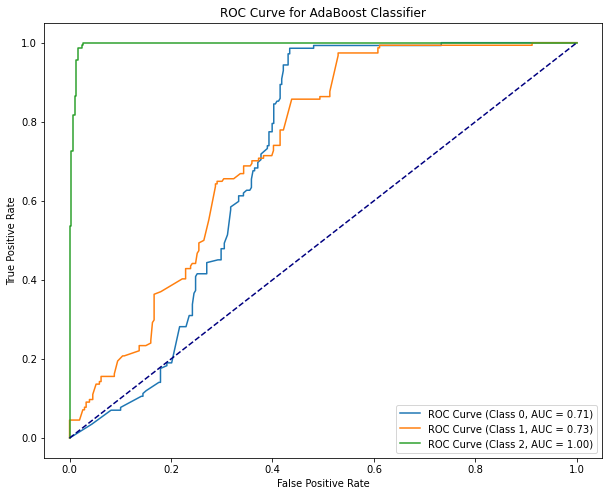


Ratio 40:60
Accuracy: 0.6482084690553745
Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.73      0.58       200
           1       0.45      0.21      0.29       203
           2       0.95      0.99      0.97       211

    accuracy                           0.65       614
   macro avg       0.63      0.64      0.61       614
weighted avg       0.64      0.65      0.62       614



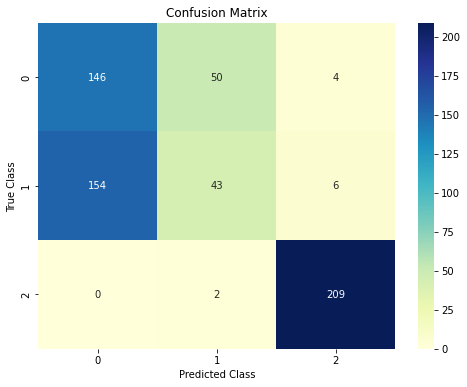

AUC Class 0: 0.72
AUC Class 1: 0.71
AUC Class 2: 0.99
Log Loss: 0.8878


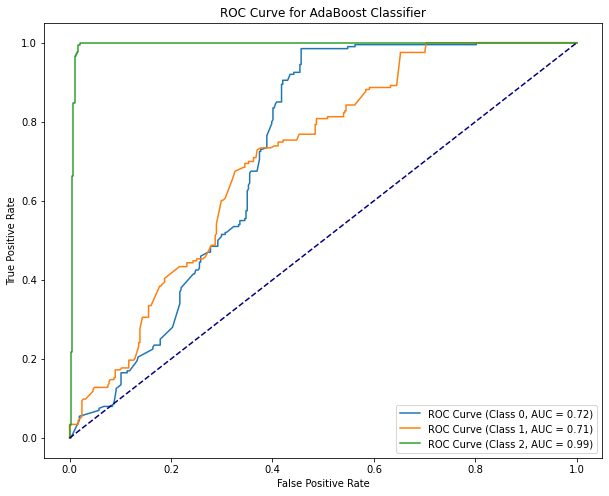

In [32]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize, LabelEncoder
from sklearn.model_selection import train_test_split

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model Adaboost dengan Decision Tree Classifier sebagai base estimator
    ada_classifier = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1), random_state=42)

    # Melatih model
    ada_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = ada_classifier.predict(X_test)

    # Evaluasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    report = classification_report(y_test_encoded, y_pred)
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)

    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)
    print("Classification Report:\n", report)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = ada_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(ada_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(ada_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for AdaBoost Classifier')
    plt.legend()
    
    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


## GradientBoosting Clasifire SMOTE


Ratio 20:80
Accuracy: 0.9185667752442996
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.92      0.89        88
           1       0.92      0.83      0.87       104
           2       0.97      1.00      0.98       115

    accuracy                           0.92       307
   macro avg       0.91      0.92      0.91       307
weighted avg       0.92      0.92      0.92       307



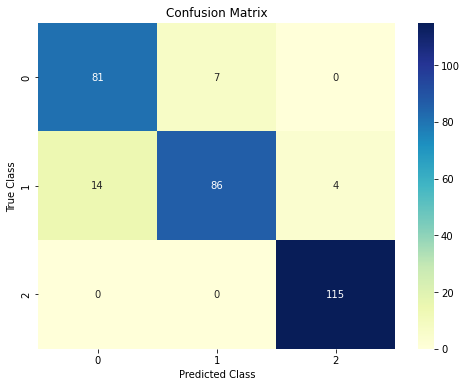

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2254


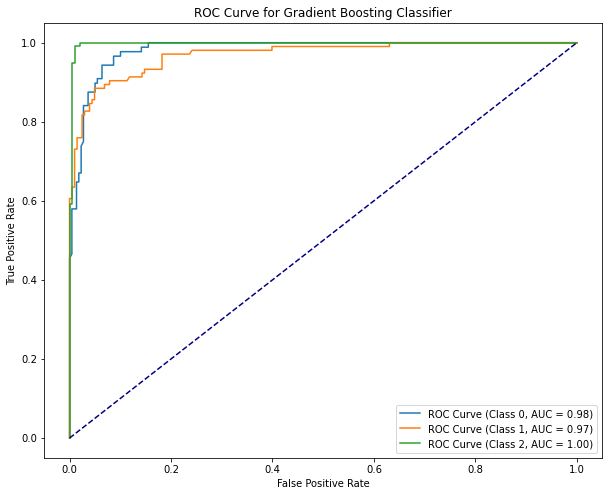


Ratio 30:70
Accuracy: 0.9173913043478261
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.89      0.89       142
           1       0.90      0.85      0.88       154
           2       0.95      1.00      0.98       164

    accuracy                           0.92       460
   macro avg       0.92      0.92      0.91       460
weighted avg       0.92      0.92      0.92       460



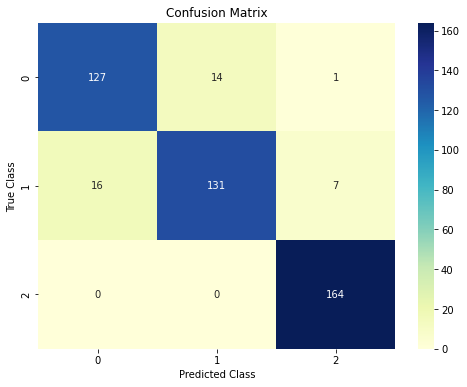

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2329


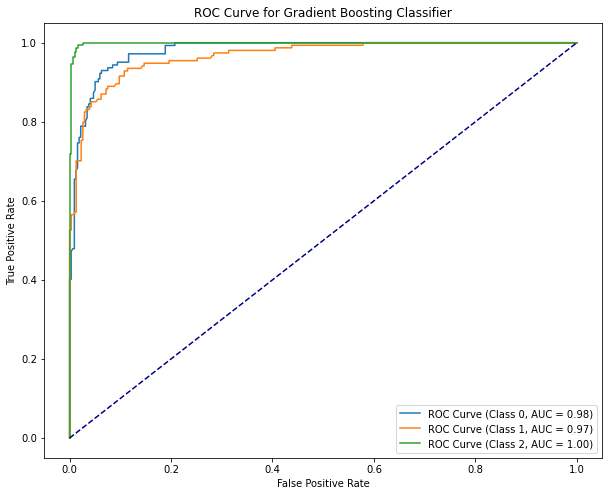


Ratio 40:60
Accuracy: 0.8957654723127035
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.84      0.86       200
           1       0.85      0.84      0.85       203
           2       0.96      1.00      0.98       211

    accuracy                           0.90       614
   macro avg       0.89      0.89      0.89       614
weighted avg       0.89      0.90      0.89       614



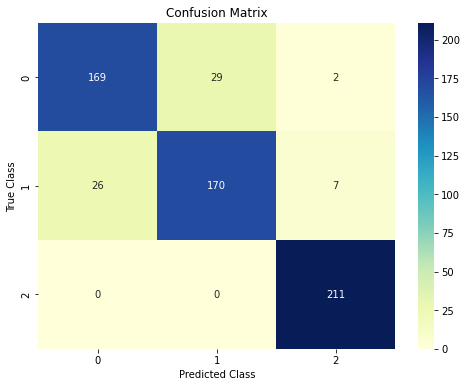

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2501


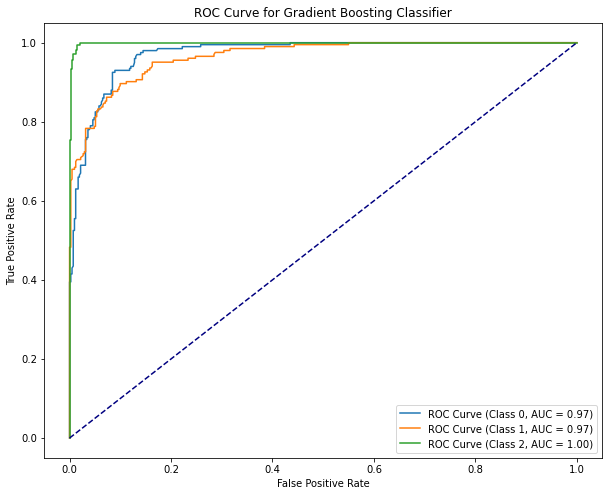

In [33]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model Gradient Boosting
    gb_classifier = GradientBoostingClassifier(random_state=42)

    # Melatih model
    gb_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = gb_classifier.predict(X_test)

    # Evaluasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    report = classification_report(y_test_encoded, y_pred)
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)

    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)
    print("Classification Report:\n", report)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = gb_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(gb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(gb_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Gradient Boosting Classifier')
    plt.legend()
    
    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


## LGBM SMOTE

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 1226, number of used features: 6
[LightGBM] [Info] Start training from score -1.064140
[LightGBM] [Info] Start training from score -1.102699
[LightGBM] [Info] Start training from score -1.130098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ratio 20:80
Accuracy: 0.9381107491856677
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91        88
           1       0.93      0.88      0.91       104
           2       0.98      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.93      0.94      0.93       307
weighted avg       0.94      0.94      0.94       307



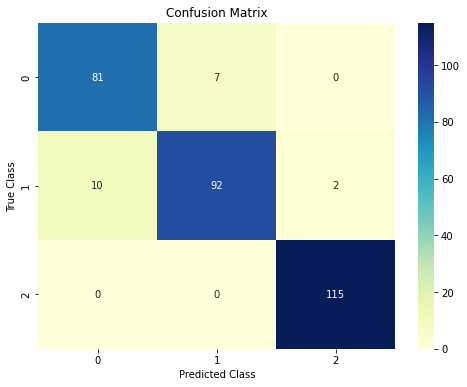

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2147


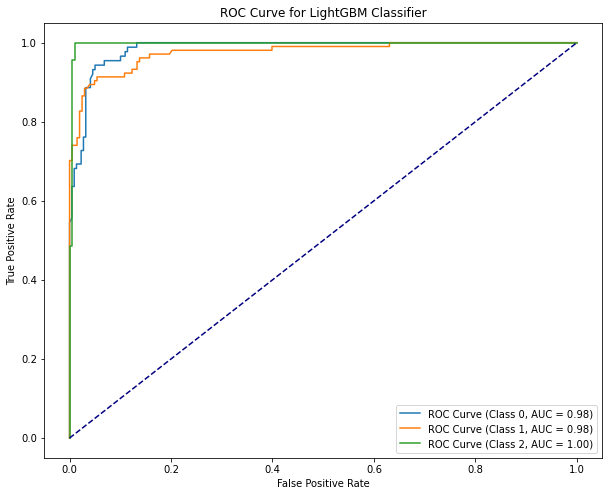

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1054
[LightGBM] [Info] Number of data points in the train set: 1073, number of used features: 6
[LightGBM] [Info] Start training from score -1.067417
[LightGBM] [Info] Start training from score -1.100478
[LightGBM] [Info] Start training from score -1.128889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ratio 30:70
Accuracy: 0.941304347826087
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92       142
           1       0.93      0.90      0.91       154
           2       0.97      1.00      0.98       164

    accuracy                           0.94       460
   macro avg       0.94      0.94      0.94       460
weighted a

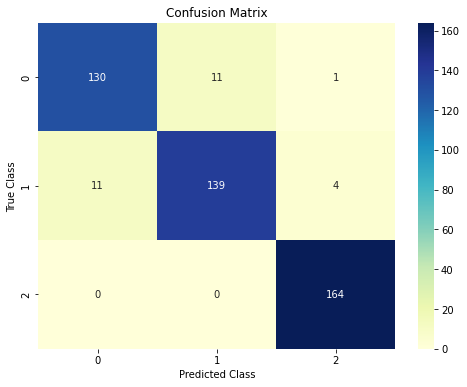

AUC Class 0: 0.99
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2096


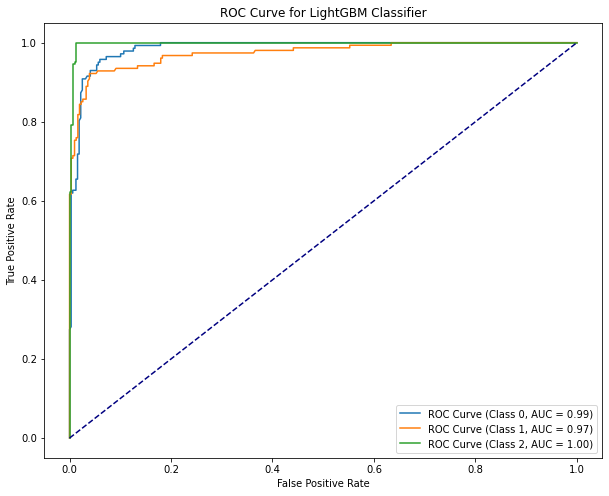

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1053
[LightGBM] [Info] Number of data points in the train set: 919, number of used features: 6
[LightGBM] [Info] Start training from score -1.083493
[LightGBM] [Info] Start training from score -1.093186
[LightGBM] [Info] Start training from score -1.119504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Ratio 40:60
Accuracy: 0.9267100977198697
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.88      0.90       200
           1       0.89      0.90      0.89       203
           2       0.98      1.00      0.99       211

    accuracy                           0.93

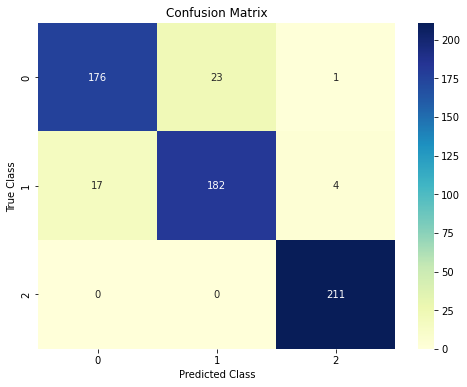

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2377


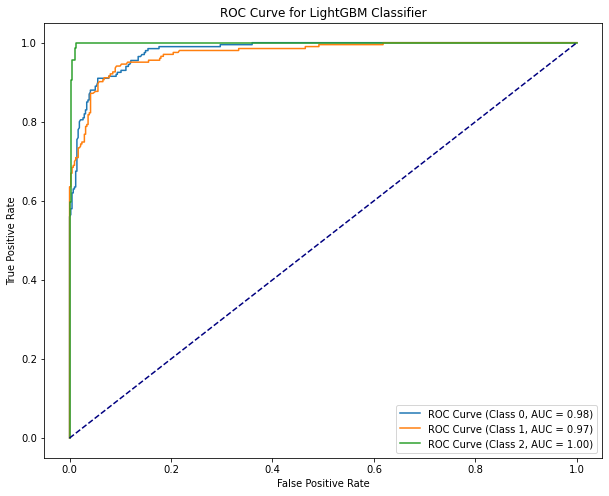

In [34]:
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model LightGBM
    lgbm_classifier = LGBMClassifier(random_state=42)

    # Melatih model
    lgbm_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = lgbm_classifier.predict(X_test)

    # Evaluasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    report = classification_report(y_test_encoded, y_pred)
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)

    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)
    print("Classification Report:\n", report)

    # Memvisualisasikan Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = lgbm_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i in range(lgbm_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i in range(lgbm_classifier.n_classes_):
        fpr, tpr, _ = roc_curve(label_binarize(y_test_encoded, classes=[i]),
                                y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for LightGBM Classifier')
    plt.legend()
    
    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


## CatBoosting SMOTE


Ratio 20:80
Accuracy: 0.9413680781758957
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91        88
           1       0.93      0.89      0.91       104
           2       0.98      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.94      0.94      0.94       307
weighted avg       0.94      0.94      0.94       307

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00


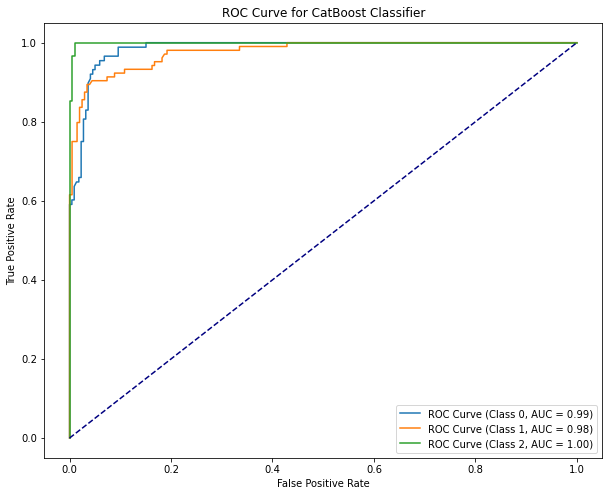

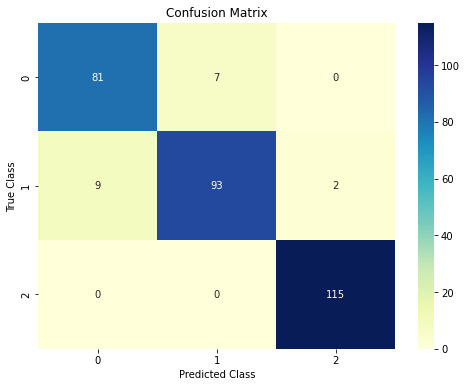

Log Loss: 0.1840

Ratio 30:70
Accuracy: 0.9326086956521739
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91       142
           1       0.92      0.88      0.90       154
           2       0.97      1.00      0.98       164

    accuracy                           0.93       460
   macro avg       0.93      0.93      0.93       460
weighted avg       0.93      0.93      0.93       460

AUC Class 0: 0.99
AUC Class 1: 0.97
AUC Class 2: 1.00


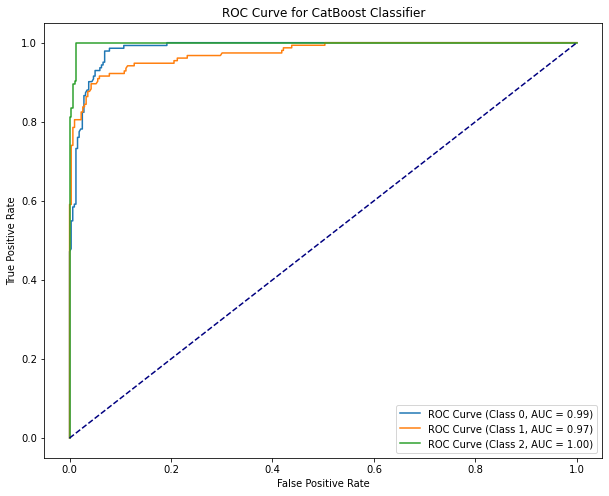

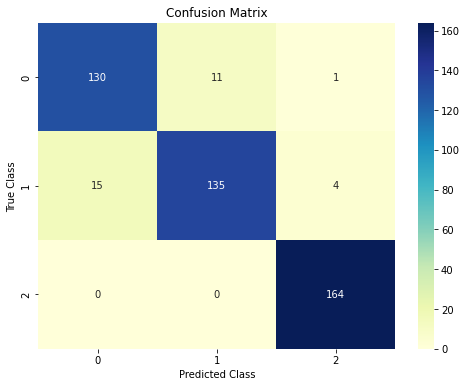

Log Loss: 0.1918

Ratio 40:60
Accuracy: 0.9185667752442996
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.88      0.88       200
           1       0.90      0.87      0.89       203
           2       0.96      1.00      0.98       211

    accuracy                           0.92       614
   macro avg       0.92      0.92      0.92       614
weighted avg       0.92      0.92      0.92       614

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 0.99


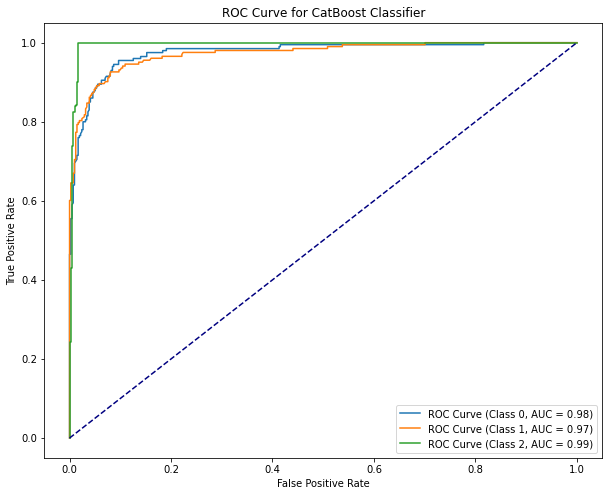

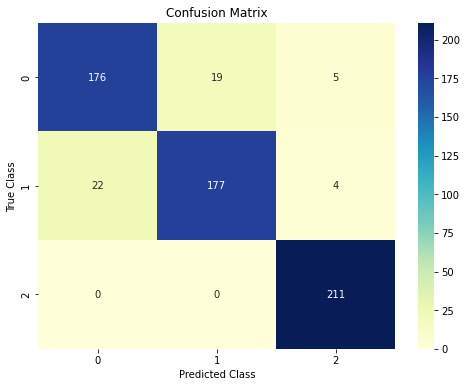

Log Loss: 0.2265


In [35]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of ratios
ratios = [0.2, 0.3, 0.4]

for ratio in ratios:
    # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=ratio, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    # Membuat model CatBoost
    catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)

    # Melatih model
    catboost_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = catboost_classifier.predict(X_test)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test_encoded, y_pred)
    print("Classification Report:\n", report)

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = catboost_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i, class_label in enumerate(catboost_classifier.classes_):
        fpr, tpr, _ = roc_curve((y_test_encoded == class_label).astype(int), y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {class_label}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i, class_label in enumerate(catboost_classifier.classes_):
        fpr, tpr, _ = roc_curve((y_test_encoded == class_label).astype(int), y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for CatBoost Classifier')
    plt.legend()

    # Menampilkan confusion matrix
    confusion_mat = confusion_matrix(y_test_encoded, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.show()

    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()



Ratio 20:80
Accuracy: 0.9413680781758957
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91        88
           1       0.93      0.89      0.91       104
           2       0.98      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.94      0.94      0.94       307
weighted avg       0.94      0.94      0.94       307

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1840


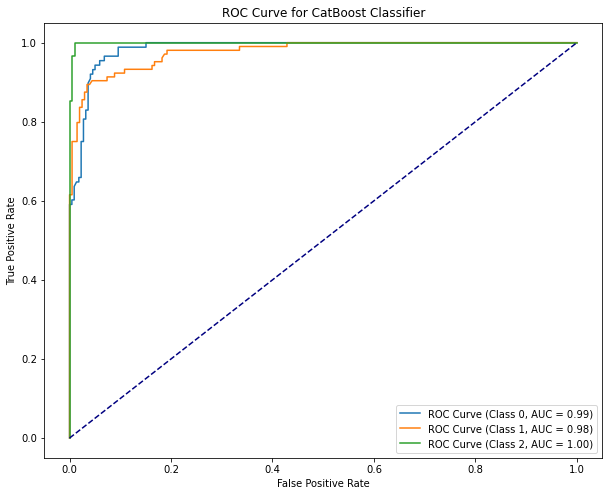

In [36]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# Splitting data
X = df.drop(["Category"], axis=1)
y = df["Category"]

# List of ratios
ratios = [0.2]

for ratio in ratios:
     # Pembagian data training dan testing
    X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=ratio, random_state=42)
    
    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)
    y_test_encoded = label_encoder.transform(y_test)

    
    # Membuat model CatBoost
    catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)

    # Melatih model
    catboost_classifier.fit(X_train, y_train_encoded)

    # Melakukan prediksi pada data testing
    y_pred = catboost_classifier.predict(X_test)

    # Mengukur akurasi model
    accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"\nRatio {ratio*100:.0f}:{(1-ratio)*100:.0f}")
    print("Accuracy:", accuracy)

    # Menampilkan classification report
    report = classification_report(y_test_encoded, y_pred)
    print("Classification Report:\n", report)

    # Menghitung probabilitas prediksi untuk setiap kelas
    y_probabilities = catboost_classifier.predict_proba(X_test)

    # Menghitung nilai AUC untuk setiap kelas
    auc_scores = []
    for i, class_label in enumerate(catboost_classifier.classes_):
        fpr, tpr, _ = roc_curve((y_test_encoded == class_label).astype(int), y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        print(f"AUC Class {class_label}: {roc_auc:.2f}")

    # Menampilkan kurva ROC untuk setiap kelas
    plt.figure(figsize=(10, 8))
    for i, class_label in enumerate(catboost_classifier.classes_):
        fpr, tpr, _ = roc_curve((y_test_encoded == class_label).astype(int), y_probabilities[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"ROC Curve (Class {class_label}, AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for CatBoost Classifier')
    plt.legend()

    # Menghitung log loss
    logloss = log_loss(y_test_encoded, y_probabilities)
    print(f'Log Loss: {logloss:.4f}')

    plt.show()


In [37]:
# import pickle
# # Menyimpan model ke dalam file pkl
# with open('catboost_model_no_outlier_no_Max.pkl', 'wb') as model_file:
#     pickle.dump(catboost_classifier, model_file)

In [38]:
# from catboost import CatBoostClassifier
# from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE
# from sklearn.preprocessing import LabelEncoder
# import pickle

# # Splitting data
# X = df.drop(["Category"], axis=1)
# y = df["Category"]

# # Melakukan oversampling dengan SMOTE
# smote = SMOTE(random_state=42)
# X_resampled, y_resampled = smote.fit_resample(X, y)

# # Pembagian data training dan testing pada data yang telah di-resample
# X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# # Encoding string labels to integer labels
# label_encoder = LabelEncoder()
# y_train_encoded = label_encoder.fit_transform(y_train)
# y_test_encoded = label_encoder.transform(y_test)

# # Membuat model CatBoost
# catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)

# # Melatih model pada data yang telah di-resample
# catboost_classifier.fit(X_train, y_train_encoded)

# # Menyimpan model ke dalam file pkl
# with open('catboost_model_with_smote.pkl', 'wb') as model_file:
#     pickle.dump(catboost_classifier, model_file)

# # Menyimpan objek LabelEncoder
# with open('label_encoder.pkl', 'wb') as label_encoder_file:
#     pickle.dump(label_encoder, label_encoder_file)


# Implementasi SMOTE pada Model Boosting dengan Kfold 5, 10

## XGBOOST FOLD 5 dan 10 SMOTE

KFold=5

Accuracy: 0.9381107491856677
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91        88
           1       0.93      0.88      0.91       104
           2       0.98      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.93      0.94      0.93       307
weighted avg       0.94      0.94      0.94       307



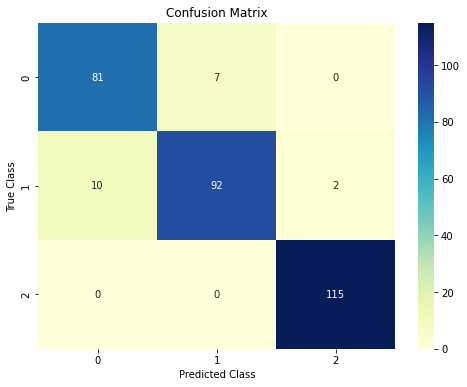

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2041


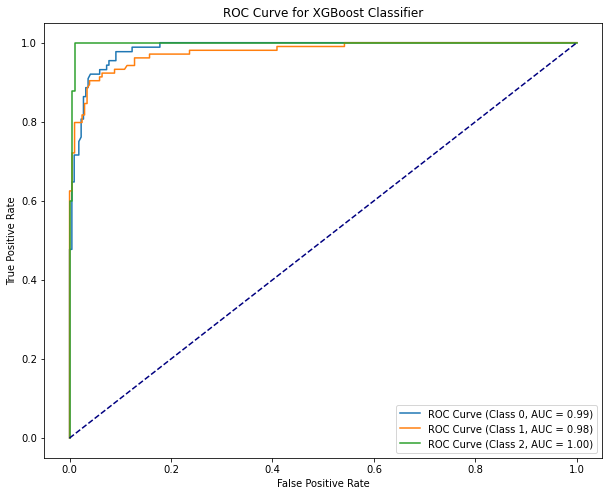


Accuracy: 0.9087947882736156
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.82      0.88       112
           1       0.84      0.92      0.88        99
           2       0.95      1.00      0.97        96

    accuracy                           0.91       307
   macro avg       0.91      0.91      0.91       307
weighted avg       0.91      0.91      0.91       307



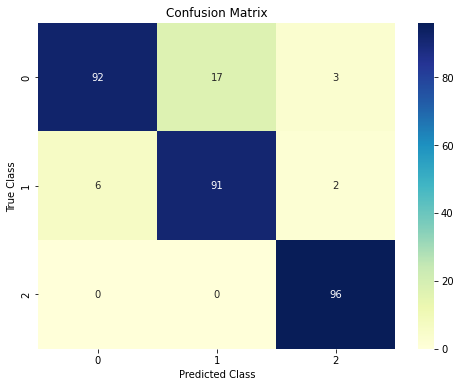

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2445


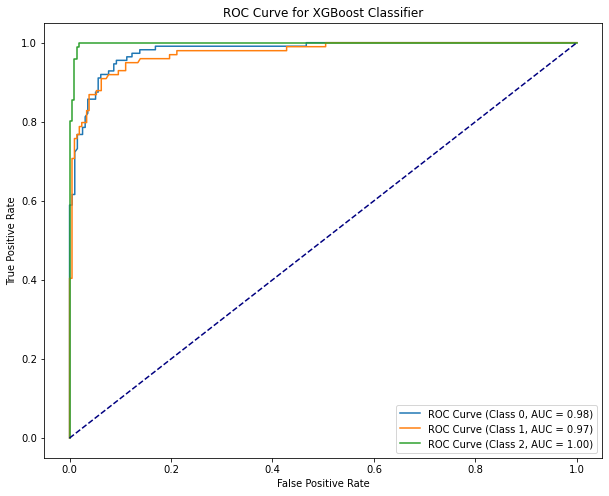


Accuracy: 0.9218241042345277
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.93      0.91        98
           1       0.94      0.85      0.89       115
           2       0.94      1.00      0.97        94

    accuracy                           0.92       307
   macro avg       0.92      0.93      0.92       307
weighted avg       0.92      0.92      0.92       307



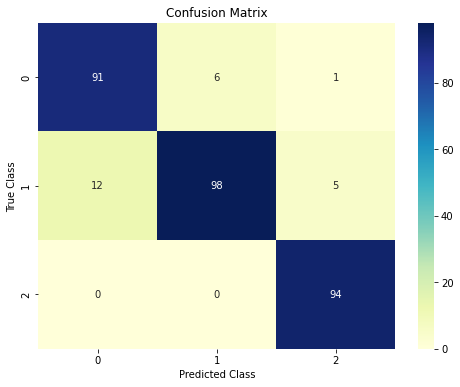

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2208


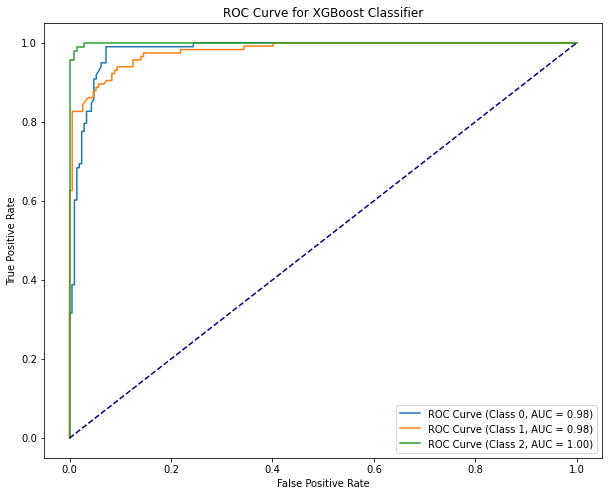


Accuracy: 0.9052287581699346
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.87      0.88       113
           1       0.88      0.87      0.87       104
           2       0.94      1.00      0.97        89

    accuracy                           0.91       306
   macro avg       0.91      0.91      0.91       306
weighted avg       0.90      0.91      0.90       306



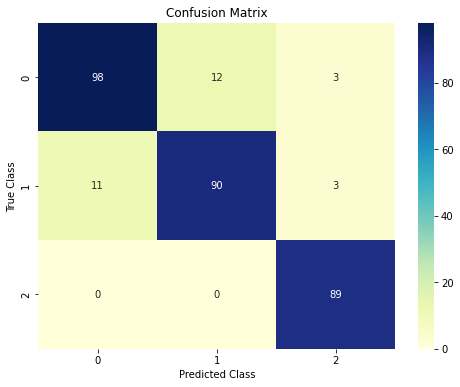

AUC Class 0: 0.97
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2947


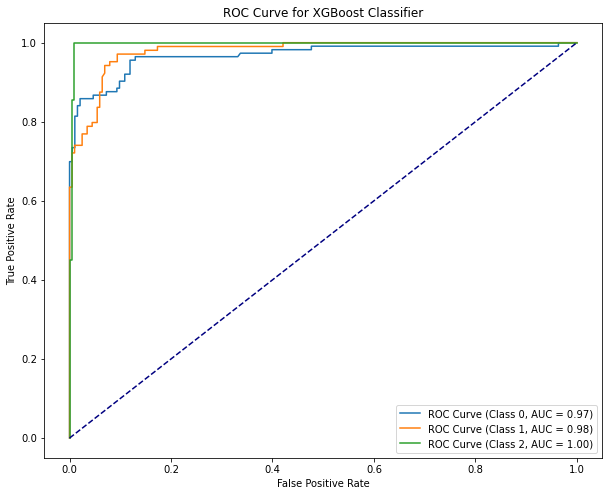


Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.89      0.90       100
           1       0.89      0.90      0.89        89
           2       0.98      1.00      0.99       117

    accuracy                           0.93       306
   macro avg       0.93      0.93      0.93       306
weighted avg       0.93      0.93      0.93       306



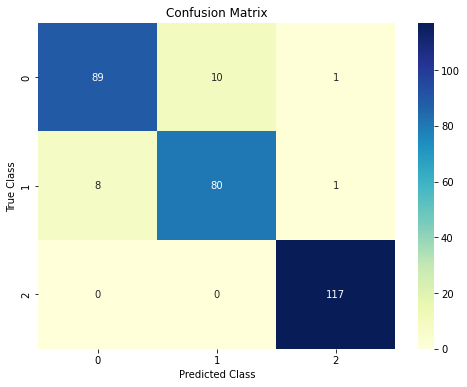

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1944


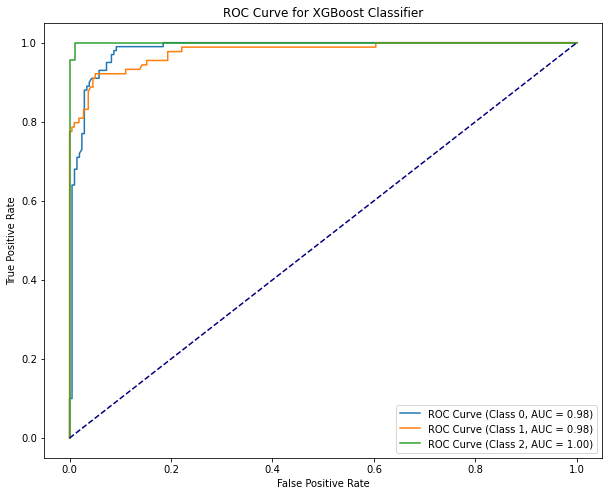


Average Accuracy for 5-fold: 0.9217197845479126
Average AUC for 5-fold: 0.9849407657800082
Average Log Loss for 5-fold: 0.23170434876489915
--------------------------------------------------


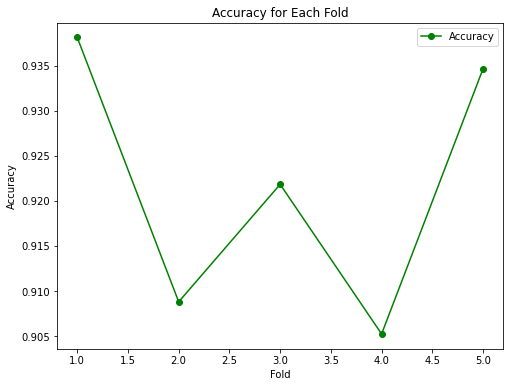

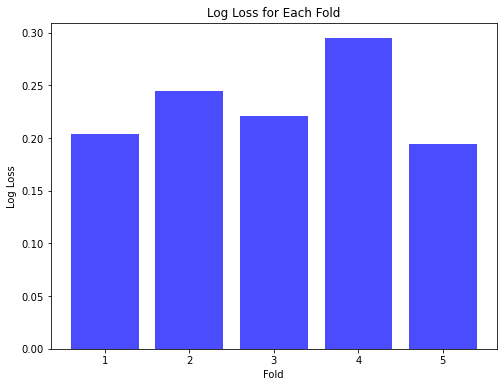


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.938111  0.986477  0.204117
1     2  0.908795  0.983727  0.244525
2     3  0.921824  0.986662  0.220808
3     4  0.905229  0.981295  0.294675
4     5  0.934641  0.986542  0.194397
--------------------------------------------------
KFold=10

Accuracy: 0.948051948051948
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.90      0.92        42
           1       0.93      0.93      0.93        55
           2       0.98      1.00      0.99        57

    accuracy                           0.95       154
   macro avg       0.95      0.94      0.94       154
weighted avg       0.95      0.95      0.95       154



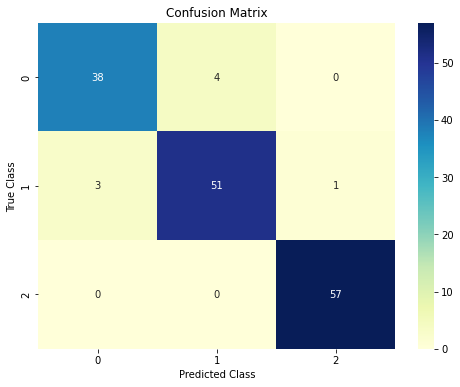

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1422


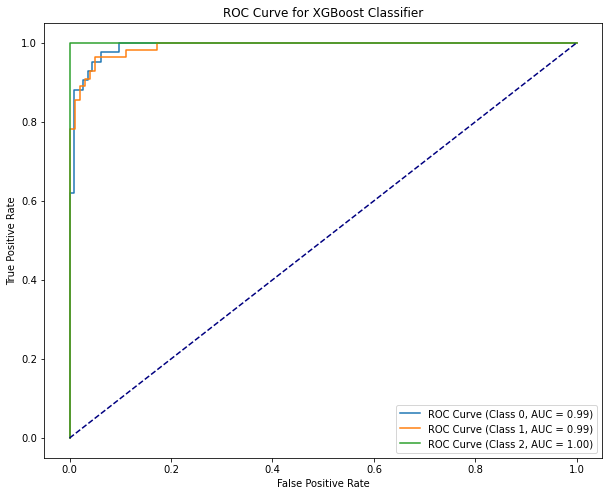


Accuracy: 0.922077922077922
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.89      0.88        47
           1       0.89      0.86      0.88        49
           2       0.98      1.00      0.99        58

    accuracy                           0.92       154
   macro avg       0.92      0.92      0.92       154
weighted avg       0.92      0.92      0.92       154



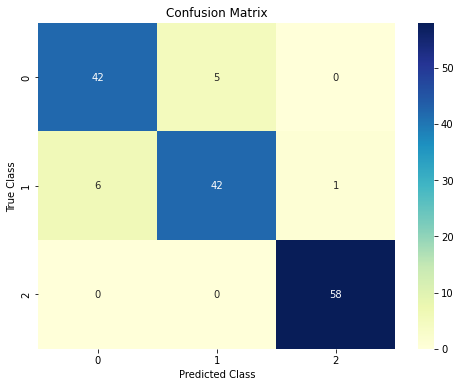

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2544


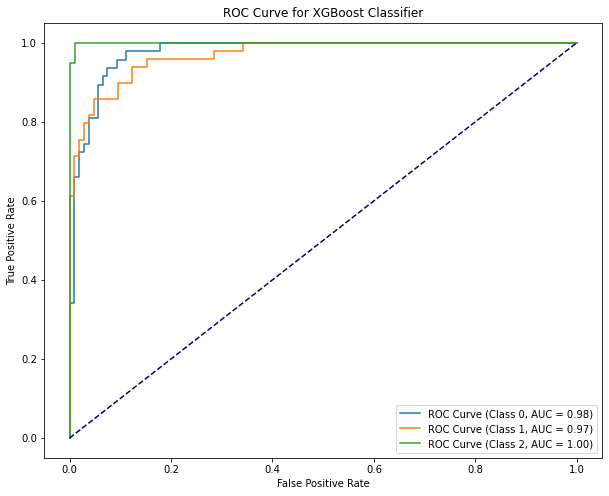


Accuracy: 0.935064935064935
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.87      0.92        54
           1       0.89      0.94      0.91        51
           2       0.94      1.00      0.97        49

    accuracy                           0.94       154
   macro avg       0.94      0.94      0.94       154
weighted avg       0.94      0.94      0.93       154



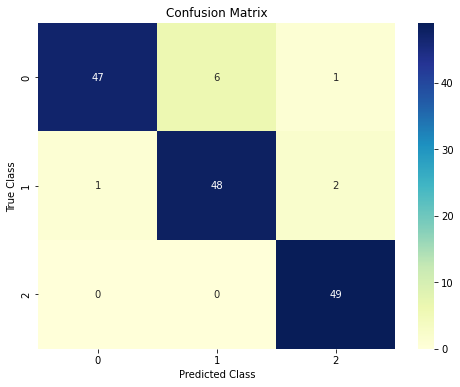

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1874


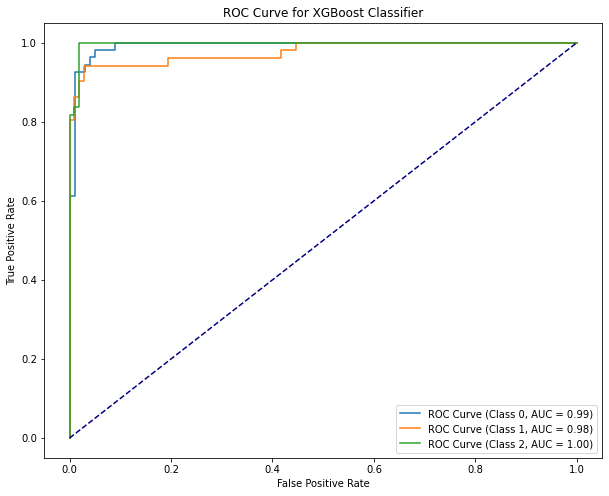


Accuracy: 0.9150326797385621
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.82      0.88        57
           1       0.85      0.94      0.89        49
           2       0.96      1.00      0.98        47

    accuracy                           0.92       153
   macro avg       0.92      0.92      0.92       153
weighted avg       0.92      0.92      0.91       153



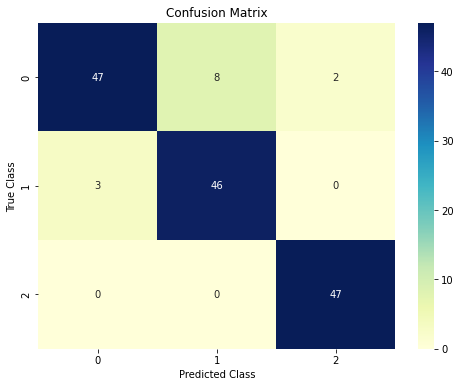

AUC Class 0: 0.97
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2576


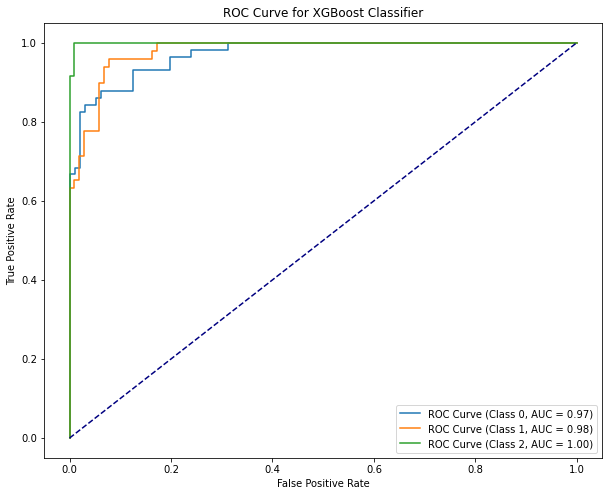


Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94        47
           1       0.96      0.89      0.92        62
           2       0.90      1.00      0.95        44

    accuracy                           0.93       153
   macro avg       0.93      0.94      0.94       153
weighted avg       0.94      0.93      0.93       153



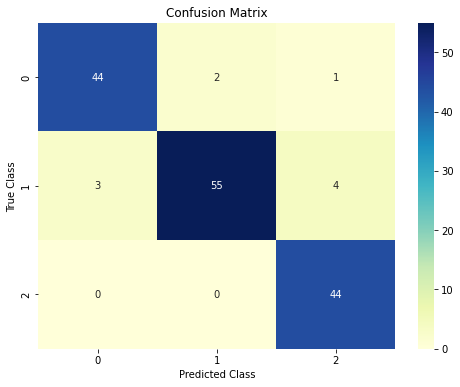

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1817


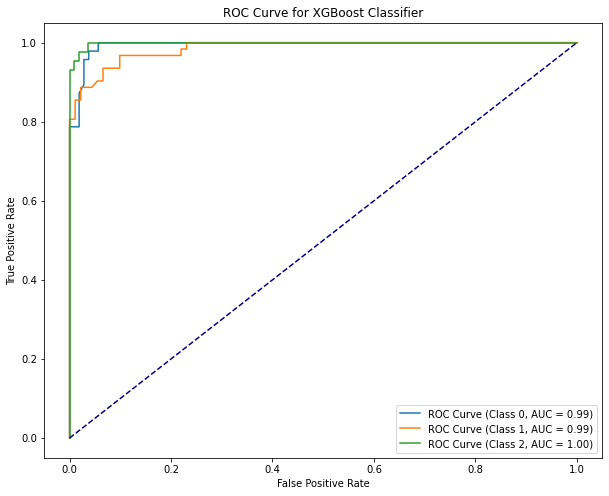


Accuracy: 0.9215686274509803
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.92      0.89        51
           1       0.92      0.85      0.88        52
           2       1.00      1.00      1.00        50

    accuracy                           0.92       153
   macro avg       0.92      0.92      0.92       153
weighted avg       0.92      0.92      0.92       153



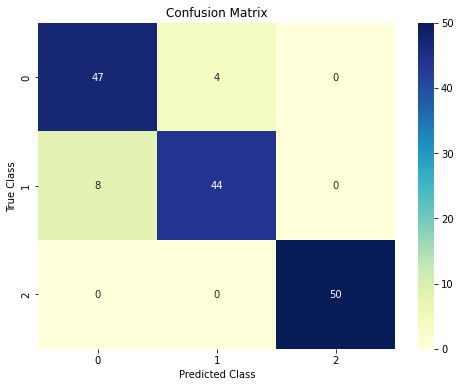

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2543


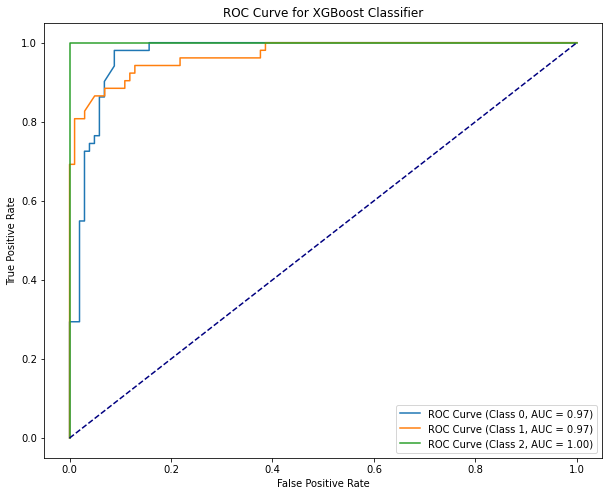


Accuracy: 0.8823529411764706
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.83      0.86        64
           1       0.84      0.87      0.85        53
           2       0.92      1.00      0.96        36

    accuracy                           0.88       153
   macro avg       0.89      0.90      0.89       153
weighted avg       0.88      0.88      0.88       153



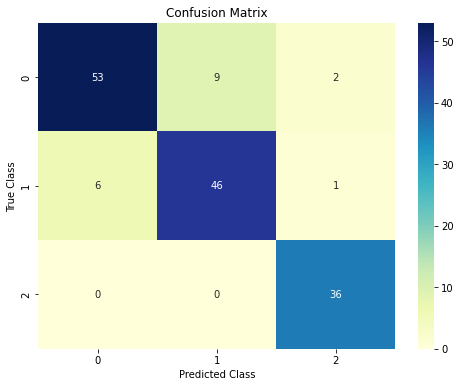

AUC Class 0: 0.96
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.3753


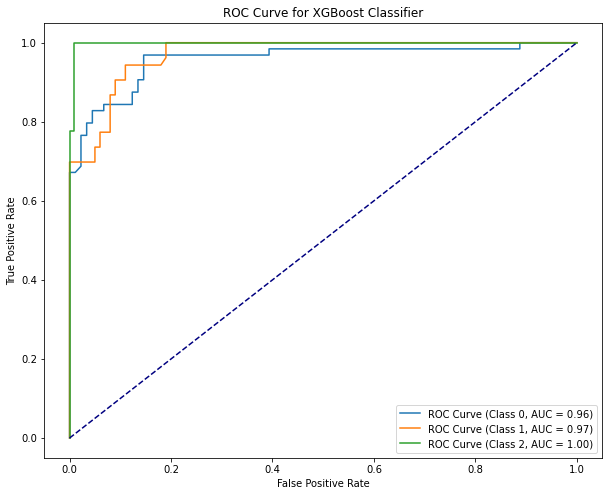


Accuracy: 0.9411764705882353
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92        49
           1       0.94      0.88      0.91        51
           2       0.98      1.00      0.99        53

    accuracy                           0.94       153
   macro avg       0.94      0.94      0.94       153
weighted avg       0.94      0.94      0.94       153



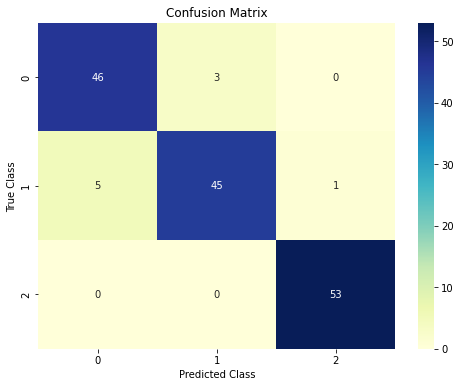

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1757


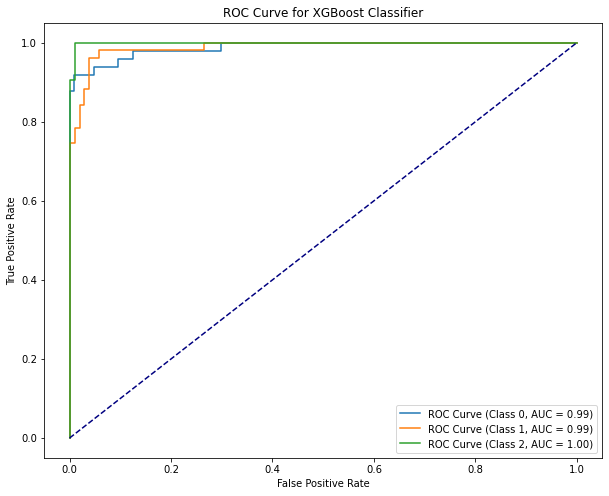


Accuracy: 0.9411764705882353
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.96      0.93        47
           1       0.94      0.82      0.88        39
           2       0.97      1.00      0.99        67

    accuracy                           0.94       153
   macro avg       0.94      0.93      0.93       153
weighted avg       0.94      0.94      0.94       153



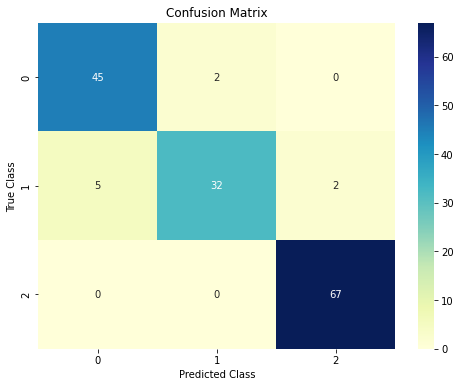

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2105


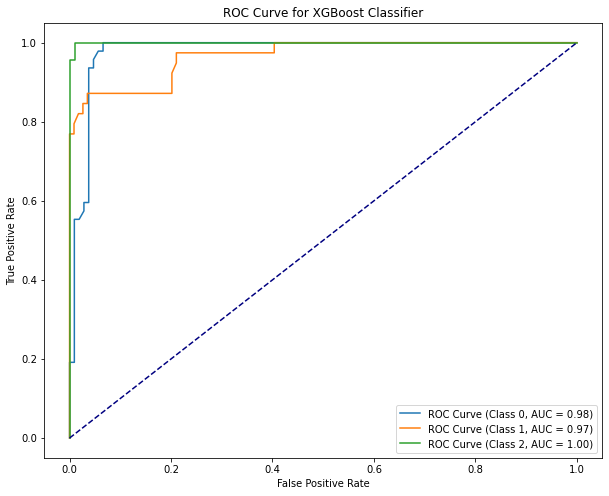


Accuracy: 0.9477124183006536
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92        53
           1       0.94      0.92      0.93        50
           2       0.98      1.00      0.99        50

    accuracy                           0.95       153
   macro avg       0.95      0.95      0.95       153
weighted avg       0.95      0.95      0.95       153



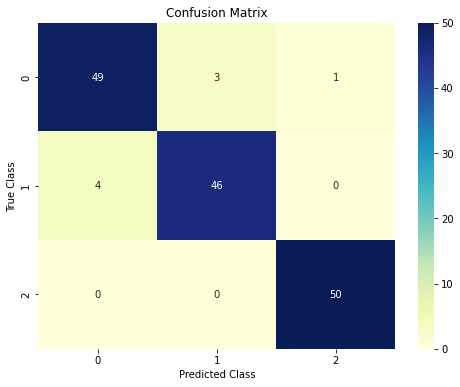

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1650


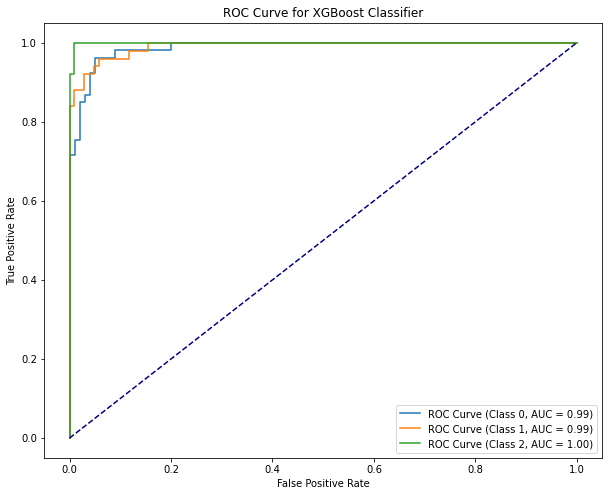


Average Accuracy for 10-fold: 0.928885493591376
Average AUC for 10-fold: 0.9861229441176775
Average Log Loss for 10-fold: 0.22039766717822187
--------------------------------------------------


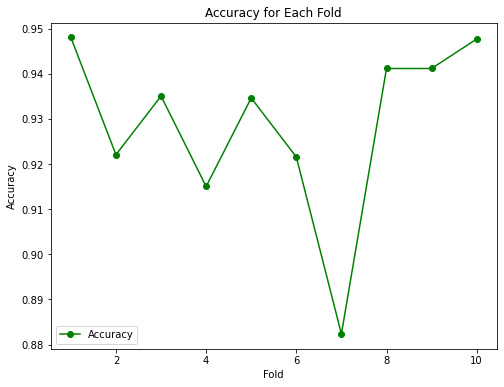

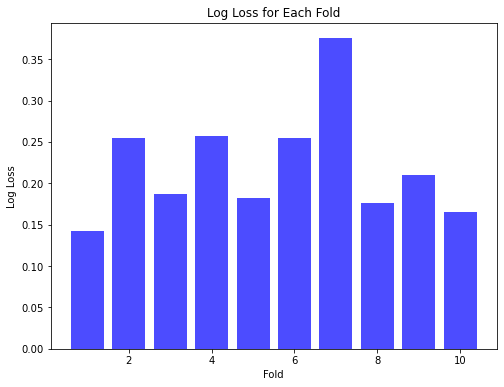


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.948052  0.993850  0.142173
1     2  0.922078  0.981960  0.254373
2     3  0.935065  0.988811  0.187379
3     4  0.915033  0.982978  0.257606
4     5  0.934641  0.992666  0.181657
5     6  0.921569  0.979912  0.254313
6     7  0.882353  0.975149  0.375310
7     8  0.941176  0.991659  0.175684
8     9  0.941176  0.981697  0.210501
9    10  0.947712  0.992548  0.164982
--------------------------------------------------


In [39]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")
    kfold_cv = KFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_resampled)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for train_index, val_index in kfold_cv.split(X_resampled):
        X_train_kfold, X_val_kfold = X_resampled.iloc[train_index], X_resampled.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Membuat model XGBoost
        xgb_classifier = XGBClassifier(random_state=42)

        # Melatih model
        xgb_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = xgb_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = xgb_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i in range(xgb_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i in range(xgb_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for XGBoost Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")
    
    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()
    
    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## AdaBoost FOLD 5 dan 10 SMOTE

KFold=5

Accuracy: 0.6970684039087948
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.69      0.58        88
           1       0.58      0.38      0.46       104
           2       0.97      0.99      0.98       115

    accuracy                           0.70       307
   macro avg       0.68      0.69      0.67       307
weighted avg       0.70      0.70      0.69       307



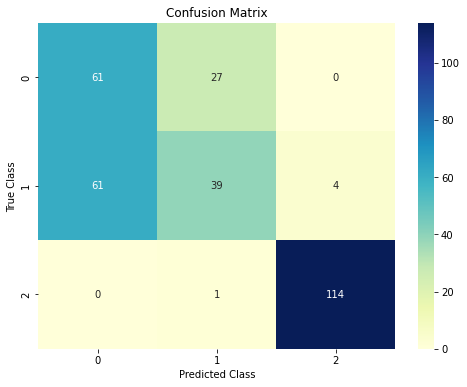

AUC Class 0: 0.74
AUC Class 1: 0.72
AUC Class 2: 0.99
Log Loss: 0.8703


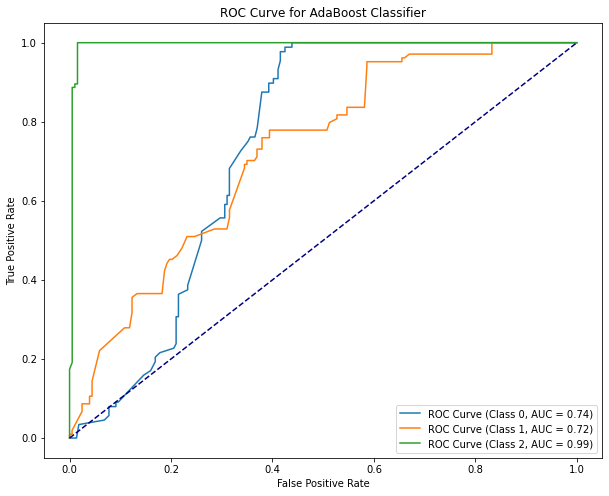


Accuracy: 0.6091205211726385
Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.71      0.58       112
           1       0.33      0.15      0.21        99
           2       0.94      0.96      0.95        96

    accuracy                           0.61       307
   macro avg       0.59      0.61      0.58       307
weighted avg       0.58      0.61      0.58       307



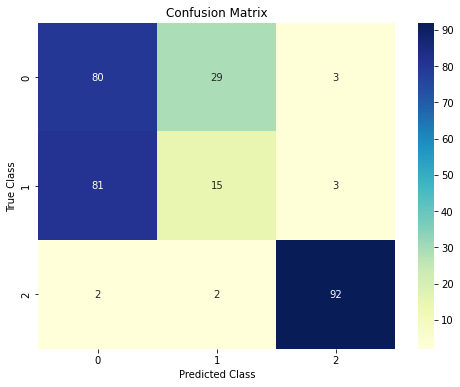

AUC Class 0: 0.69
AUC Class 1: 0.63
AUC Class 2: 0.99
Log Loss: 0.8690


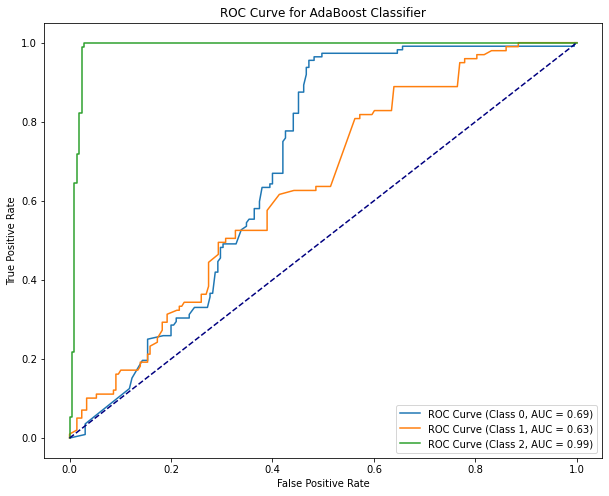


Accuracy: 0.6221498371335505
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.73      0.57        98
           1       0.52      0.22      0.31       115
           2       0.90      1.00      0.95        94

    accuracy                           0.62       307
   macro avg       0.63      0.65      0.61       307
weighted avg       0.62      0.62      0.59       307



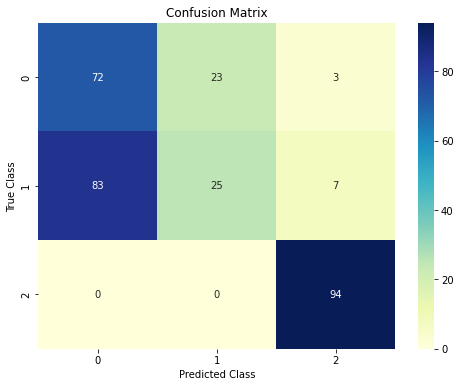

AUC Class 0: 0.69
AUC Class 1: 0.76
AUC Class 2: 0.99
Log Loss: 0.8582


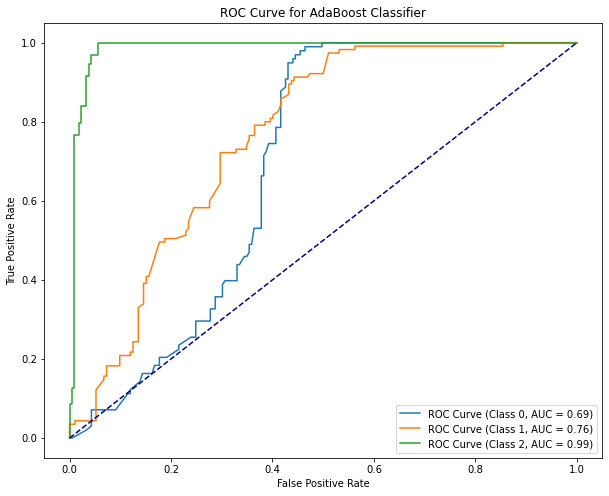


Accuracy: 0.6111111111111112
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.71      0.60       113
           1       0.42      0.26      0.32       104
           2       0.90      0.90      0.90        89

    accuracy                           0.61       306
   macro avg       0.61      0.62      0.61       306
weighted avg       0.60      0.61      0.59       306



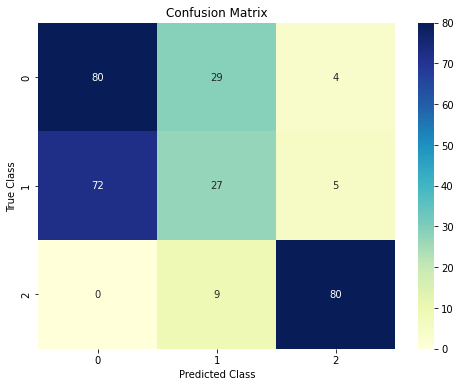

AUC Class 0: 0.69
AUC Class 1: 0.58
AUC Class 2: 0.98
Log Loss: 0.8146


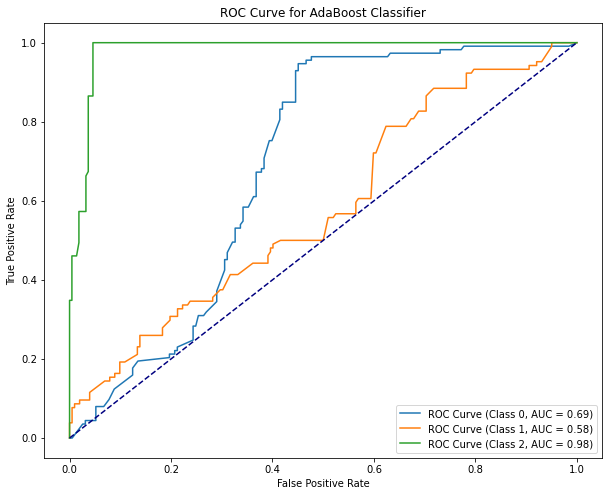


Accuracy: 0.6895424836601307
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.72      0.61       100
           1       0.49      0.27      0.35        89
           2       0.95      0.98      0.97       117

    accuracy                           0.69       306
   macro avg       0.66      0.66      0.64       306
weighted avg       0.68      0.69      0.67       306



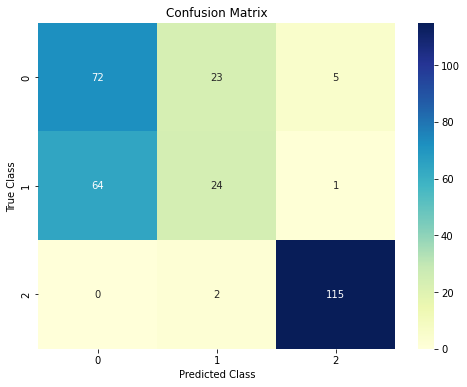

AUC Class 0: 0.76
AUC Class 1: 0.77
AUC Class 2: 0.99
Log Loss: 0.8216


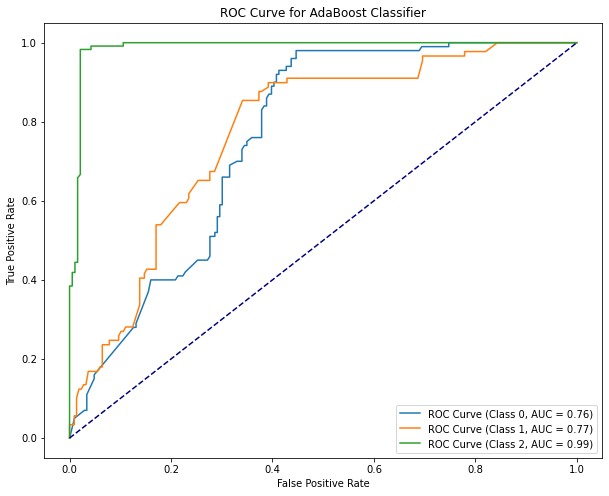


Average Accuracy for 5-fold: 0.6457984713972452
Average AUC for 5-fold: 0.7989454606552663
Average Log Loss for 5-fold: 0.8467400597621044
--------------------------------------------------


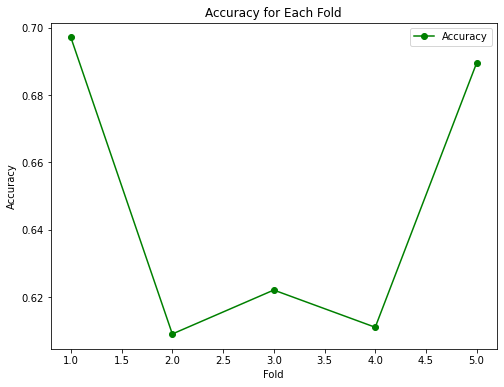

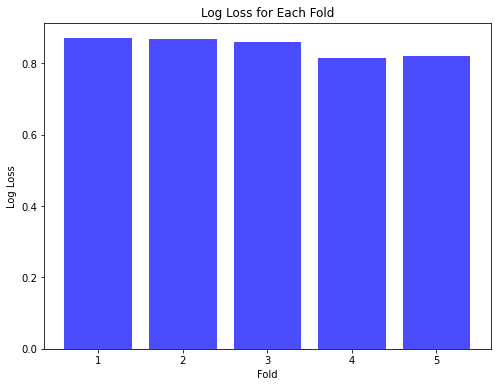


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.697068  0.818572  0.870305
1     2  0.609121  0.770736  0.868994
2     3  0.622150  0.814030  0.858223
3     4  0.611111  0.750881  0.814600
4     5  0.689542  0.840509  0.821578
--------------------------------------------------
KFold=10

Accuracy: 0.7207792207792207
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.88      0.64        42
           1       0.77      0.31      0.44        55
           2       0.98      1.00      0.99        57

    accuracy                           0.72       154
   macro avg       0.75      0.73      0.69       154
weighted avg       0.78      0.72      0.70       154



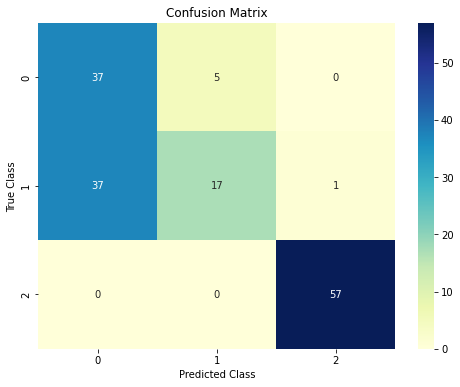

AUC Class 0: 0.71
AUC Class 1: 0.75
AUC Class 2: 1.00
Log Loss: 0.8738


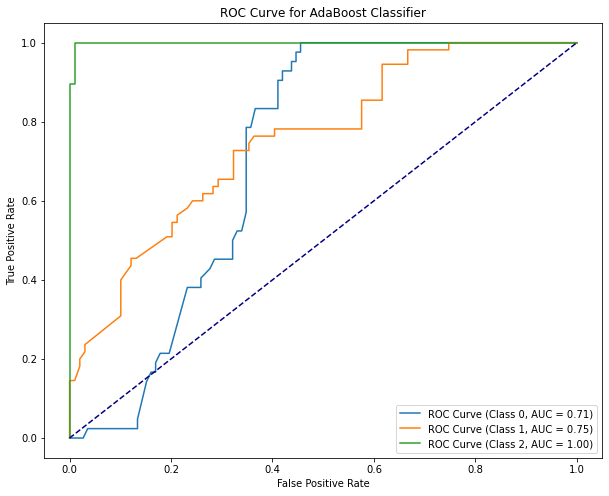


Accuracy: 0.6038961038961039
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.53      0.46        47
           1       0.34      0.22      0.27        49
           2       0.93      0.98      0.96        58

    accuracy                           0.60       154
   macro avg       0.56      0.58      0.56       154
weighted avg       0.59      0.60      0.59       154



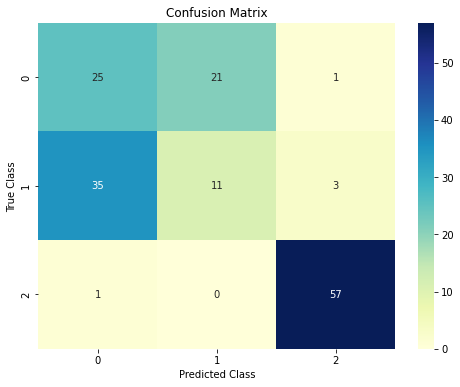

AUC Class 0: 0.71
AUC Class 1: 0.74
AUC Class 2: 0.99
Log Loss: 0.8757


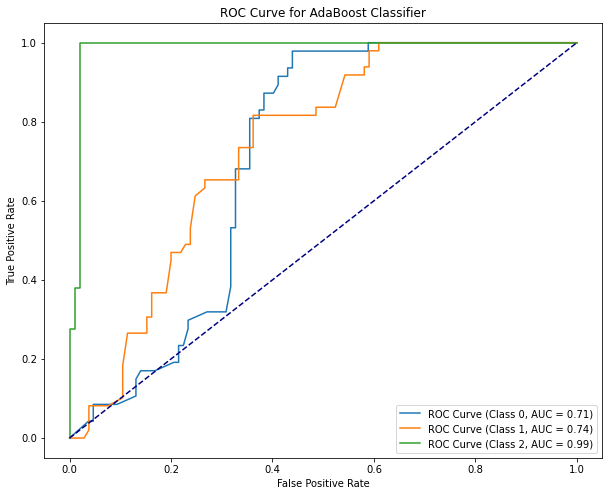


Accuracy: 0.6688311688311688
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.56      0.55        54
           1       0.51      0.47      0.49        51
           2       0.94      1.00      0.97        49

    accuracy                           0.67       154
   macro avg       0.67      0.68      0.67       154
weighted avg       0.66      0.67      0.66       154



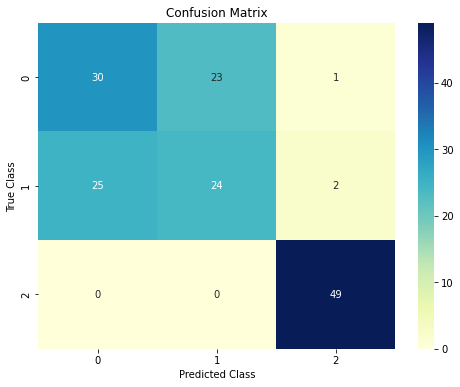

AUC Class 0: 0.72
AUC Class 1: 0.72
AUC Class 2: 1.00
Log Loss: 0.8605


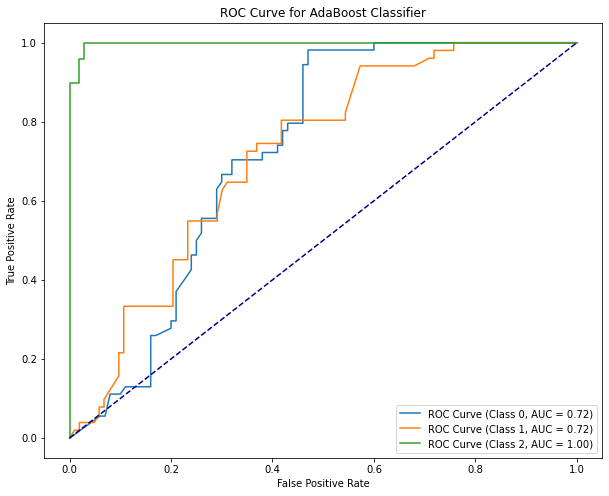


Accuracy: 0.6143790849673203
Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.72      0.58        57
           1       0.32      0.14      0.20        49
           2       0.98      0.98      0.98        47

    accuracy                           0.61       153
   macro avg       0.60      0.61      0.59       153
weighted avg       0.58      0.61      0.58       153



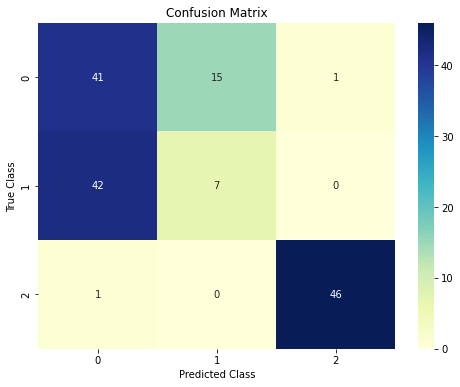

AUC Class 0: 0.64
AUC Class 1: 0.68
AUC Class 2: 0.99
Log Loss: 0.8764


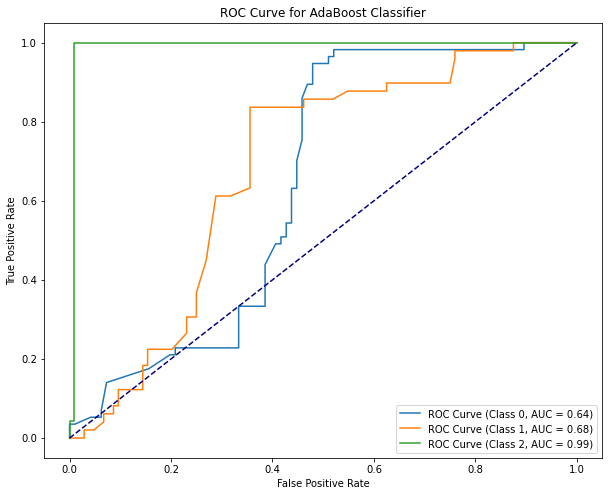


Accuracy: 0.7124183006535948
Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.64      0.59        47
           1       0.70      0.56      0.62        62
           2       0.90      1.00      0.95        44

    accuracy                           0.71       153
   macro avg       0.72      0.73      0.72       153
weighted avg       0.71      0.71      0.71       153



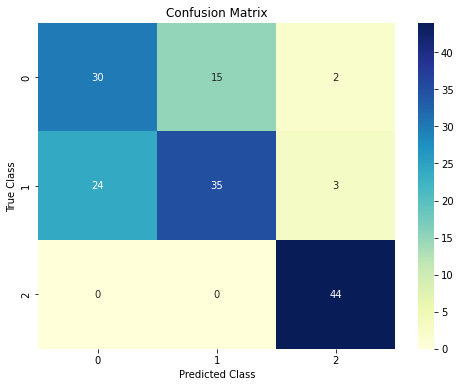

AUC Class 0: 0.69
AUC Class 1: 0.78
AUC Class 2: 0.98
Log Loss: 0.8709


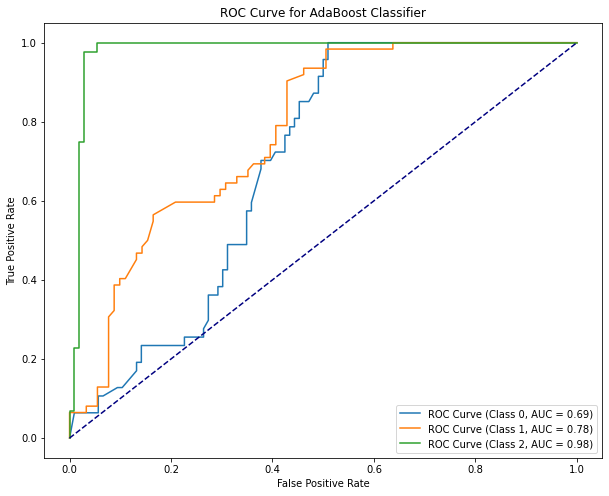


Accuracy: 0.6928104575163399
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.82      0.66        51
           1       0.62      0.29      0.39        52
           2       0.94      0.98      0.96        50

    accuracy                           0.69       153
   macro avg       0.70      0.70      0.67       153
weighted avg       0.70      0.69      0.67       153



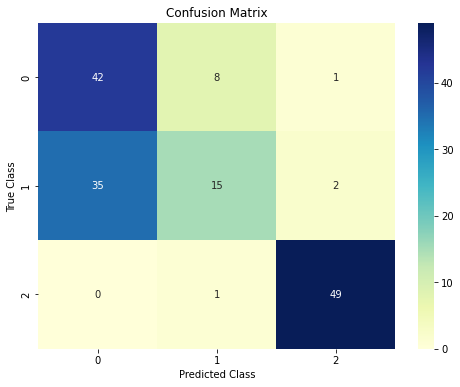

AUC Class 0: 0.71
AUC Class 1: 0.70
AUC Class 2: 1.00
Log Loss: 0.8623


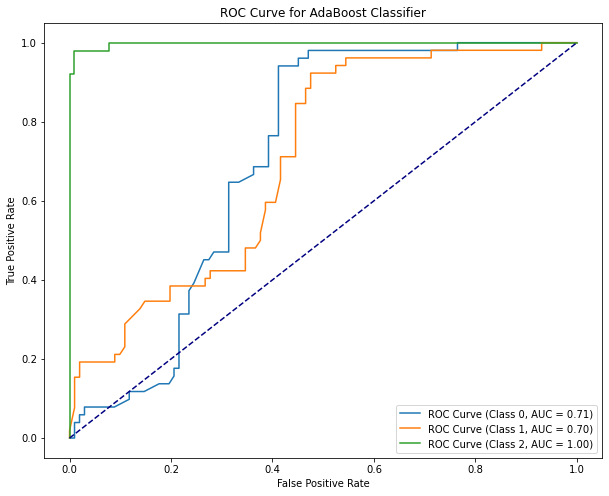


Accuracy: 0.6601307189542484
Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.91      0.72        64
           1       0.64      0.17      0.27        53
           2       0.83      0.94      0.88        36

    accuracy                           0.66       153
   macro avg       0.69      0.67      0.62       153
weighted avg       0.67      0.66      0.60       153



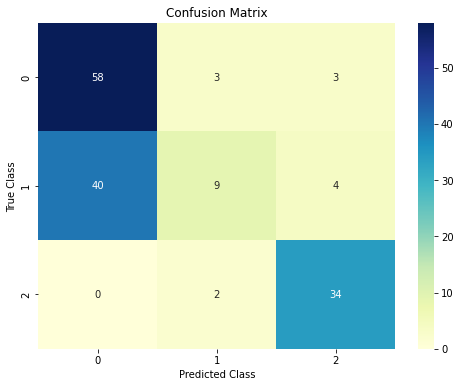

AUC Class 0: 0.65
AUC Class 1: 0.44
AUC Class 2: 0.98
Log Loss: 0.8181


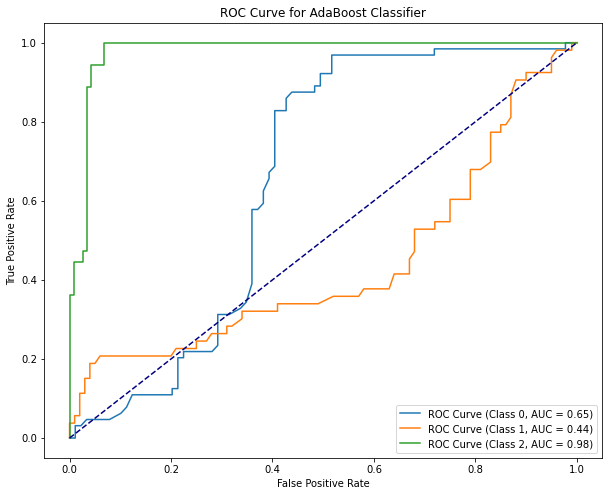


Accuracy: 0.6993464052287581
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.67      0.59        49
           1       0.57      0.41      0.48        51
           2       0.98      1.00      0.99        53

    accuracy                           0.70       153
   macro avg       0.69      0.70      0.69       153
weighted avg       0.70      0.70      0.69       153



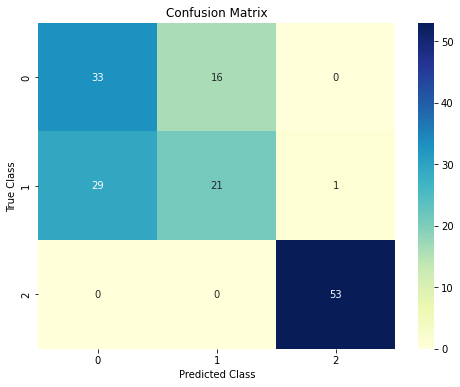

AUC Class 0: 0.69
AUC Class 1: 0.79
AUC Class 2: 1.00
Log Loss: 0.8939


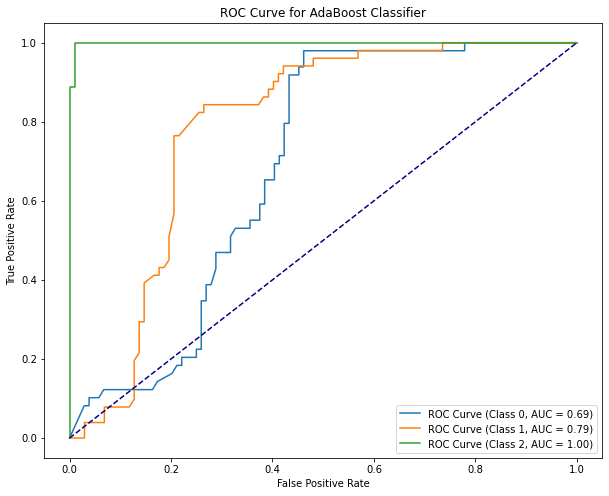


Accuracy: 0.7058823529411765
Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.62      0.59        47
           1       0.44      0.36      0.39        39
           2       0.94      0.97      0.96        67

    accuracy                           0.71       153
   macro avg       0.65      0.65      0.65       153
weighted avg       0.70      0.71      0.70       153



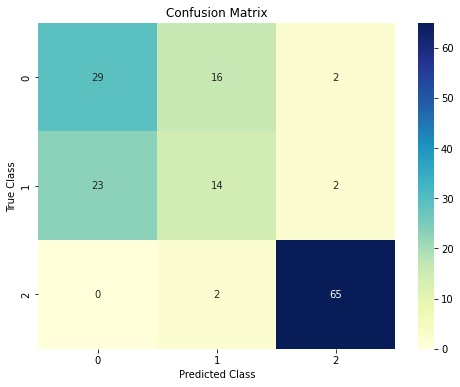

AUC Class 0: 0.74
AUC Class 1: 0.79
AUC Class 2: 0.98
Log Loss: 0.8703


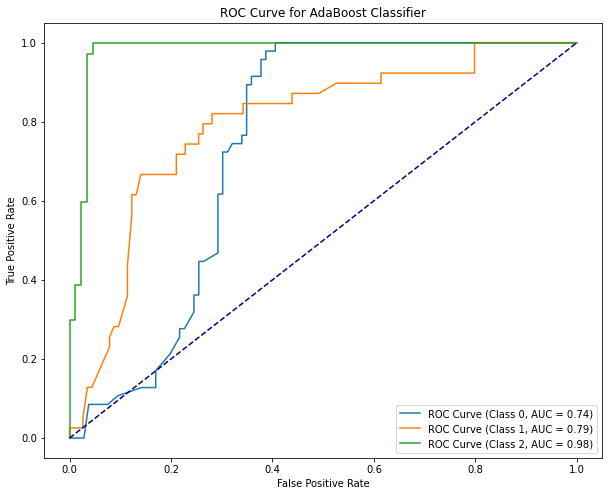


Accuracy: 0.6405228758169934
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.72      0.59        53
           1       0.44      0.22      0.29        50
           2       0.94      0.98      0.96        50

    accuracy                           0.64       153
   macro avg       0.63      0.64      0.61       153
weighted avg       0.62      0.64      0.61       153



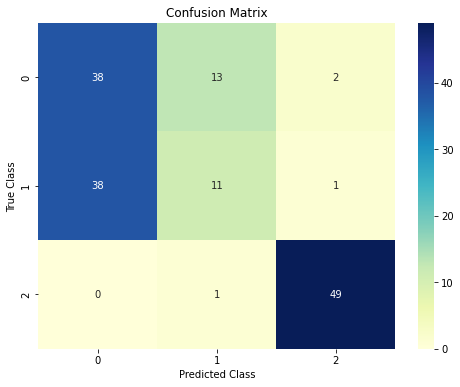

AUC Class 0: 0.73
AUC Class 1: 0.75
AUC Class 2: 0.98
Log Loss: 0.8723


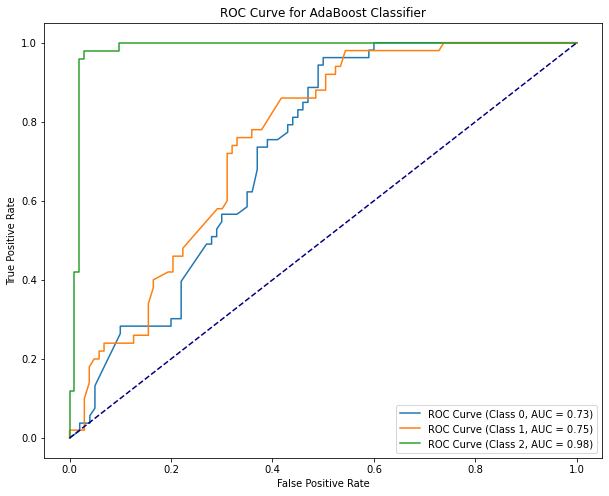


Average Accuracy for 10-fold: 0.6718996689584925
Average AUC for 10-fold: 0.8014112363471861
Average Log Loss for 10-fold: 0.8674116498508768
--------------------------------------------------


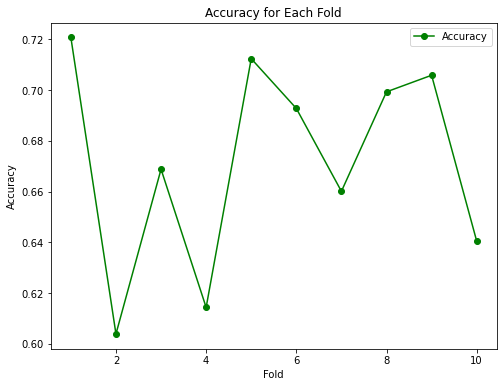

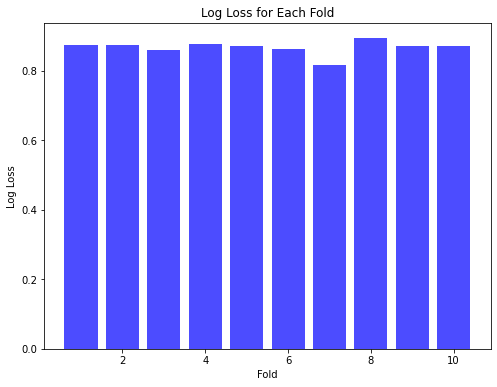


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.720779  0.822253  0.873758
1     2  0.603896  0.811290  0.875661
2     3  0.668831  0.813708  0.860453
3     4  0.614379  0.772821  0.876403
4     5  0.712418  0.817815  0.870927
5     6  0.692810  0.803137  0.862275
6     7  0.660131  0.689568  0.818090
7     8  0.699346  0.824169  0.893928
8     9  0.705882  0.838375  0.870320
9    10  0.640523  0.820976  0.872302
--------------------------------------------------


In [40]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")
    kfold_cv = KFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_resampled)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []  # Initialize fold_log_losses inside the loop

    for train_index, val_index in kfold_cv.split(X_resampled):
        X_train_kfold, X_val_kfold = X_resampled.iloc[train_index], X_resampled.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Membuat model AdaBoost dengan Decision Tree Classifier sebagai base estimator
        ada_classifier = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1), random_state=42)

        # Melatih model
        ada_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = ada_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = ada_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i in range(ada_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i in range(ada_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for AdaBoost Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")

    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()

    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## GradientBoostingClasifire FOLD 5 dan 10 SMOTE

KFold=5

Accuracy: 0.8208469055374593
Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.76      0.74        88
           1       0.77      0.67      0.72       104
           2       0.93      1.00      0.96       115

    accuracy                           0.82       307
   macro avg       0.81      0.81      0.81       307
weighted avg       0.82      0.82      0.82       307

AUC Class 0: 0.91
AUC Class 1: 0.88
AUC Class 2: 0.99
Log Loss: 0.4660


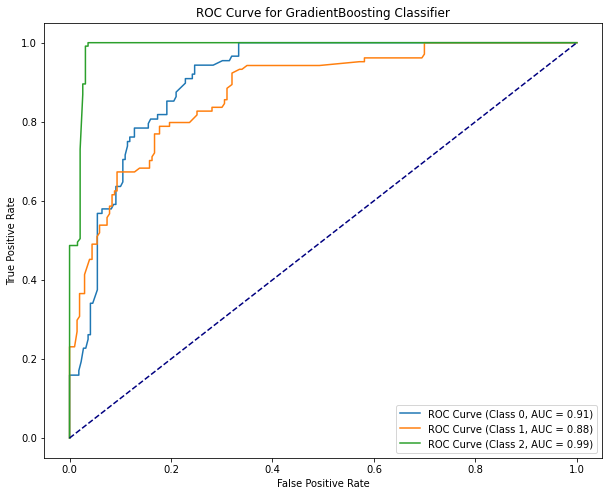


Accuracy: 0.8045602605863192
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.68      0.73       112
           1       0.69      0.76      0.72        99
           2       0.95      1.00      0.97        96

    accuracy                           0.80       307
   macro avg       0.81      0.81      0.81       307
weighted avg       0.80      0.80      0.80       307

AUC Class 0: 0.88
AUC Class 1: 0.88
AUC Class 2: 1.00
Log Loss: 0.4835


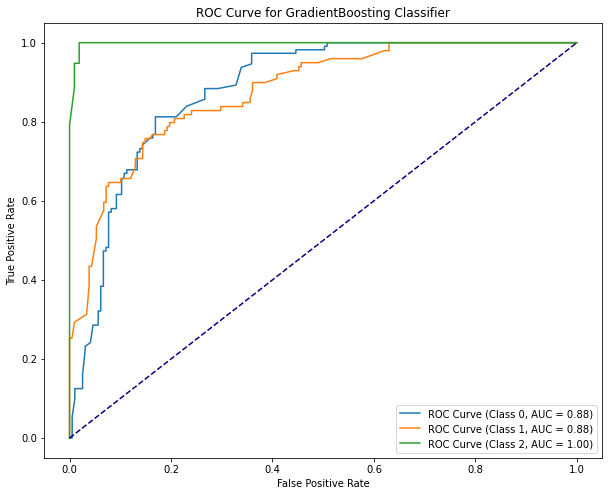


Accuracy: 0.752442996742671
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.65      0.68        98
           1       0.70      0.63      0.67       115
           2       0.84      1.00      0.91        94

    accuracy                           0.75       307
   macro avg       0.75      0.76      0.75       307
weighted avg       0.74      0.75      0.75       307

AUC Class 0: 0.88
AUC Class 1: 0.84
AUC Class 2: 0.98
Log Loss: 0.5485


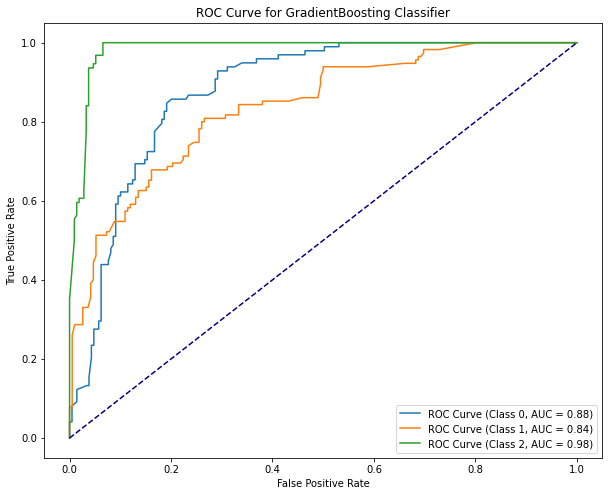


Accuracy: 0.803921568627451
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.73      0.76       113
           1       0.76      0.71      0.73       104
           2       0.87      1.00      0.93        89

    accuracy                           0.80       306
   macro avg       0.80      0.82      0.81       306
weighted avg       0.80      0.80      0.80       306

AUC Class 0: 0.88
AUC Class 1: 0.86
AUC Class 2: 0.98
Log Loss: 0.5361


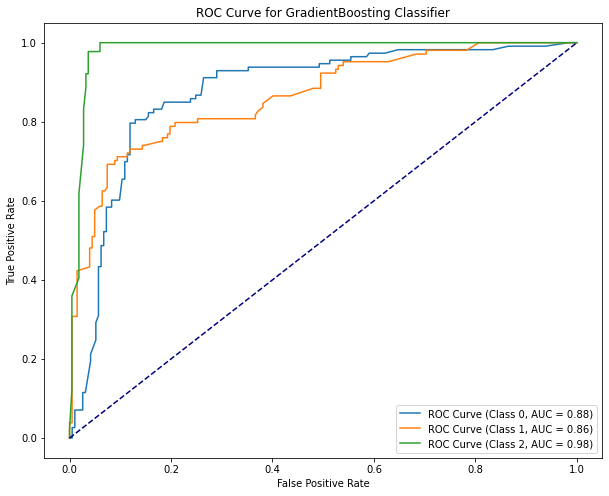


Accuracy: 0.8137254901960784
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.69      0.72       100
           1       0.68      0.72      0.70        89
           2       0.96      0.99      0.97       117

    accuracy                           0.81       306
   macro avg       0.80      0.80      0.80       306
weighted avg       0.81      0.81      0.81       306

AUC Class 0: 0.91
AUC Class 1: 0.89
AUC Class 2: 0.99
Log Loss: 0.4639


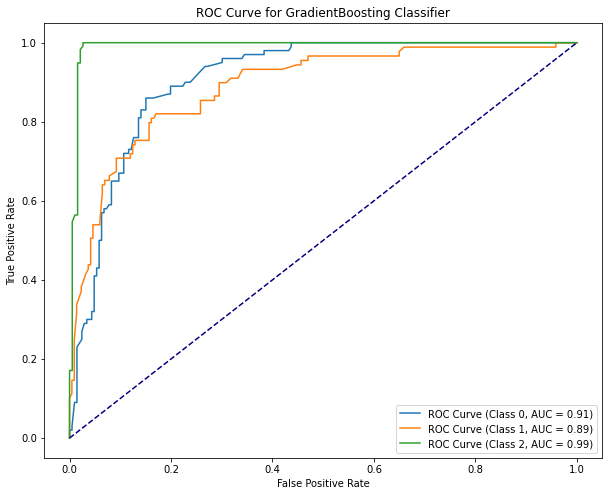


Average Accuracy for 5-fold: 0.7990994443379957
Average AUC for 5-fold: 0.9161490838053755
Average Log Loss for 5-fold: 0.4996011934511184


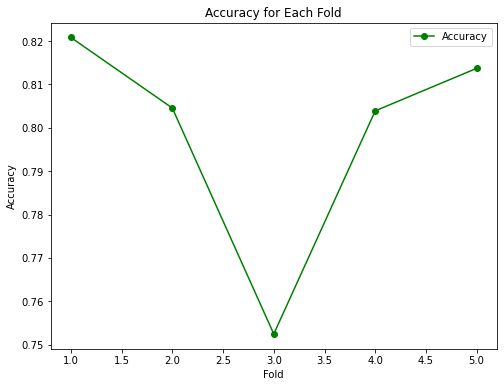

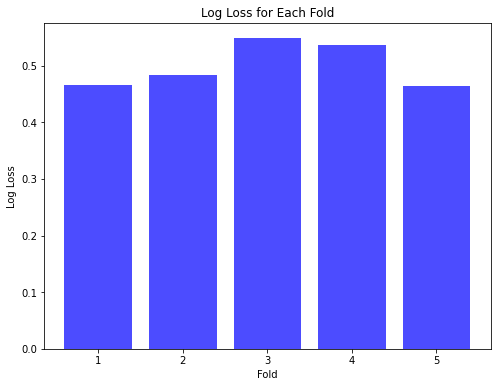


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.820847  0.924518  0.465973
1     2  0.804560  0.919361  0.483549
2     3  0.752443  0.900176  0.548542
3     4  0.803922  0.907449  0.536088
4     5  0.813725  0.929241  0.463854
--------------------------------------------------
KFold=10

Accuracy: 0.8181818181818182
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.79      0.74        42
           1       0.80      0.65      0.72        55
           2       0.92      1.00      0.96        57

    accuracy                           0.82       154
   macro avg       0.81      0.81      0.81       154
weighted avg       0.82      0.82      0.81       154

AUC Class 0: 0.91
AUC Class 1: 0.89
AUC Class 2: 0.99
Log Loss: 0.4595


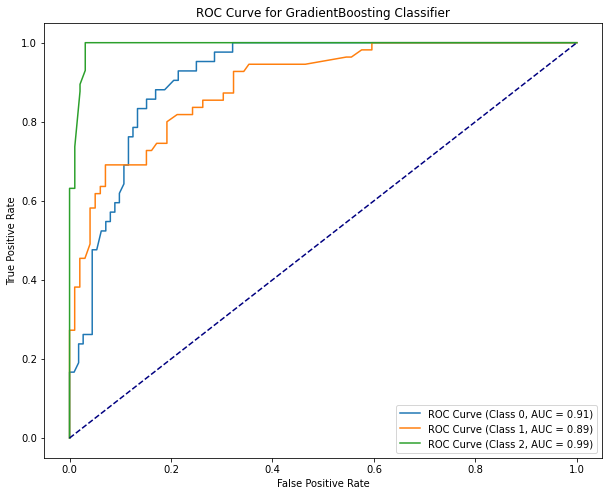


Accuracy: 0.8311688311688312
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.72      0.76        47
           1       0.73      0.73      0.73        49
           2       0.94      1.00      0.97        58

    accuracy                           0.83       154
   macro avg       0.82      0.82      0.82       154
weighted avg       0.83      0.83      0.83       154

AUC Class 0: 0.91
AUC Class 1: 0.87
AUC Class 2: 0.99
Log Loss: 0.4716


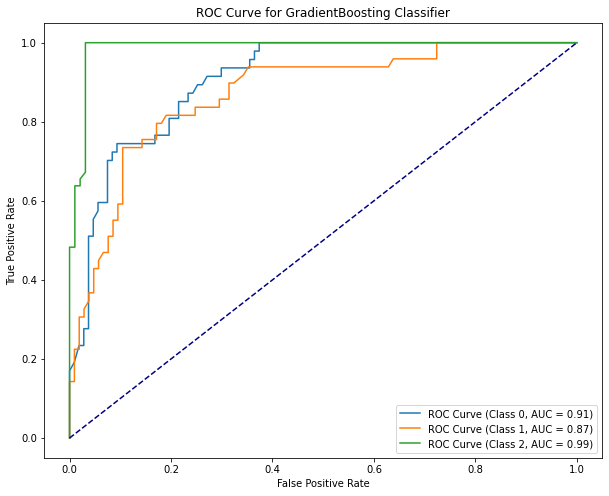


Accuracy: 0.7922077922077922
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.67      0.71        54
           1       0.69      0.73      0.70        51
           2       0.94      1.00      0.97        49

    accuracy                           0.79       154
   macro avg       0.79      0.80      0.79       154
weighted avg       0.79      0.79      0.79       154

AUC Class 0: 0.89
AUC Class 1: 0.88
AUC Class 2: 1.00
Log Loss: 0.4712


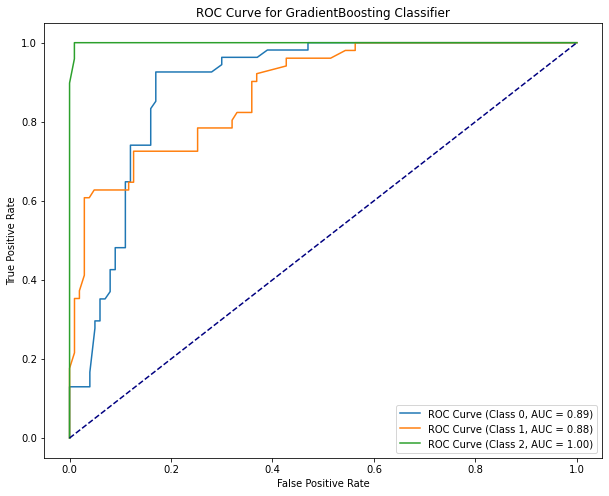


Accuracy: 0.7843137254901961
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.60      0.68        57
           1       0.64      0.80      0.71        49
           2       0.96      1.00      0.98        47

    accuracy                           0.78       153
   macro avg       0.80      0.80      0.79       153
weighted avg       0.79      0.78      0.78       153

AUC Class 0: 0.88
AUC Class 1: 0.88
AUC Class 2: 1.00
Log Loss: 0.4984


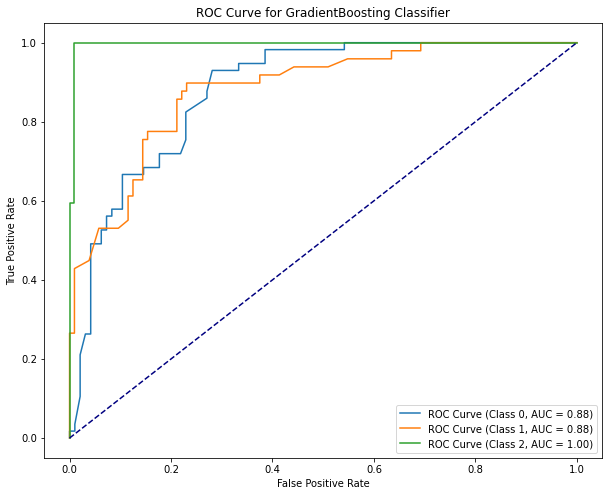


Accuracy: 0.7450980392156863
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.68      0.67        47
           1       0.75      0.61      0.67        62
           2       0.83      1.00      0.91        44

    accuracy                           0.75       153
   macro avg       0.74      0.76      0.75       153
weighted avg       0.74      0.75      0.74       153

AUC Class 0: 0.87
AUC Class 1: 0.83
AUC Class 2: 0.97
Log Loss: 0.5913


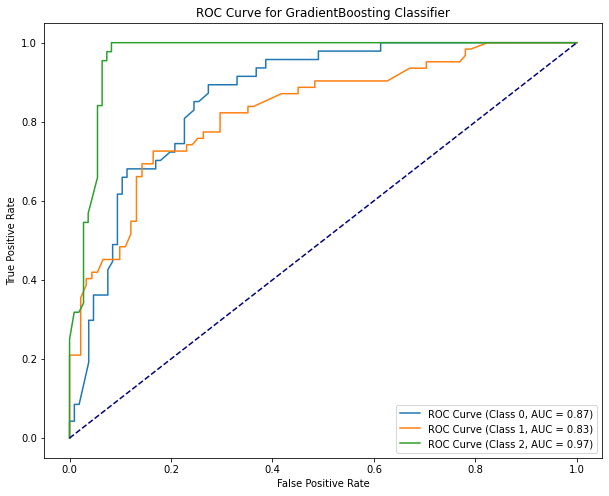


Accuracy: 0.7908496732026143
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.61      0.67        51
           1       0.67      0.77      0.71        52
           2       0.96      1.00      0.98        50

    accuracy                           0.79       153
   macro avg       0.79      0.79      0.79       153
weighted avg       0.79      0.79      0.79       153

AUC Class 0: 0.89
AUC Class 1: 0.87
AUC Class 2: 1.00
Log Loss: 0.5010


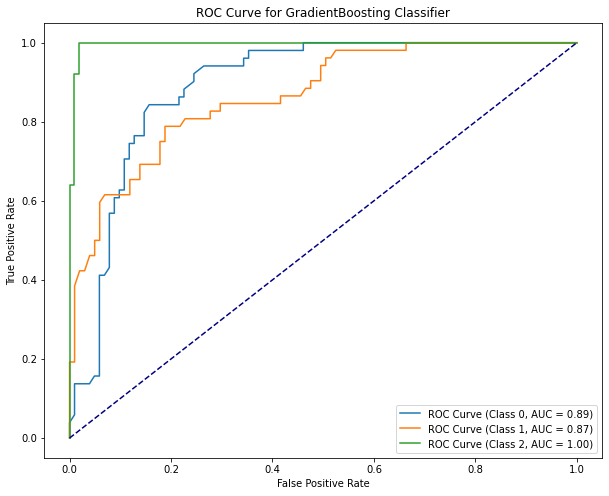


Accuracy: 0.803921568627451
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.78      0.80        64
           1       0.79      0.70      0.74        53
           2       0.80      1.00      0.89        36

    accuracy                           0.80       153
   macro avg       0.80      0.83      0.81       153
weighted avg       0.80      0.80      0.80       153

AUC Class 0: 0.89
AUC Class 1: 0.87
AUC Class 2: 0.99
Log Loss: 0.5541


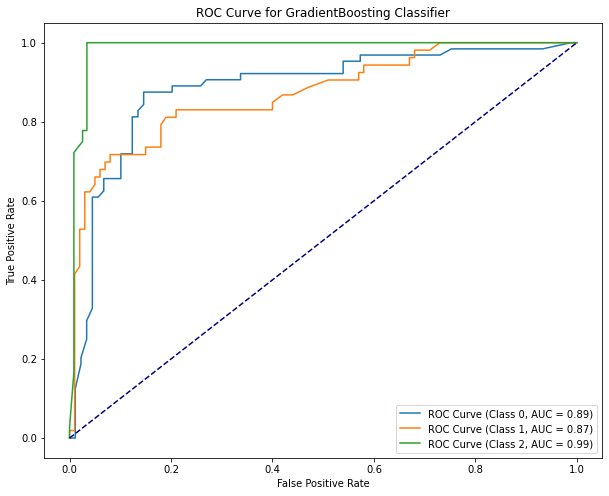


Accuracy: 0.8300653594771242
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.73      0.75        49
           1       0.78      0.75      0.76        51
           2       0.93      1.00      0.96        53

    accuracy                           0.83       153
   macro avg       0.82      0.83      0.82       153
weighted avg       0.83      0.83      0.83       153

AUC Class 0: 0.88
AUC Class 1: 0.87
AUC Class 2: 0.99
Log Loss: 0.5130


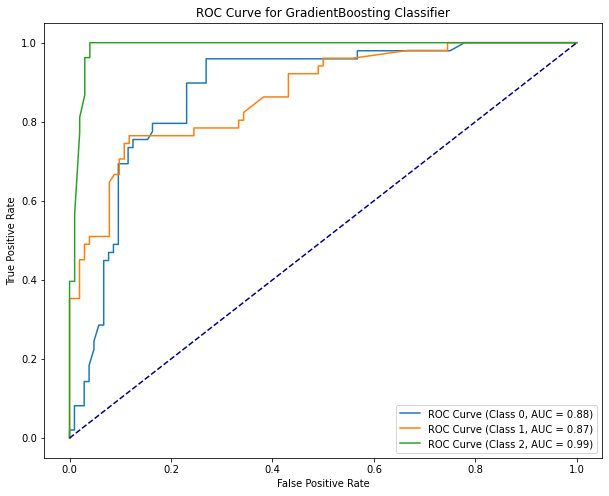


Accuracy: 0.8300653594771242
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.70      0.73        47
           1       0.66      0.69      0.68        39
           2       0.97      1.00      0.99        67

    accuracy                           0.83       153
   macro avg       0.80      0.80      0.80       153
weighted avg       0.83      0.83      0.83       153

AUC Class 0: 0.93
AUC Class 1: 0.89
AUC Class 2: 0.99
Log Loss: 0.4384


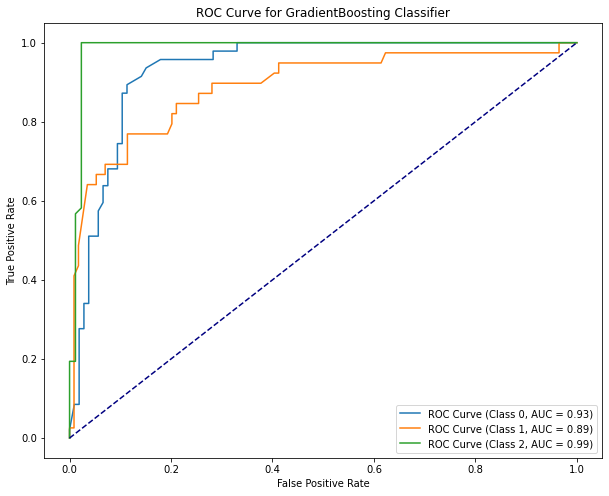


Accuracy: 0.7908496732026143
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.66      0.70        53
           1       0.69      0.74      0.71        50
           2       0.94      0.98      0.96        50

    accuracy                           0.79       153
   macro avg       0.79      0.79      0.79       153
weighted avg       0.79      0.79      0.79       153

AUC Class 0: 0.88
AUC Class 1: 0.88
AUC Class 2: 0.99
Log Loss: 0.4875


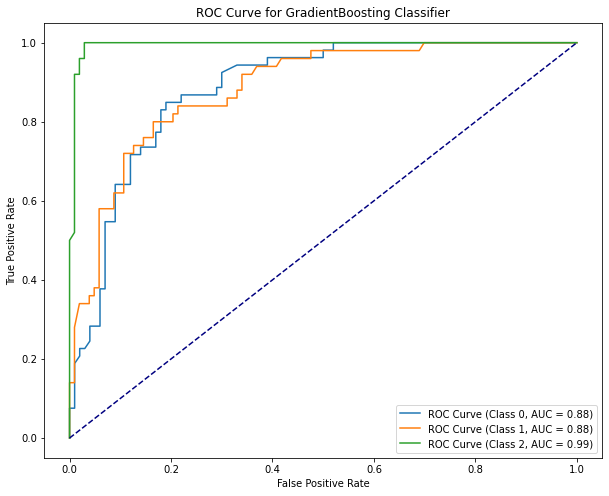


Average Accuracy for 10-fold: 0.8016721840251252
Average AUC for 10-fold: 0.9185905956810008
Average Log Loss for 10-fold: 0.49860474583187153


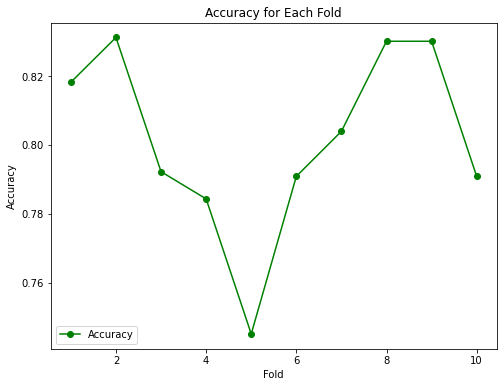

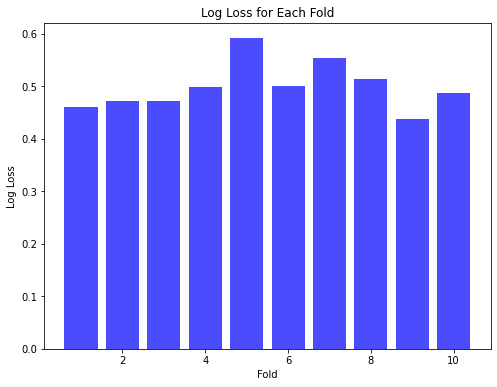


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.818182  0.934031  0.459543
1     2  0.831169  0.921642  0.471585
2     3  0.792208  0.923017  0.471156
3     4  0.784314  0.919312  0.498414
4     5  0.745098  0.886866  0.591342
5     6  0.790850  0.918520  0.501008
6     7  0.803922  0.914146  0.554100
7     8  0.830065  0.911507  0.513014
8     9  0.830065  0.935810  0.438421
9    10  0.790850  0.921055  0.487466
--------------------------------------------------


In [41]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")
    kfold_cv = KFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_resampled)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []  # Initialize fold_log_losses inside the loop

    for train_index, val_index in kfold_cv.split(X_resampled):
        X_train_kfold, X_val_kfold = X_resampled.iloc[train_index], X_resampled.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Membuat model GradientBoostingClassifier
        gradient_boosting_classifier = GradientBoostingClassifier(max_depth=1, random_state=42)

        # Melatih model
        gradient_boosting_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = gradient_boosting_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = gradient_boosting_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i in range(gradient_boosting_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i in range(gradient_boosting_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for GradientBoosting Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    
    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()
    
    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## LGBM fold 5 dan 10

KFold=5
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 1226, number of used features: 6
[LightGBM] [Info] Start training from score -1.064140
[LightGBM] [Info] Start training from score -1.102699
[LightGBM] [Info] Start training from score -1.130098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9381107491856677
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.92      0.91        88
           1       0.93      0.88      0.91       104
           2       0.98      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.93      0.94      0.93       307
weighted avg       0.94      0.94      0.94       307



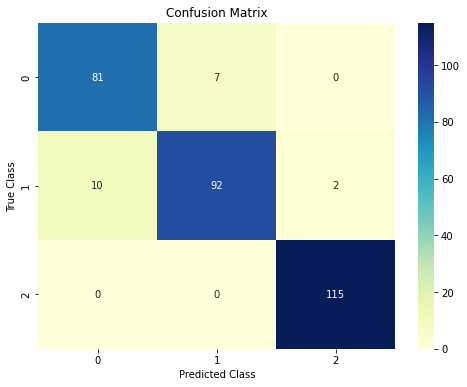

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2147


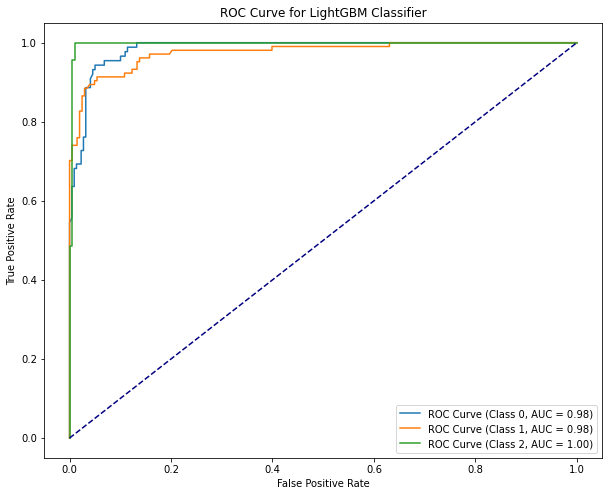

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 1226, number of used features: 6
[LightGBM] [Info] Start training from score -1.122551
[LightGBM] [Info] Start training from score -1.090489
[LightGBM] [Info] Start training from score -1.083234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9120521172638436
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.85      0.88       112
           1       0.86      0.90      0.88        99
           2       0.96      1.00      0.98        96

    accuracy                           0.91       307
   macro avg       0.91      0.92      0.91       307
weighted avg       0.91      0.91      0.91       307



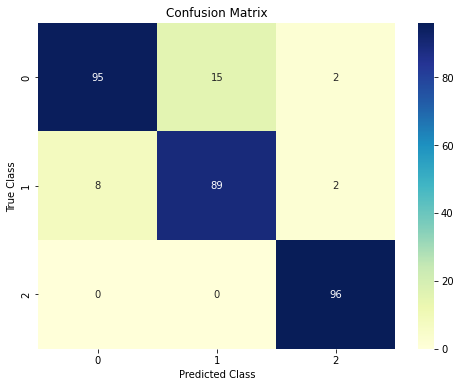

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2694


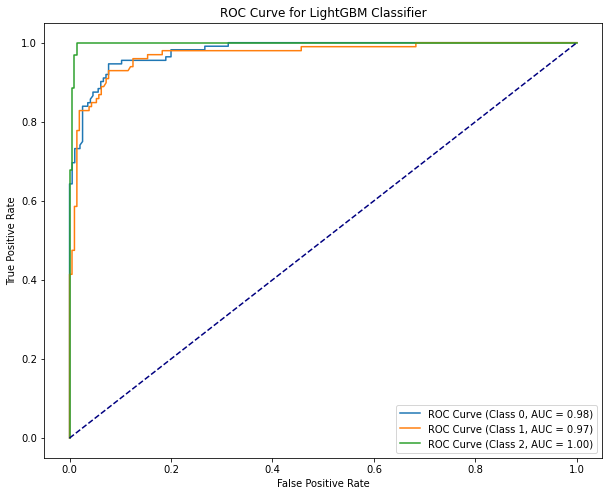

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 1226, number of used features: 6
[LightGBM] [Info] Start training from score -1.088065
[LightGBM] [Info] Start training from score -1.130098
[LightGBM] [Info] Start training from score -1.078426
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9315960912052117
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.93      0.91        98
           1       0.94      0.88      0.91       115
           2       0.96      1.00      0.98        94

    accuracy                           0.93       307
   macro avg       0.93      0.94      0.93       307
weighted avg       0.93      0.93      0.93       307



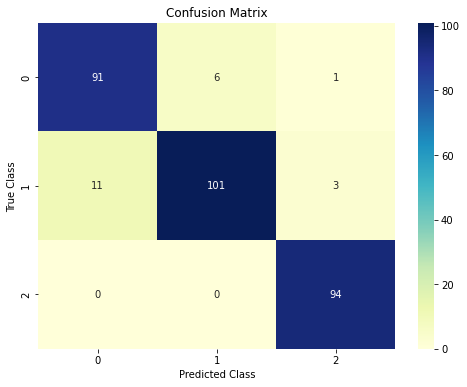

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2322


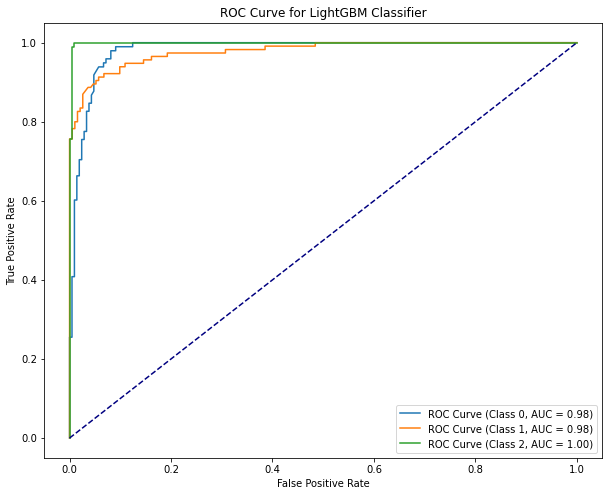

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1082
[LightGBM] [Info] Number of data points in the train set: 1227, number of used features: 6
[LightGBM] [Info] Start training from score -1.125875
[LightGBM] [Info] Start training from score -1.103514
[LightGBM] [Info] Start training from score -1.067322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9084967320261438
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       113
           1       0.90      0.87      0.88       104
           2       0.93      1.00      0.96        89

    accuracy                           0.91       306
   macro avg       0.91      0.91      0.91       306
weighted avg       0.91      0.91      0.91       306



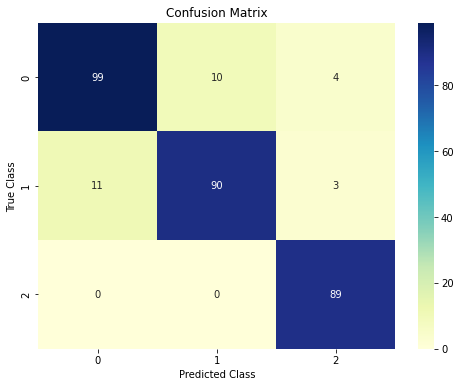

AUC Class 0: 0.97
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.3145


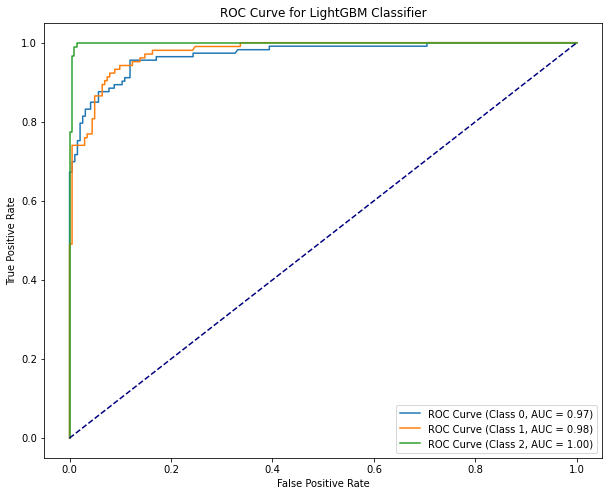

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1073
[LightGBM] [Info] Number of data points in the train set: 1227, number of used features: 6
[LightGBM] [Info] Start training from score -1.093734
[LightGBM] [Info] Start training from score -1.067322
[LightGBM] [Info] Start training from score -1.135977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9215686274509803
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.89      0.89       100
           1       0.87      0.88      0.87        89
           2       0.98      0.98      0.98       117

    accuracy                           0.92       306
   macro avg       0.92      0.92      0.92       306
weighted avg       0.92      0.92      0.92       306



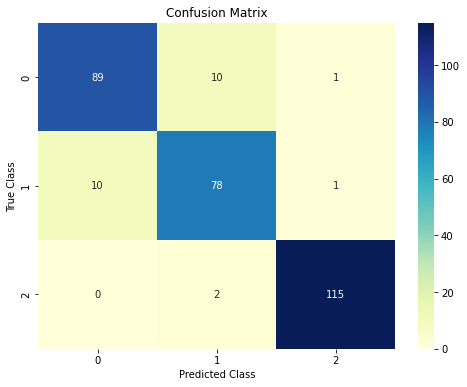

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2141


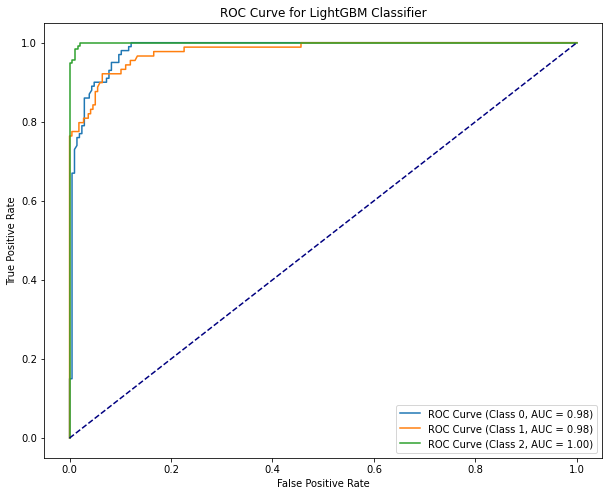


Average Accuracy for 5-fold: 0.9223648634263695
Average AUC for 5-fold: 0.9846454142621799
Average Log Loss for 5-fold: 0.2489529372424871
--------------------------------------------------


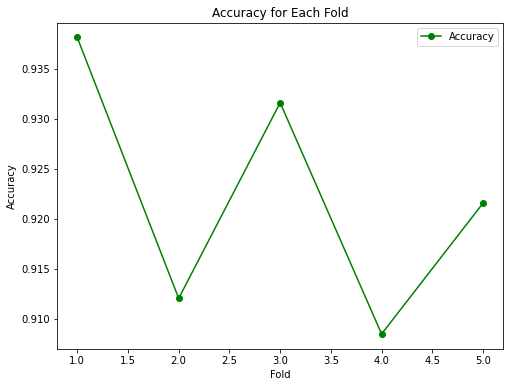

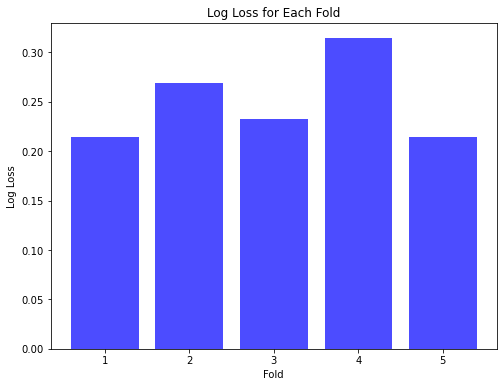


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.938111  0.985947  0.214672
1     2  0.912052  0.982267  0.269383
2     3  0.931596  0.986360  0.232174
3     4  0.908497  0.981720  0.314458
4     5  0.921569  0.986934  0.214078
--------------------------------------------------
KFold=10
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1080
[LightGBM] [Info] Number of data points in the train set: 1379, number of used features: 6
[LightGBM] [Info] Start training from score -1.078511
[LightGBM] [Info] Start training from score -1.106621
[LightGBM] [Info] Start training from score -1.111017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9545454545454546
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93        42
          

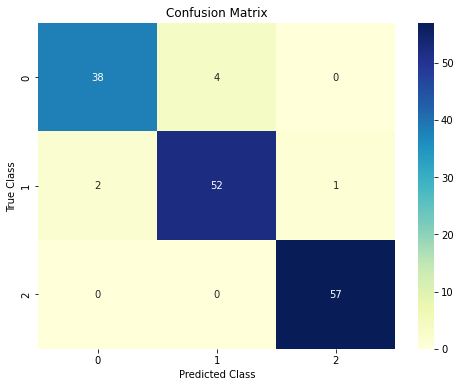

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1497


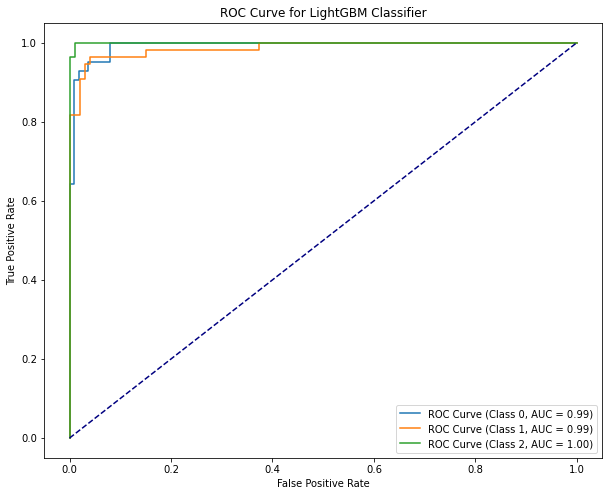

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1080
[LightGBM] [Info] Number of data points in the train set: 1379, number of used features: 6
[LightGBM] [Info] Start training from score -1.089229
[LightGBM] [Info] Start training from score -1.093549
[LightGBM] [Info] Start training from score -1.113222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.922077922077922
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.89      0.88        47
           1       0.89      0.86      0.88        49
           2       0.98      1.00      0.99        58

    accuracy                           0.92       154
   macro avg       0.92      0.92      0.92       154
weighted avg       0.92      0.92      0.92       154



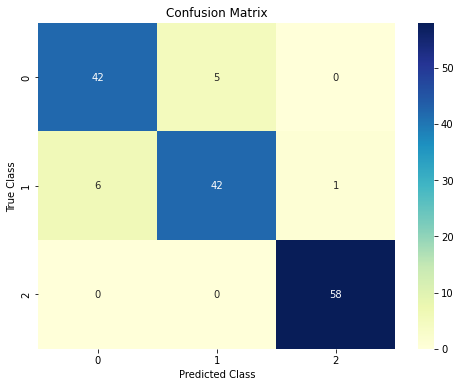

AUC Class 0: 0.98
AUC Class 1: 0.96
AUC Class 2: 1.00
Log Loss: 0.2819


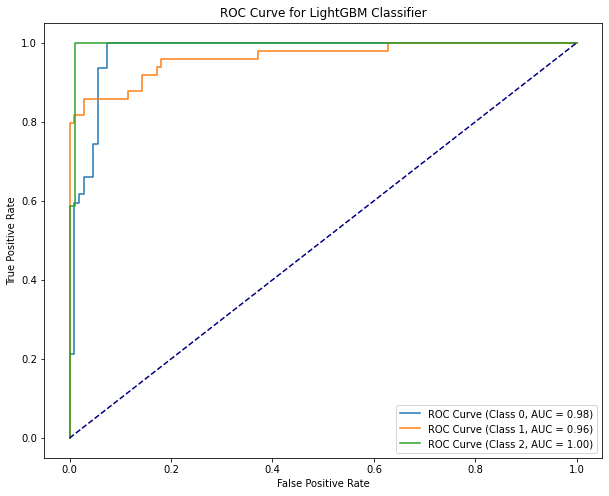

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1080
[LightGBM] [Info] Number of data points in the train set: 1379, number of used features: 6
[LightGBM] [Info] Start training from score -1.104430
[LightGBM] [Info] Start training from score -1.097887
[LightGBM] [Info] Start training from score -1.093549
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9285714285714286
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.87      0.91        54
           1       0.89      0.92      0.90        51
           2       0.94      1.00      0.97        49

    accuracy                           0.93       154
   macro avg       0.93      0.93      0.93       154
weighted avg       0.93      0.93      0.93       154



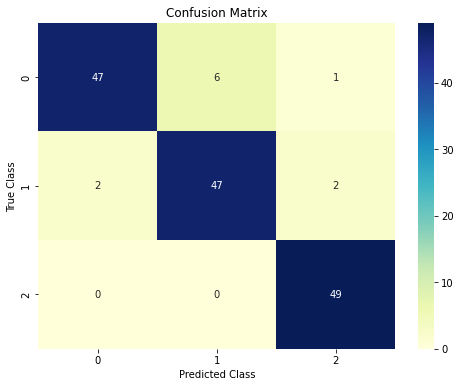

AUC Class 0: 0.99
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2211


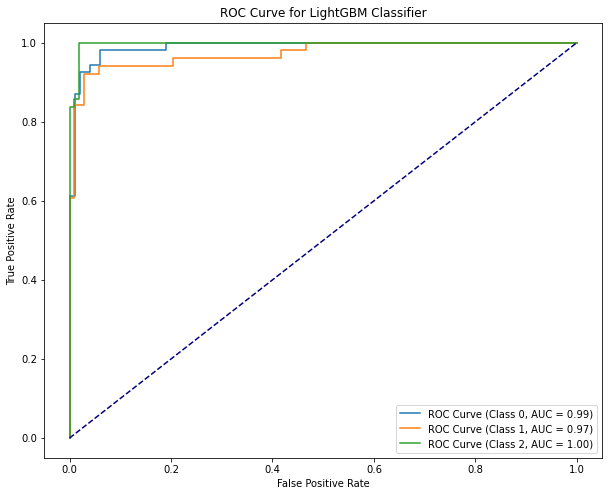

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1079
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.111742
[LightGBM] [Info] Start training from score -1.094274
[LightGBM] [Info] Start training from score -1.089954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9281045751633987
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.88      0.90        57
           1       0.88      0.92      0.90        49
           2       0.98      1.00      0.99        47

    accuracy                           0.93       153
   macro avg       0.93      0.93      0.93       153
weighted avg       0.93      0.93      0.93       153



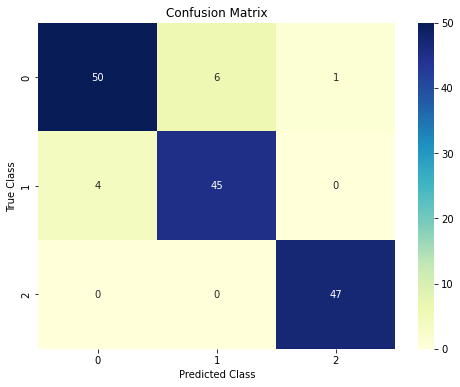

AUC Class 0: 0.97
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2527


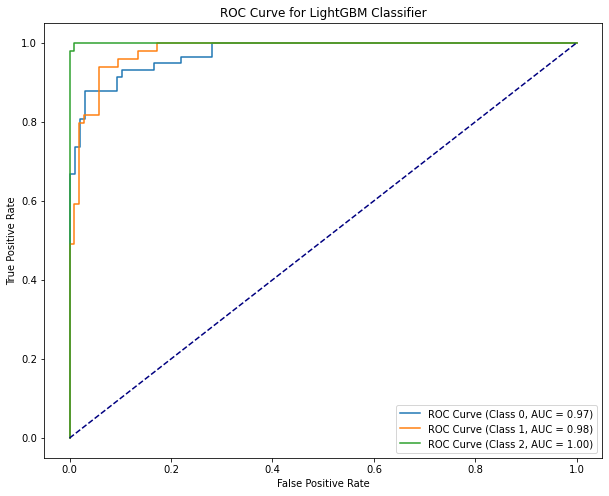

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1083
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.089954
[LightGBM] [Info] Start training from score -1.122816
[LightGBM] [Info] Start training from score -1.083510
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94        47
           1       0.96      0.89      0.92        62
           2       0.90      1.00      0.95        44

    accuracy                           0.93       153
   macro avg       0.93      0.94      0.94       153
weighted avg       0.94      0.93      0.93       153



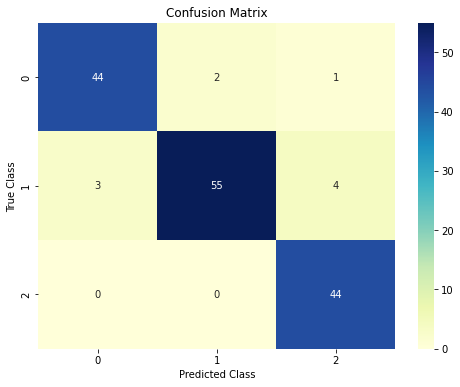

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1957


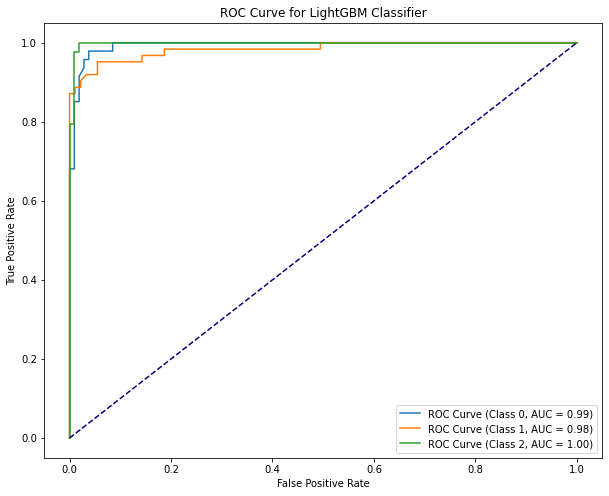

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1077
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.100789
[LightGBM] [Info] Start training from score -1.096441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9215686274509803
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.90      0.88        51
           1       0.90      0.87      0.88        52
           2       1.00      1.00      1.00        50

    accuracy                           0.92       153
   macro avg       0.92      0.92      0.92       153
weighted avg       0.92      0.92      0.92       153



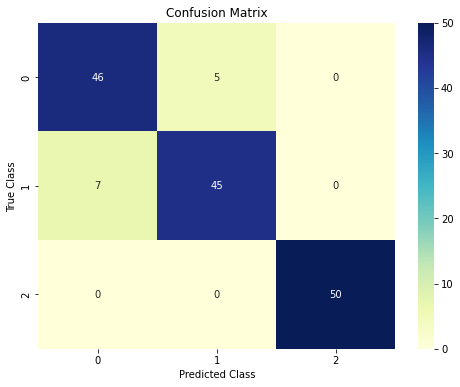

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2489


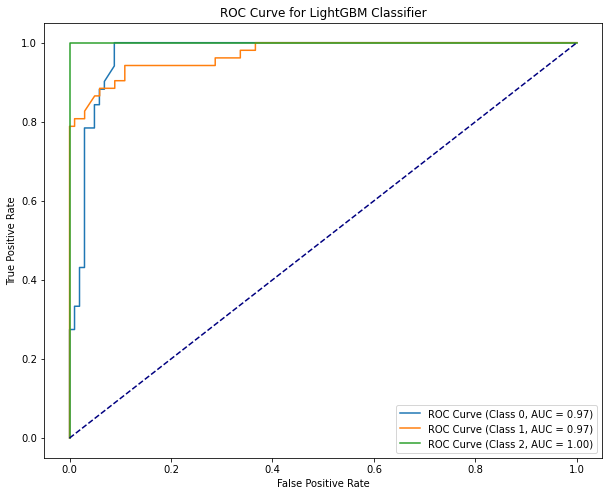

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1077
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.127280
[LightGBM] [Info] Start training from score -1.102970
[LightGBM] [Info] Start training from score -1.066524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.8758169934640523
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.83      0.85        64
           1       0.83      0.85      0.84        53
           2       0.92      1.00      0.96        36

    accuracy                           0.88       153
   macro avg       0.88      0.89      0.89       153
weighted avg       0.88      0.88      0.87       153



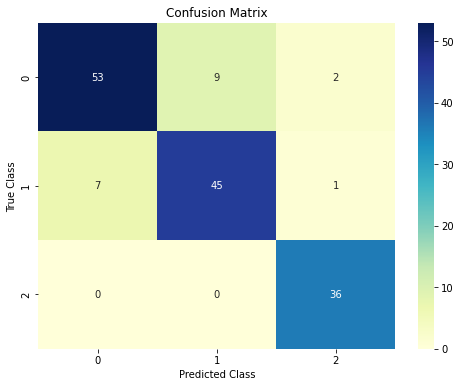

AUC Class 0: 0.96
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.3867


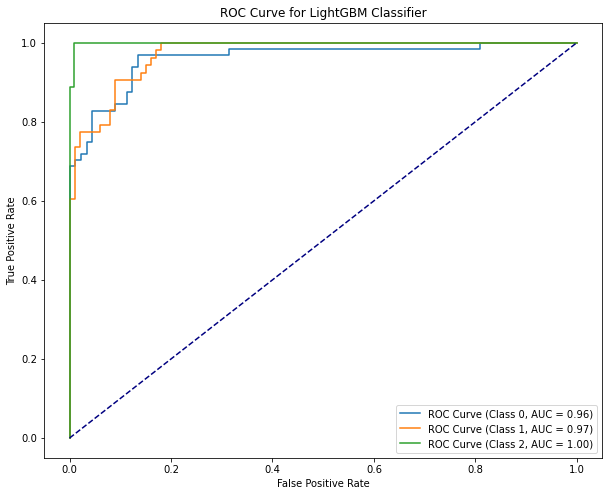

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1081
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.094274
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.102970
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91        49
           1       0.94      0.88      0.91        51
           2       0.96      1.00      0.98        53

    accuracy                           0.93       153
   macro avg       0.93      0.93      0.93       153
weighted avg       0.93      0.93      0.93       153



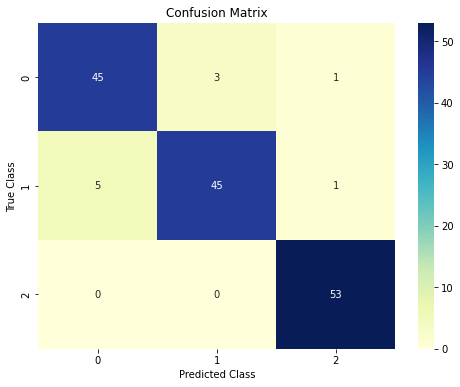

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2105


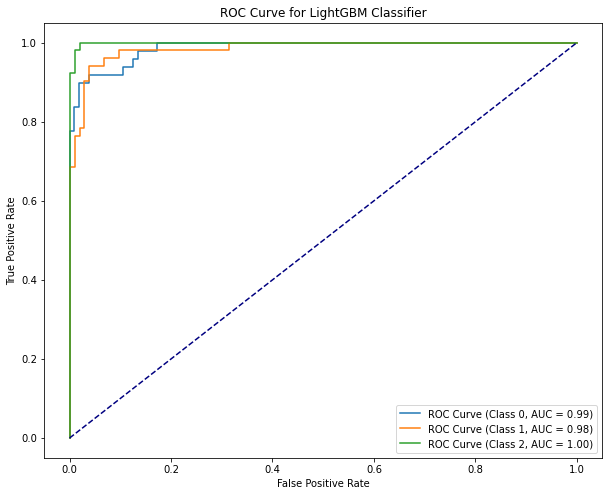

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1080
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.089954
[LightGBM] [Info] Start training from score -1.072860
[LightGBM] [Info] Start training from score -1.134014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9215686274509803
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.91      0.90        47
           1       0.89      0.82      0.85        39
           2       0.97      0.99      0.98        67

    accuracy                           0.92       153
   macro avg       0.91      0.91      0.91       153
weighted avg       0.92      0.92      0.92       153



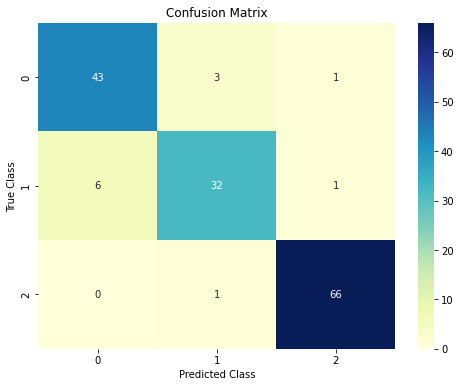

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2671


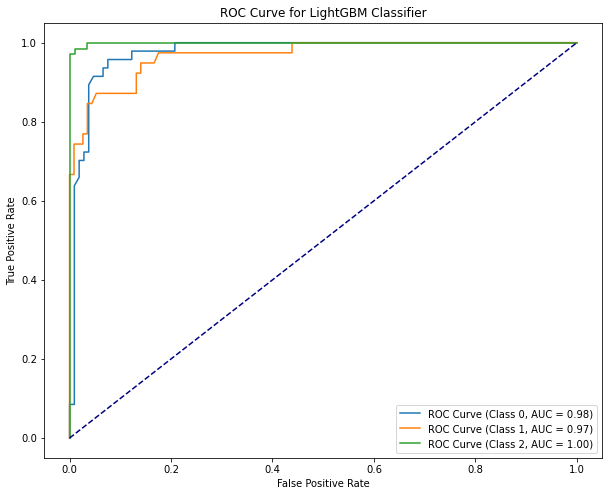

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1079
[LightGBM] [Info] Number of data points in the train set: 1380, number of used features: 6
[LightGBM] [Info] Start training from score -1.102970
[LightGBM] [Info] Start training from score -1.096441
[LightGBM] [Info] Start training from score -1.096441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Accuracy: 0.9411764705882353
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92        53
           1       0.92      0.92      0.92        50
           2       0.98      0.98      0.98        50

    accuracy                           0.94       153
   macro avg       0.94      0.94      0.94       153
weighted avg       0.94      0.94      0.94       153



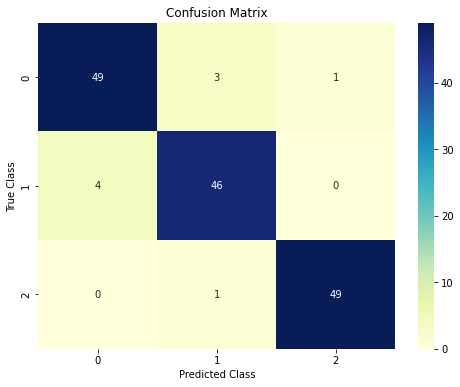

AUC Class 0: 0.98
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1725


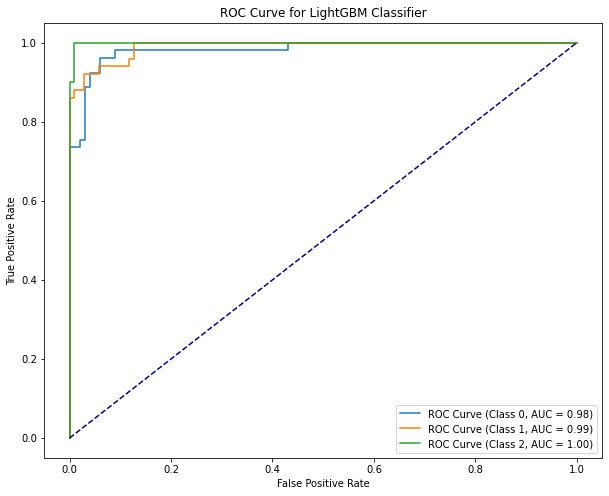


Average Accuracy for 10-fold: 0.9262711145064086
Average AUC for 10-fold: 0.9853751091423849
Average Log Loss for 10-fold: 0.2386684084652501
--------------------------------------------------


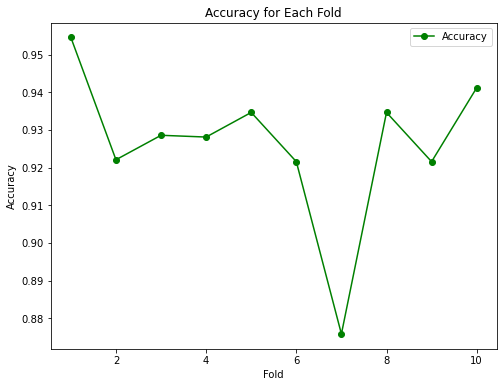

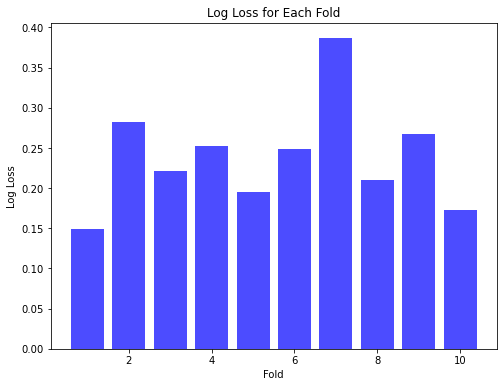


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.954545  0.992992  0.149734
1     2  0.922078  0.977970  0.281862
2     3  0.928571  0.986622  0.221105
3     4  0.928105  0.984289  0.252678
4     5  0.934641  0.991784  0.195663
5     6  0.921569  0.981316  0.248905
6     7  0.875817  0.977145  0.386695
7     8  0.934641  0.989982  0.210483
8     9  0.921569  0.981251  0.267078
9    10  0.941176  0.990401  0.172479
--------------------------------------------------


In [42]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")
    kfold_cv = KFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_resampled)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for train_index, val_index in kfold_cv.split(X_resampled):
        X_train_kfold, X_val_kfold = X_resampled.iloc[train_index], X_resampled.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Membuat model LightGBM
        lgbm_classifier = LGBMClassifier(random_state=42)

        # Melatih model
        lgbm_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = lgbm_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Visualisasi Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_mat, annot=True, fmt=".0f", cmap="YlGnBu")
        plt.title("Confusion Matrix")
        plt.xlabel("Predicted Class")
        plt.ylabel("True Class")
        plt.show()

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = lgbm_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        for i in range(lgbm_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {label_encoder.classes_[i]}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i in range(lgbm_classifier.n_classes_):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {label_encoder.classes_[i]}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for LightGBM Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))
    print("--------------------------------------------------")
    
    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()
    
    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)
    print("--------------------------------------------------")


## CatBoosting FOLD 5 dan 10 SMOTE

KFold=5

Accuracy: 0.9381107491856677
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91        88
           1       0.93      0.88      0.91       104
           2       0.97      1.00      0.99       115

    accuracy                           0.94       307
   macro avg       0.93      0.94      0.93       307
weighted avg       0.94      0.94      0.94       307

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1848


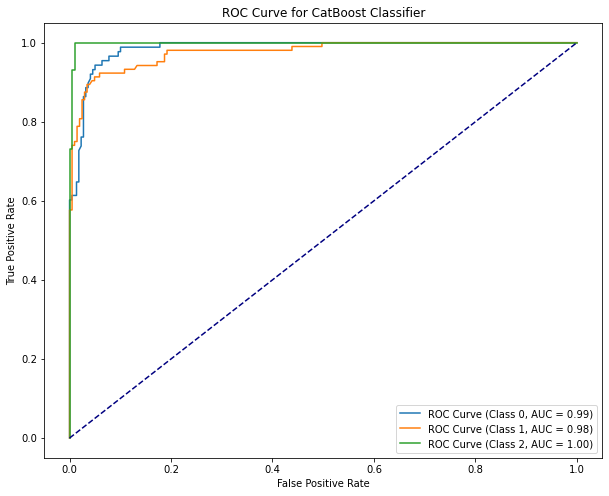


Accuracy: 0.9055374592833876
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.83      0.87       112
           1       0.87      0.90      0.89        99
           2       0.92      1.00      0.96        96

    accuracy                           0.91       307
   macro avg       0.91      0.91      0.91       307
weighted avg       0.91      0.91      0.90       307

AUC Class 0: 0.97
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2685


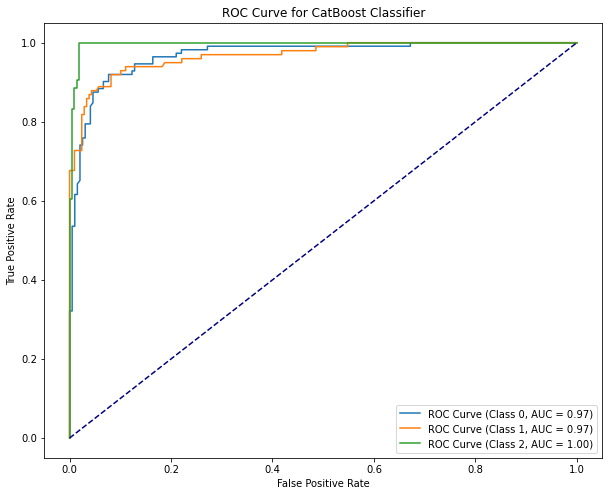


Accuracy: 0.9381107491856677
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.95      0.92        98
           1       0.95      0.88      0.91       115
           2       0.97      1.00      0.98        94

    accuracy                           0.94       307
   macro avg       0.94      0.94      0.94       307
weighted avg       0.94      0.94      0.94       307

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1879


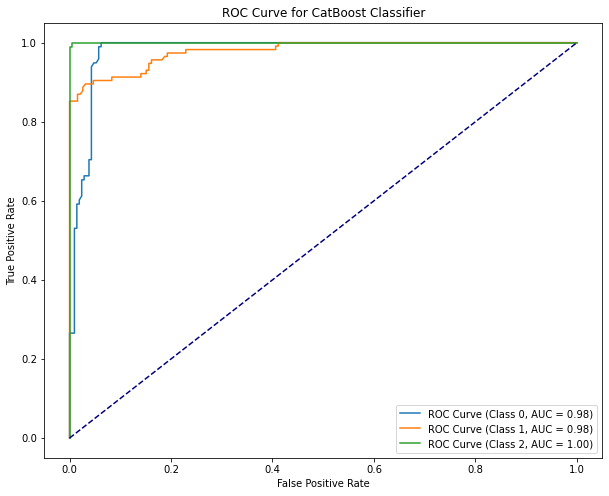


Accuracy: 0.9084967320261438
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       113
           1       0.88      0.87      0.87       104
           2       0.95      1.00      0.97        89

    accuracy                           0.91       306
   macro avg       0.91      0.91      0.91       306
weighted avg       0.91      0.91      0.91       306

AUC Class 0: 0.97
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.2355


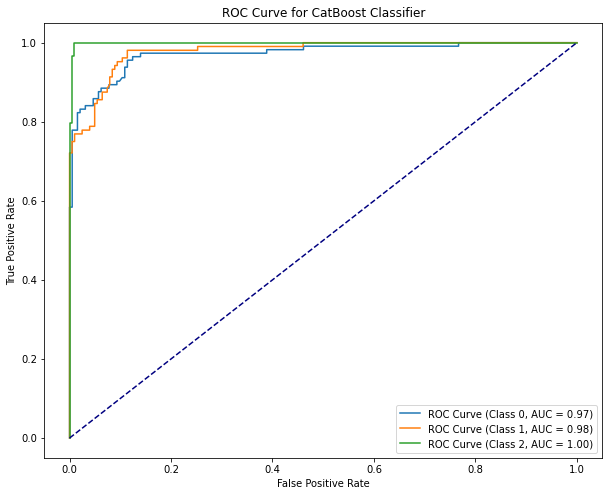


Accuracy: 0.9313725490196079
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.91      0.90       100
           1       0.90      0.87      0.88        89
           2       0.99      1.00      1.00       117

    accuracy                           0.93       306
   macro avg       0.93      0.93      0.93       306
weighted avg       0.93      0.93      0.93       306

AUC Class 0: 0.98
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1867


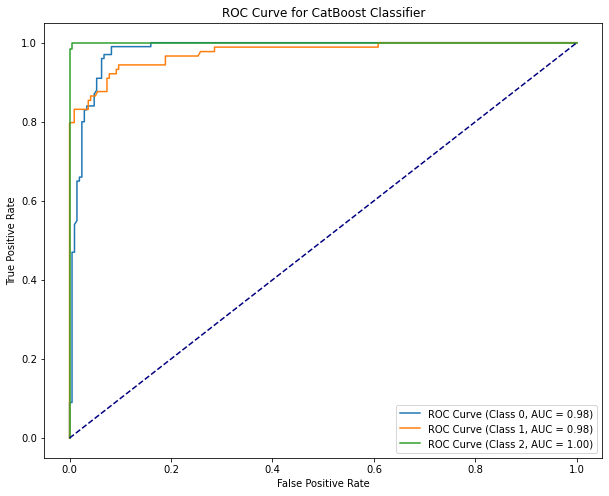


Average Accuracy for 5-fold: 0.924325647740095
Average AUC for 5-fold: 0.983746340296791
Average Log Loss for 5-fold: 0.21267664069040837


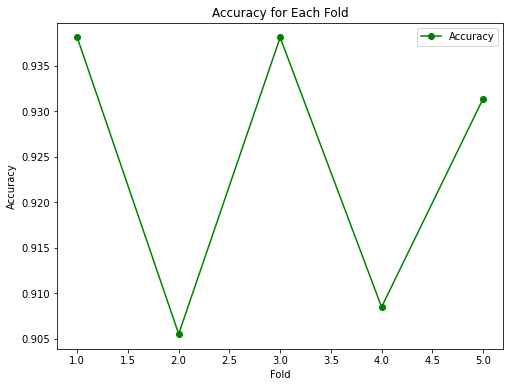

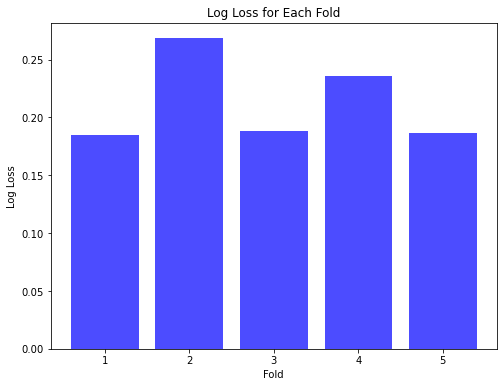


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.938111  0.986532  0.184797
1     2  0.905537  0.978009  0.268485
2     3  0.938111  0.986211  0.187897
3     4  0.908497  0.982816  0.235472
4     5  0.931373  0.985164  0.186732
--------------------------------------------------
KFold=10

Accuracy: 0.948051948051948
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.88      0.91        42
           1       0.91      0.95      0.93        55
           2       0.98      1.00      0.99        57

    accuracy                           0.95       154
   macro avg       0.95      0.94      0.94       154
weighted avg       0.95      0.95      0.95       154

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1385


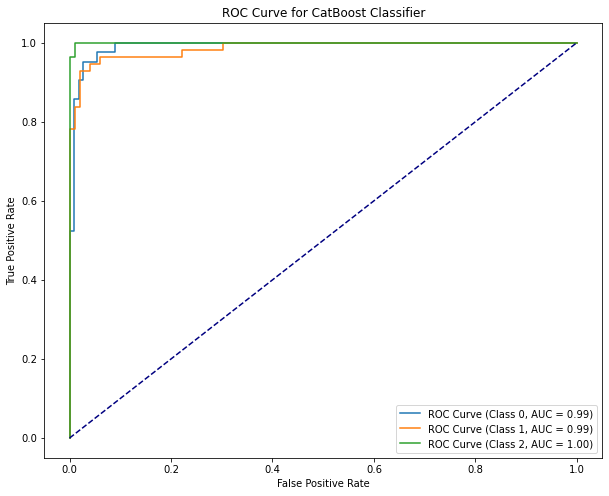


Accuracy: 0.922077922077922
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.87      0.88        47
           1       0.88      0.88      0.88        49
           2       0.98      1.00      0.99        58

    accuracy                           0.92       154
   macro avg       0.92      0.92      0.92       154
weighted avg       0.92      0.92      0.92       154

AUC Class 0: 0.98
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2278


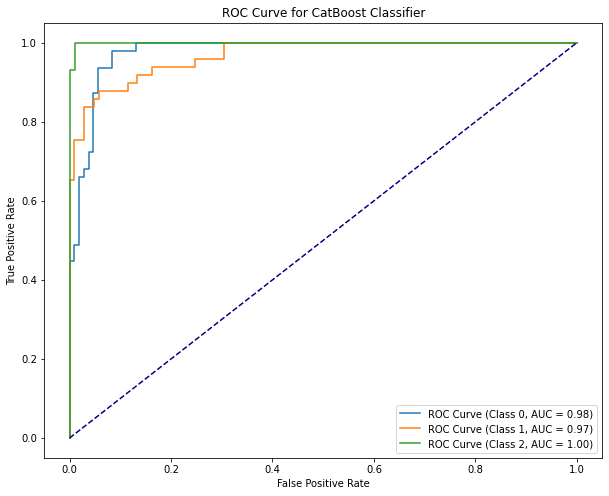


Accuracy: 0.935064935064935
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.91      0.92        54
           1       0.92      0.90      0.91        51
           2       0.94      1.00      0.97        49

    accuracy                           0.94       154
   macro avg       0.93      0.94      0.94       154
weighted avg       0.93      0.94      0.93       154

AUC Class 0: 0.99
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2082


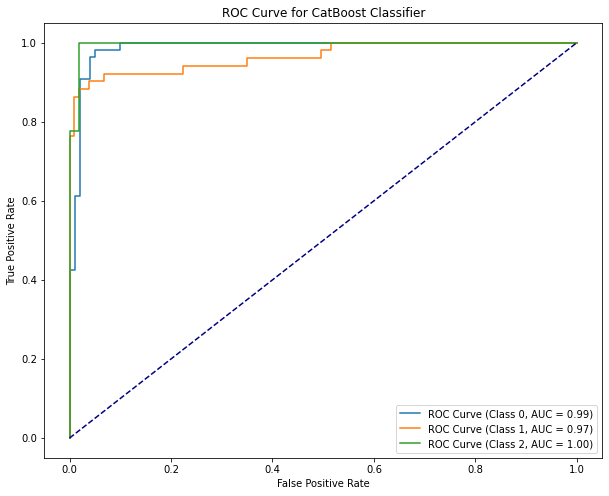


Accuracy: 0.9019607843137255
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.82      0.86        57
           1       0.88      0.90      0.89        49
           2       0.92      1.00      0.96        47

    accuracy                           0.90       153
   macro avg       0.90      0.91      0.90       153
weighted avg       0.90      0.90      0.90       153

AUC Class 0: 0.95
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2867


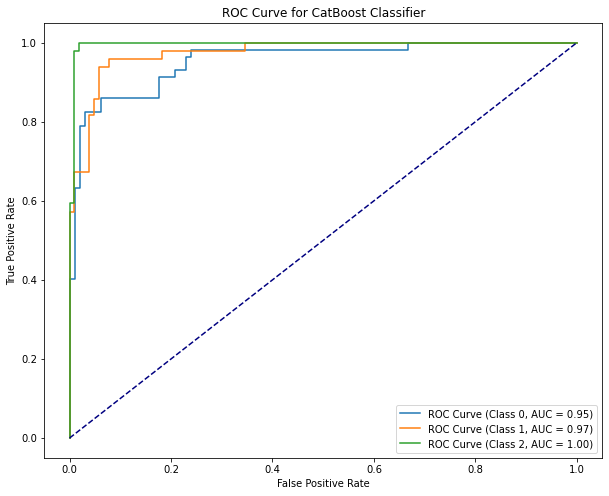


Accuracy: 0.9477124183006536
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95        47
           1       0.97      0.90      0.93        62
           2       0.94      1.00      0.97        44

    accuracy                           0.95       153
   macro avg       0.95      0.95      0.95       153
weighted avg       0.95      0.95      0.95       153

AUC Class 0: 0.99
AUC Class 1: 0.99
AUC Class 2: 1.00
Log Loss: 0.1573


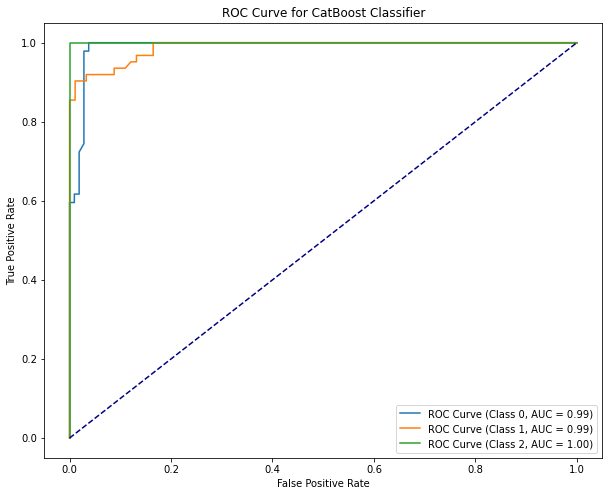


Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.94      0.91        51
           1       0.94      0.87      0.90        52
           2       1.00      1.00      1.00        50

    accuracy                           0.93       153
   macro avg       0.94      0.94      0.94       153
weighted avg       0.94      0.93      0.93       153

AUC Class 0: 0.97
AUC Class 1: 0.96
AUC Class 2: 1.00
Log Loss: 0.2137


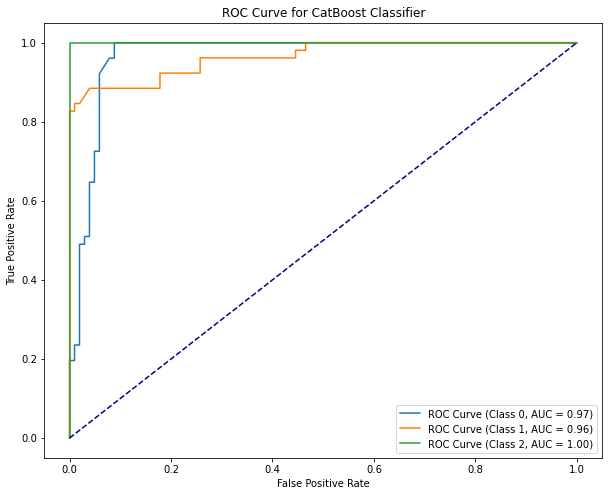


Accuracy: 0.8888888888888888
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.84      0.87        64
           1       0.84      0.87      0.85        53
           2       0.95      1.00      0.97        36

    accuracy                           0.89       153
   macro avg       0.89      0.90      0.90       153
weighted avg       0.89      0.89      0.89       153

AUC Class 0: 0.96
AUC Class 1: 0.97
AUC Class 2: 1.00
Log Loss: 0.2947


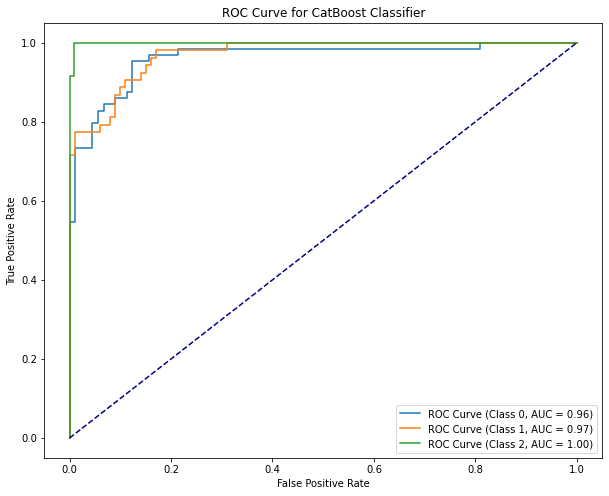


Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.94      0.91        49
           1       0.94      0.86      0.90        51
           2       0.98      1.00      0.99        53

    accuracy                           0.93       153
   macro avg       0.93      0.93      0.93       153
weighted avg       0.94      0.93      0.93       153

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1798


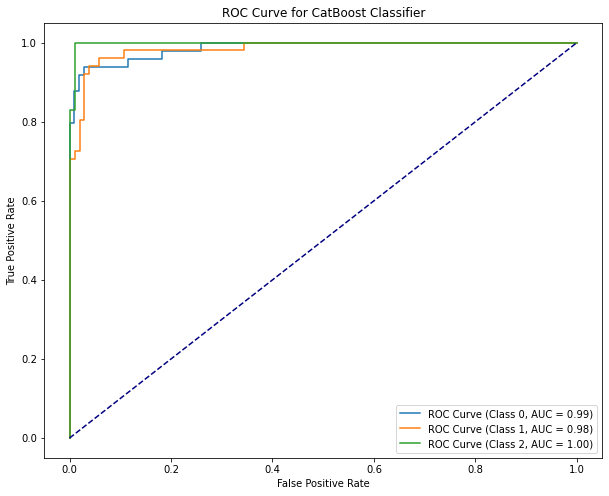


Accuracy: 0.9215686274509803
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.91      0.89        47
           1       0.89      0.79      0.84        39
           2       0.99      1.00      0.99        67

    accuracy                           0.92       153
   macro avg       0.91      0.90      0.91       153
weighted avg       0.92      0.92      0.92       153

AUC Class 0: 0.97
AUC Class 1: 0.96
AUC Class 2: 1.00
Log Loss: 0.2152


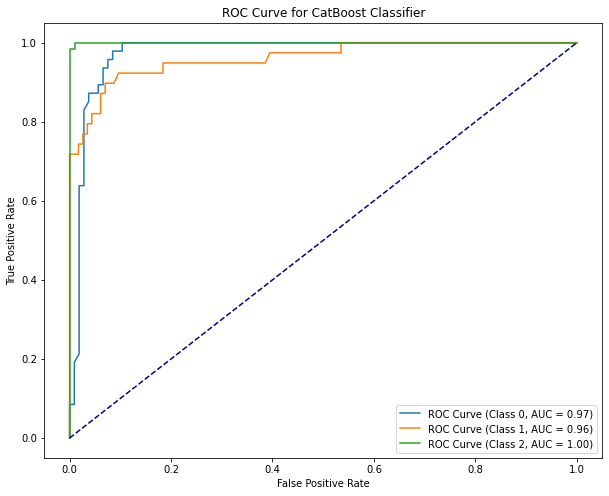


Accuracy: 0.934640522875817
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91        53
           1       0.90      0.90      0.90        50
           2       1.00      1.00      1.00        50

    accuracy                           0.93       153
   macro avg       0.94      0.94      0.94       153
weighted avg       0.93      0.93      0.93       153

AUC Class 0: 0.99
AUC Class 1: 0.98
AUC Class 2: 1.00
Log Loss: 0.1628


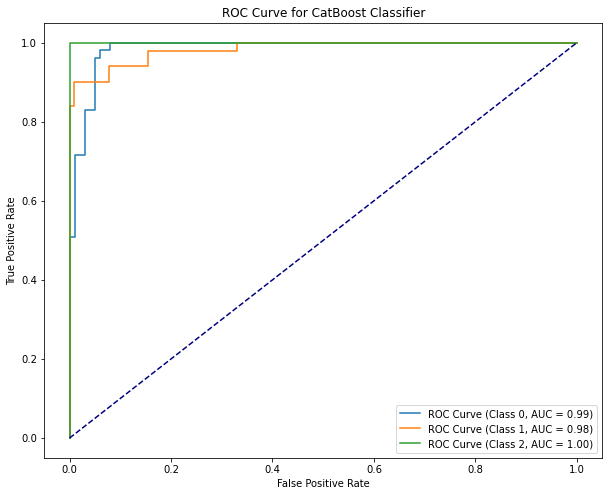


Average Accuracy for 10-fold: 0.9269247092776505
Average AUC for 10-fold: 0.9836161384243038
Average Log Loss for 10-fold: 0.20846599402302318


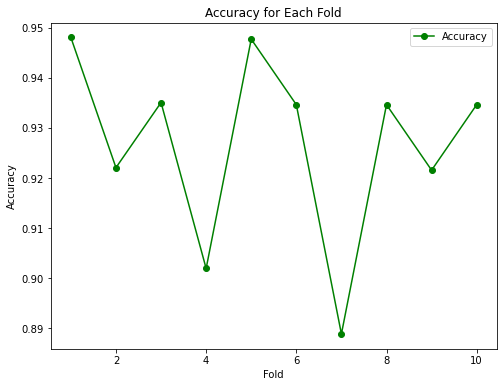

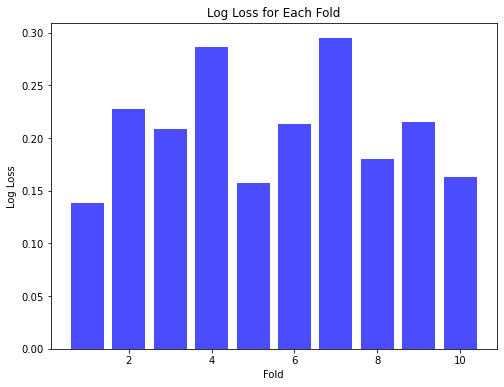


Fold Summary:
   Fold  Accuracy       AUC  Log Loss
0     1  0.948052  0.992454  0.138539
1     2  0.922078  0.981774  0.227794
2     3  0.935065  0.982830  0.208248
3     4  0.901961  0.974868  0.286697
4     5  0.947712  0.992692  0.157273
5     6  0.934641  0.977174  0.213704
6     7  0.888889  0.976834  0.294679
7     8  0.934641  0.989602  0.179761
8     9  0.921569  0.978341  0.215199
9    10  0.934641  0.989593  0.162766
--------------------------------------------------


In [43]:
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, log_loss
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# List of KFolds
kfolds = [5, 10]

for kfold in kfolds:
    print(f"KFold={kfold}")
    kfold_cv = KFold(n_splits=kfold, shuffle=True, random_state=42)

    # Encoding string labels to integer labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y_resampled)

    fold_accuracies = []
    fold_auc_scores = []
    fold_log_losses = []

    for train_index, val_index in kfold_cv.split(X_resampled):
        X_train_kfold, X_val_kfold = X_resampled.iloc[train_index], X_resampled.iloc[val_index]
        y_train_kfold, y_val_kfold = y_encoded[train_index], y_encoded[val_index]

        # Membuat model CatBoost
        catboost_classifier = CatBoostClassifier(random_state=42, verbose=0)

        # Melatih model
        catboost_classifier.fit(X_train_kfold, y_train_kfold)

        # Melakukan prediksi pada data validasi
        y_pred = catboost_classifier.predict(X_val_kfold)

        # Evaluasi model
        accuracy = accuracy_score(y_val_kfold, y_pred)
        report = classification_report(y_val_kfold, y_pred)
        confusion_mat = confusion_matrix(y_val_kfold, y_pred)

        print("\nAccuracy:", accuracy)
        print("Classification Report:\n", report)

        # Menghitung probabilitas prediksi untuk setiap kelas
        y_probabilities = catboost_classifier.predict_proba(X_val_kfold)

        # Menghitung nilai AUC untuk setiap kelas
        auc_scores = []
        classes = catboost_classifier.classes_
        for i in range(len(classes)):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            auc_scores.append(roc_auc)
            print(f"AUC Class {classes[i]}: {roc_auc:.2f}")

        # Menghitung log loss
        logloss = log_loss(y_val_kfold, y_probabilities)
        fold_log_losses.append(logloss)
        print(f'Log Loss: {logloss:.4f}')

        fold_accuracies.append(accuracy)
        fold_auc_scores.append(np.mean(auc_scores))

        # Menampilkan kurva ROC untuk setiap kelas
        plt.figure(figsize=(10, 8))
        for i in range(len(classes)):
            fpr, tpr, _ = roc_curve(label_binarize(y_val_kfold, classes=[i]),
                                    y_probabilities[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"ROC Curve (Class {classes[i]}, AUC = {roc_auc:.2f})")

        plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for CatBoost Classifier')
        plt.legend()

        plt.show()

    # Menampilkan rata-rata akurasi, AUC, dan log loss untuk fold tersebut
    print(f"\nAverage Accuracy for {kfold}-fold:", np.mean(fold_accuracies))
    print(f"Average AUC for {kfold}-fold:", np.mean(fold_auc_scores))
    print(f"Average Log Loss for {kfold}-fold:", np.mean(fold_log_losses))

    # Visualisasi Akurasi untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, kfold + 1), fold_accuracies, marker='o', linestyle='-', color='green', label='Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy for Each Fold')
    plt.legend()
    plt.show()

    # Visualisasi Log Loss untuk setiap fold
    plt.figure(figsize=(8, 6))
    plt.bar(range(1, kfold + 1), fold_log_losses, color='blue', alpha=0.7)
    plt.xlabel('Fold')
    plt.ylabel('Log Loss')
    plt.title('Log Loss for Each Fold')
    plt.show()
    
    # Menampilkan summary untuk setiap fold
    fold_summary = pd.DataFrame({
        'Fold': np.arange(1, kfold + 1),
        'Accuracy': fold_accuracies,
        'AUC': fold_auc_scores,
        'Log Loss': fold_log_losses
    })
    print("\nFold Summary:")
    print(fold_summary)

    print("--------------------------------------------------")
